In [1]:
# General
import sys
import os.path as op
from time import time
from collections import OrderedDict as od
from importlib import reload
import warnings
from glob import glob
import itertools
import h5py

# Scientific
import numpy as np
import pandas as pd
pd.options.display.max_rows = 200
pd.options.display.max_columns = 999
import scipy.io as sio

# Stats
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import random
from sklearn.preprocessing import minmax_scale
from sklearn.decomposition import PCA
from scipy.ndimage.filters import gaussian_filter1d

# Plots
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib as mpl
from matplotlib.lines import Line2D
import matplotlib.path as mpath
import matplotlib.patches as patches
from matplotlib.backends.backend_pdf import PdfPages
mpl.rcParams['grid.linewidth'] = 0.1
mpl.rcParams['grid.alpha'] = 0.75
mpl.rcParams['axes.linewidth'] = 0.5
mpl.rcParams['axes.grid'] = False
mpl.rcParams['axes.axisbelow'] = True
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.formatter.offset_threshold'] = 2
mpl.rcParams['errorbar.capsize'] = 4
mpl.rcParams['lines.linewidth'] = 0.8
mpl.rcParams['lines.markersize'] = 3
mpl.rcParams['lines.markeredgewidth'] = 0
mpl.rcParams['font.size'] = 6
mpl.rcParams['font.sans-serif'] = ['Helvetica']
mpl.rcParams['xtick.labelsize'] = 7
mpl.rcParams['ytick.labelsize'] = 7
mpl.rcParams['xtick.major.pad'] = 2.5
mpl.rcParams['ytick.major.pad'] = 2.5
mpl.rcParams['xtick.major.size'] = 2.5
mpl.rcParams['ytick.major.size'] = 2.5
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['axes.labelpad'] = 6
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['figure.titlesize'] = 10
mpl.rcParams['legend.fontsize'] = 6
mpl.rcParams['legend.handletextpad'] = 2.5
mpl.rcParams['legend.borderpad'] = 0
mpl.rcParams['legend.loc'] = 'upper right'
mpl.rcParams['legend.frameon'] = False
mpl.rcParams['figure.dpi'] = 600
mpl.rcParams['figure.figsize'] = (6.45, 2.58)
mpl.rcParams['figure.subplot.wspace'] = 0.25
mpl.rcParams['figure.subplot.hspace'] = 0.25
mpl.rcParams['savefig.format'] = 'pdf'
mpl.rcParams['pdf.fonttype'] = 42
colors = ['296eb4', 'e10600', '00A676', 'B74F6F', 'FF6B35',
          '8c564b', 'e377c2', '7f7f7f', 'bcbd22', '17becf']
mpl.rcParams['axes.prop_cycle'] = mpl.cycler('color', colors)

# Personal
sys.path.append('/home1/dscho/code/general')
sys.path.append('/home1/dscho/code/projects/manning_replication')
sys.path.append('/home1/dscho/code/projects')
from helper_funcs import *
import data_io as dio
import array_operations as aop
from eeg_plotting import plot_trace, plot_trace2
from time_cells import spike_sorting, spike_preproc, events_preproc, events_proc, time_bin_analysis, time_cell_plots, pop_decoding

font = {'tick': 12,
        'label': 14,
        'annot': 12,
        'fig': 16}

# Colors
n = 4
c = 2
colors = [sns.color_palette('Blues', n)[c], 
          sns.color_palette('Reds', n)[c], 
          sns.color_palette('Greens', n)[c],
          sns.color_palette('Purples', n)[c],
          sns.color_palette('Oranges', n)[c],
          sns.color_palette('Greys', n)[c],
          sns.color_palette('YlOrBr', n+3)[c],
          'k']
cmap = sns.palettes.blend_palette((colors[0], 
                                   'w',
                                   colors[1]), 501)

colws = od([('1', 6.55),
            ('2-1/2', 3.15),
            ('2-1/3', 2.1),
            ('2-2/3', 4.2),
            ('3', 2.083),
            ('4', 1.525),
            ('5', 1.19),
            ('6', 0.967),
            (1, 2.05),
            (2, 3.125),
            (3, 6.45),
            ('nat1w', 3.50394),
            ('nat2w', 7.20472),
            ('natl', 9.72441)])

proj_dir = '/home1/dscho/projects/time_cells'

# Load the data

In [2]:
# Get sessions.
sessions = np.unique([op.basename(f).split('-')[0] 
                      for f in glob(op.join(proj_dir, 'analysis', 'events', '*.pkl'))])
print('{} subjects, {} sessions'.format(len(np.unique([x.split('_')[0] for x in sessions])), len(sessions)))

10 subjects, 12 sessions


In [3]:
n_rois = 4

# Load processed OLS files.
mod_pairs_globstr = op.join(proj_dir, 'analysis', 'unit_to_behav_1000perm', '*Encoding_Retrieval-ols_model_pairs.pkl')
ols_weights_globstr = op.join(proj_dir, 'analysis', 'unit_to_behav_1000perm', '*Encoding_Retrieval-ols_weights.pkl')
time_field_globstr = op.join(proj_dir, 'analysis', 'time_fields', '*Encoding_Retrieval-smooth3*.pkl')
mod_pairs = pd.concat([dio.open_pickle(f) for f in glob(mod_pairs_globstr)]).reset_index(drop=True)
ols_weights = pd.concat([dio.open_pickle(f) for f in glob(ols_weights_globstr)]).reset_index(drop=True)
time_fields = pd.concat([dio.open_pickle(f)['time_fields'] for f in glob(time_field_globstr)]).reset_index(drop=True)

# Drop rows.
drop_red = ['full-time,gameState:time', 'full-place,gameState:place',
            'fullMax-time,gameState:time', 'fullMax-place,gameState:place',
            'full+penalty-time:penalty', 'full+penalty-place:penalty',
            'full+goldDug-time:goldDug', 'full+goldDug-place:goldDug',
            'fullMax+penalty-time:penalty', 'fullMax+penalty-place:penalty',
            'fullMax+goldDug-time:goldDug', 'fullMax+goldDug-place:goldDug']
mod_pairs = mod_pairs.query("(red!={})".format(drop_red)).reset_index(drop=True)

# Add columns.
_map = od({'full-gameState'                : 'gameState',
           'full-time'                     : 'time',
           'full-gameState:time'           : 'gameState:time',
           'full-place'                    : 'place',
           'full-gameState:place'          : 'gameState:place',
           'full-time:place'               : 'time:place',
           'full+penalty-time:penalty'     : 'time:penalty',
           'full+penalty-place:penalty'    : 'place:penalty',
           'full+goldDug-time:goldDug'     : 'time:goldDug',
           'full+goldDug-place:goldDug'    : 'place:goldDug',
           'fullMax-gameState'             : 'gameState',
           'fullMax-time'                  : 'time',
           'fullMax-gameState:time'        : 'gameState:time',
           'fullMax-place'                 : 'place',
           'fullMax-gameState:place'       : 'gameState:place',
           'fullMax-time:place'            : 'time:place',
           'fullMax+penalty-time:penalty'  : 'time:penalty',
           'fullMax+penalty-place:penalty' : 'place:penalty',
           'fullMax+goldDug-time:goldDug'  : 'time:goldDug',
           'fullMax+goldDug-place:goldDug' : 'place:goldDug'})
testvar_cat = pd.CategoricalDtype(['gameState', 'time', 'gameState:time', 'place', 'gameState:place', 'time:place',
#                                    'time:penalty', 'place:penalty', 'time:goldDug', 'place:goldDug', 
#                                    'max-gameState', 'max-time', 'max-gameState:time', 'max-place', 'max-gameState:place', 'max-time:place',
#                                    'max-time:penalty', 'max-place:penalty', 'max-time:goldDug', 'max-place:goldDug'
                                  ], ordered=True)
mod_pairs.insert(4, 'testvar', mod_pairs['red'].apply(lambda x: _map[x]))
mod_pairs['testvar'] = mod_pairs['testvar'].astype(testvar_cat)
mod_pairs.insert(1, 'subj', mod_pairs['subj_sess_unit'].apply(lambda x: x.split('_')[0]))
roi_map = spike_preproc.roi_mapping(n=n_rois)
mod_pairs.insert(mod_pairs.columns.tolist().index('roi')+1, 'roi_gen', mod_pairs['roi'].apply(lambda x: roi_map.get(x, np.nan)))
mod_pairs.insert(mod_pairs.columns.tolist().index('roi')+2, 'is_hpc', mod_pairs['roi_gen'].apply(lambda x: x == 'HPC'))

# Add time field info.
for game_state in ['Encoding', 'Retrieval']:
    _time_fields = (time_fields.query("(field_type=='pos') & (gameState=='{}')".format(game_state))
                               .sort_values('peak_z', ascending=False)
                               .drop_duplicates(['subj_sess_unit'])
                               .reset_index(drop=True))
    cols = ['subj_sess_unit', 'field_peak', 'peak_z', 'field_size', 'field_idx']
    mod_pairs = pd.merge(mod_pairs, _time_fields[cols], how='left', on=['subj_sess_unit'])
    mod_pairs.rename(columns={col: '{}_{}'.format(col, game_state)
                              for col in ['field_peak', 'peak_z', 'field_size', 'field_idx']},
                     inplace=True)

# Get region labels.
rois_if = od([('HPC', ['AH', 'MH']),
              ('AMY', ['A']),
              ('ERCX', ['EC']),
              ('PHG/FSG', ['PHG', 'FSG']),
              ('HSG', ['HGa']),
              ('mOCC', ['mOCC']),
              ('mPFC', ['OF', 'AC', 'pSMA']),
              ('Other', ['AI', 'PC', 'PI'])])
for df in (mod_pairs, ols_weights):
    df.drop(columns=[col for col in ['hemroi', 'hem', 'roi', 'roi_if'] if col in df.columns], inplace=True)
    df.insert(1, 'hemroi', df['subj_sess_unit'].apply(lambda x: spike_preproc.roi_lookup(x.split('-')[0], x.split('-')[1])))
    df.insert(2, 'hem', df['hemroi'].apply(lambda x: x[0]))
    df.insert(3, 'roi', df['hemroi'].apply(lambda x: x[1:]))
    df.insert(4, 'roi_if', df['roi'].apply(lambda x: invert_dict(rois_if)[x]))
    
print('mod_pairs: {}'.format(mod_pairs.shape))
print('ols_weights: {}'.format(ols_weights.shape))
print('time_fields: {}'.format(time_fields.shape))

mod_pairs: (5484, 27)
ols_weights: (529206, 11)
time_fields: (444, 8)


In [4]:
# FDR correct across all neurons.
alpha = 0.05
sig_col = 'sig'

mod_pairs['sig01'] = ''
mod_pairs['sig_fdr'] = ''
for testvar in mod_pairs['testvar'].unique():
    pvals = mod_pairs.loc[mod_pairs['testvar']==testvar, 'emp_pval']
    sig_fdr = sm.stats.multipletests(pvals, alpha, method='fdr_tsbky')[0]
    pvals_fdr = sm.stats.multipletests(pvals, alpha, method='fdr_tsbky')[1]
    
    mod_pairs.loc[mod_pairs['testvar']==testvar, 'sig01'] = pvals < 0.01
    mod_pairs.loc[mod_pairs['testvar']==testvar, 'pvals_fdr'] = pvals_fdr
    mod_pairs.loc[mod_pairs['testvar']==testvar, 'sig_fdr'] = sig_fdr
    
sig_cells = od([])
for testvar in mod_pairs['testvar'].unique():
    sig_cells[testvar] = mod_pairs.query("(testvar=='{}') & ({}==True)".format(testvar, sig_col))['subj_sess_unit'].tolist()

In [21]:
# How many neurons for each subject, from each region?
roi_col = 'roi_gen'
neuron_counts = (pd.pivot(mod_pairs.drop_duplicates('subj_sess_unit')
                                   .groupby(['subj', roi_col])
                                   .size()
                                   .reset_index()
                                   .rename(columns={0: 'count'}),
                          index='subj', columns='roi_gen', values='count')
                 .fillna(0)
                 .astype(int))

idx = np.argsort(neuron_counts.sum(axis=1))[::-1]
neuron_counts = neuron_counts.iloc[idx, :]
neuron_counts = neuron_counts.append(neuron_counts.sum(axis=0), ignore_index=True)
neuron_counts.columns.name = None
neuron_counts['Sum'] = neuron_counts.sum(axis=1)

neuron_counts

,HPC,MTL,PFC,TPC,Sum
0,11,61,9,21,102
1,9,37,27,0,73
2,19,19,0,28,66
3,24,25,1,15,65
4,14,3,15,11,43
5,9,16,8,0,33
6,11,6,8,0,25
7,5,19,0,0,24
8,4,9,0,0,13
9,3,9,1,0,13


In [6]:
# What variables have >chance numbers of sig. cells?
testvars = ['gameState', 'time', 'gameState:time',
            'place', 'gameState:place', 'time:place']

count_sig = od([])
count_all = od([])
n_cells = mod_pairs['subj_sess_unit'].unique().size
pvals_unc = od([])
for testvar in testvars:
    n_sig = len(sig_cells[testvar])
    binom_p = stats.binom_test(n_sig,
                               n_cells,
                               p=0.05,
                               alternative='greater')
    count_sig[testvar] = n_sig
    count_all[testvar] = n_cells
    pvals_unc[testvar] = binom_p

# Bonferroni-Holm correct
pvals_corr = sm.stats.multipletests(list(pvals_unc.values()), method='holm')[1]

for iTest, testvar in enumerate(pvals_unc):
    print('{:>19}'.format(testvar),
          '{:>2}/{:>2} {:>5.1%} '.format(count_sig[testvar], count_all[testvar], (1. * count_sig[testvar]) / count_all[testvar]),
          '{:.10f}{:>1}'.format(pvals_unc[testvar], '*' if (pvals_unc[testvar] < alpha) else ''),
          '{:.10f}{:>1}'.format(pvals_corr[iTest], '*' if (pvals_corr[iTest] < alpha) else ''))
    
# ---------------------------------------------------------------
testvars = ['max-gameState', 'max-time', 'max-gameState:time',
            'max-place', 'max-gameState:place', 'max-time:place']

count_sig = od([])
count_all = od([])
n_cells = mod_pairs['subj_sess_unit'].unique().size
pvals_unc = od([])
for testvar in testvars:
    n_sig = len(sig_cells[testvar])
    binom_p = stats.binom_test(n_sig,
                               n_cells,
                               p=0.05,
                               alternative='greater')
    count_sig[testvar] = n_sig
    count_all[testvar] = n_cells
    pvals_unc[testvar] = binom_p

# Bonferroni-Holm correct
pvals_corr = sm.stats.multipletests(list(pvals_unc.values()), method='holm')[1]

print('')
for iTest, testvar in enumerate(pvals_unc):
    print('{:>19}'.format(testvar),
          '{:>2}/{:>2} {:>5.1%} '.format(count_sig[testvar], count_all[testvar], (1. * count_sig[testvar]) / count_all[testvar]),
          '{:.10f}{:>1}'.format(pvals_unc[testvar], '*' if (pvals_unc[testvar] < alpha) else ''),
          '{:.10f}{:>1}'.format(pvals_corr[iTest], '*' if (pvals_corr[iTest] < alpha) else ''))

          gameState 59/457 12.9%  0.0000000000* 0.0000000002*
               time 23/457  5.0%  0.5170858077  0.7023441694 
     gameState:time 64/457 14.0%  0.0000000000* 0.0000000000*
              place 60/457 13.1%  0.0000000000* 0.0000000001*
    gameState:place 25/457  5.5%  0.3511720847  0.7023441694 
         time:place 43/457  9.4%  0.0000676592* 0.0002029775*

      max-gameState 43/457  9.4%  0.0000676592* 0.0002706367*
           max-time 20/457  4.4%  0.7591101636  0.8641566543 
 max-gameState:time 45/457  9.8%  0.0000155170* 0.0000775851*
          max-place 48/457 10.5%  0.0000014330* 0.0000085979*
max-gameState:place 24/457  5.3%  0.4320783271  0.8641566543 
     max-time:place 42/457  9.2%  0.0001363121* 0.0004089364*


In [7]:
from sklearn.metrics import jaccard_score
def jaccard_permtest(v1, 
                     v2, 
                     n_perm=1000):
    """Return the Jaccard score between v1 and v2.
    
    If n_perm > 0, also calculate a Z-score and p-value
    for the Jaccard score, relative to a null distribution
    of shuffled values.
    
    Parameters
    ----------
    v1 : array
        Boolean vector
    v2 : array
        Boolean vector of equal length to v1
    n_perm : int
        The number of times that v1 will be shuffled
        in place and the Jaccard score recalculated.
        
    Returns
    -------
    jaccard : float
        The Jaccard score between v1 and v2 (0 to 1).
    jaccard_z : float
        Z-scored Jaccard score, versus the null distribution.
    pval : float
        The empirical p-value.
    """
    jaccard = jaccard_score(v1, v2)
    jaccard_z = None
    pval = None
    
    if n_perm > 0:
        jaccard_null = []
        for _ in range(n_perm):
            np.random.shuffle(v1)
            jaccard_null.append(jaccard_score(v1, v2))
        jaccard_null = np.array(jaccard_null)
        _mean = np.mean(jaccard_null)
        _std = np.std(jaccard_null)
        jaccard_z = (jaccard - _mean) / _std
        pval_ind = np.sum(jaccard_null>=jaccard)
        pval = (1 + pval_ind) / (1 + n_perm)
    
    return jaccard, jaccard_z, pval

In [9]:
# Save EventSpikes dataframes that adjust for effects of place, head direction, view, etc.,
# leaving trial-wise mean firing rates + OLS model residuals.
savefile = 1
overwrite = 0
verbose = 1
regress_trial = 0
add_icpts = 1
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']

start_time = time()

def _get_model_param(trial, params):
    k = 'C(trial)[T.{}]'.format(trial)
    if k in params:
        return params['Intercept'] + params[k]
    else:
        return params['Intercept']
    
mod_names = ['full_subtime']
for subj_sess in sessions:
    # Load output file if it exists.
    filename = op.join(proj_dir, 'analysis', 'events', '{}-EventSpikes-place_adj.pkl'.format(subj_sess))
    if op.exists(filename) and not overwrite:
        event_spikes = time_bin_analysis.load_event_spikes(subj_sess, filename=filename, verbose=verbose)
        continue
    
    # Load event_spikes and iterate over neurons.
    event_spikes = time_bin_analysis.load_event_spikes(subj_sess)
    event_spikes.filename = filename
    if 'is_odd' not in event_spikes.event_spikes.columns:
        event_spikes.event_spikes.insert(1, 'is_odd', (event_spikes.event_spikes['trial']%2==1).astype(int))
    neurons = event_spikes.column_map['neurons']
    for neuron in neurons:
        neuron_adj = '{}_adj'.format(neuron)
        event_spikes.event_spikes[neuron_adj] = np.nan
        for game_state in game_states:
            for is_odd in [0, 1]:
                idx = event_spikes.event_spikes.query("(is_odd=={}) & (gameState=='{}')".format(is_odd, game_state)).index.tolist()
                model_fits = time_bin_analysis.ols_fit(neuron,
                                                       event_spikes,
                                                       game_state,
                                                       regress_trial=regress_trial,
                                                       event_spikes_idx=idx,
                                                       mod_names=mod_names)
                if 'Delay' in game_state:
                    _model_fits = model_fits['obs']['full_subtime']
                    if add_icpts:
                        event_spikes.event_spikes.loc[idx, neuron_adj] = (event_spikes.event_spikes.loc[idx].apply(lambda x: _get_model_param(x['trial'], _model_fits.params), axis=1).values
                                                                          + np.repeat(_model_fits.resid.values, 2)) * 0.5
                    else:
                        event_spikes.event_spikes.loc[idx, neuron_adj] = np.repeat(_model_fits.resid.values, 2) * 0.5
                else:
                    _model_fits = model_fits['obs']['full_subtime']
                    if add_icpts:
                        event_spikes.event_spikes.loc[idx, neuron_adj] = (event_spikes.event_spikes.loc[idx].apply(lambda x: _get_model_param(x['trial'], _model_fits.params), axis=1).values
                                                                          + _model_fits.resid.values)
                    else:
                        event_spikes.event_spikes.loc[idx, neuron_adj] = _model_fits.resid.values
        
        event_spikes.event_spikes[neuron] = event_spikes.event_spikes[neuron_adj]
        event_spikes.event_spikes.drop(columns=neuron_adj, inplace=True)
    
    # Save the output file.
    if savefile:
        if overwrite or not op.exists(filename):
            time_bin_analysis.save_event_spikes(event_spikes, overwrite, verbose)
            
print('Done in {:.1f}s'.format(time() - start_time))

Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Loading saved EventSpikes file
Saved /home1/dscho/projects/time_cells/analysis/events/U540_ses0-EventSpikes-place_adj.pkl
Done in 108.7s


In [8]:
load_single_file = True

start_time = time()

# Load all time OLS result files.
filename = op.join(proj_dir, 'analysis', 'unit_to_behav', 'all_units_time',
                   'ols-time_bin-model_pairs-457units.pkl')
if load_single_file and op.exists(filename):
    ols_pairs = dio.open_pickle(filename)
else:
    ols_pairs_files = glob(op.join(proj_dir, 'analysis', 'unit_to_behav', '*-time_bin-model_pairs.pkl'))
    print('Found OLS outputs for {} neurons'.format(len(ols_pairs_files)))

    warnings.filterwarnings('ignore')
    bad_files = []
    ols_pairs = pd.DataFrame([])
    for filename in ols_pairs_files:
        try:
            ols_pairs = pd.concat((ols_pairs, dio.open_pickle(filename)))
        except:
            bad_files.append(filename)
    ols_pairs = ols_pairs.sort_values(['subj_sess', 'neuron']).reset_index(drop=True)
    warnings.resetwarnings()

    # Restrict dataframe rows to navigation periods.
    keep_cols = ['subj_sess', 'neuron', 'gameState', 'testvar', 'full', 'llf_full', 'lr', 'z_lr', 'emp_pval']
    # ols_pairs = ols_pairs.query("(gameState==['Encoding', 'Retrieval'])")[keep_cols].reset_index(drop=True)
    ols_pairs = ols_pairs[keep_cols].reset_index(drop=True)

    # Organize categorical columns.
    test_vars = ['time', 'place', 'head_direc', 'is_moving', 'base_in_view', 'gold_in_view', 'dig_performed']
    test_var_cat = pd.CategoricalDtype(test_vars, ordered=True)
    ols_pairs['testvar'] = ols_pairs['testvar'].astype(test_var_cat)

#     full_models = ['time', 'time_place', 'full']
#     full_model_cat = pd.CategoricalDtype(full_models, ordered=True)
#     ols_pairs['full'] = ols_pairs['full'].astype(full_model_cat)

    # Add new columns.
    roi_map = spike_preproc.roi_mapping(n=3)
    val_map = od([('hem', []),
                  ('roi', []),
                  ('roi_gen', []),
                  ('spike_mat'        , []),
                  ('mean_frs'         , []),
                  ('sem_frs'          , []),
                  ('fr_mean'          , []),
                  ('fr_max'           , []),
                  ('fr_max_ind'       , []),
                  ('sparsity'         , [])])
    for idx, row in ols_pairs.iterrows():
        if 'event_spikes' not in dir():
            event_spikes = time_bin_analysis.load_event_spikes(row['subj_sess'], verbose=False)
        elif event_spikes.subj_sess != row['subj_sess']:
            event_spikes = time_bin_analysis.load_event_spikes(row['subj_sess'], verbose=False)
        hemroi = spike_preproc.roi_lookup(row['subj_sess'], row['neuron'].split('-')[0])
        hem = hemroi[0]
        roi = hemroi[1:]
        roi_gen = roi_map.get(roi, np.nan)
        spike_mat = event_spikes.get_spike_mat(row['neuron'], row['gameState'])
        mean_frs = time_bin_analysis.get_mean_frs(spike_mat) * 2
        sem_frs = time_bin_analysis.get_sem_frs(spike_mat) * 2
        fr_mean = np.mean(mean_frs.values)
        fr_max = np.max(mean_frs.values)
        fr_max_ind = np.argmax(mean_frs.values)
        sparsity = time_bin_analysis.get_sparsity(spike_mat)

        val_map['hem'].append(hem)
        val_map['roi'].append(roi)
        val_map['roi_gen'].append(roi_gen)
        val_map['spike_mat'].append(spike_mat.values.tolist())
        val_map['mean_frs'].append(mean_frs.tolist())
        val_map['sem_frs'].append(sem_frs.tolist())
        val_map['fr_mean'].append(fr_mean)
        val_map['fr_max'].append(fr_max)
        val_map['fr_max_ind'].append(fr_max_ind)
        val_map['sparsity'].append(sparsity)

    ols_pairs.insert(0, 'subj', ols_pairs['subj_sess'].apply(lambda x: x.split('_')[0]))
    ols_pairs.insert(2, 'subj_sess_unit', ols_pairs.apply(lambda x: '{}-{}'.format(x['subj_sess'], x['neuron']), axis=1))
    ols_pairs.insert(4, 'hem', val_map['hem'])
    ols_pairs.insert(5, 'roi', val_map['roi'])
    ols_pairs.insert(6, 'roi_gen', val_map['roi_gen'])
    for col_name in val_map:
        if col_name not in ols_pairs:
            ols_pairs[col_name] = val_map[col_name]
    roi_gen_cat = ['Hippocampus', 'MTL', 'Cortex']
    ols_pairs['roi_gen'] = ols_pairs['roi_gen'].astype(pd.CategoricalDtype(roi_gen_cat, ordered=True))
    ols_pairs.insert(ols_pairs.columns.tolist().index('roi_gen')+1, 'roi_gen2', ols_pairs['roi_gen'].tolist())
    ols_pairs.loc[ols_pairs['roi_gen']=='Hippocampus', 'roi_gen2'] = 'MTL'
    ols_pairs['roi_gen2'] = ols_pairs['roi_gen2'].astype(pd.CategoricalDtype(['MTL', 'Cortex'], ordered=True))
    
    # Test significance.
    alpha = 0.05
    ols_pairs['sig'] = False
    ols_pairs.loc[((ols_pairs['emp_pval']<alpha)), 'sig'] = True
    ols_pairs['sig_holm'] = ols_pairs.groupby(['subj_sess_unit', 'gameState', 'full'])['emp_pval'].transform(lambda x: sm.stats.multipletests(x, alpha, method='holm')[0])

    print('{} bad files'.format(len(bad_files)))

    
def _fr_max_ind(spike_mat, bins=10):
    return np.argmax([v.sum() for v in np.split(np.sum(spike_mat, axis=0), bins)])

icol = ols_pairs.columns.tolist().index('fr_max_ind') + 1
if 'fr_max_ind10' not in ols_pairs:
    ols_pairs.insert(icol, 'fr_max_ind10', ols_pairs['spike_mat'].apply(lambda x: _fr_max_ind(x, 10)))
if 'fr_max_ind5' not in ols_pairs:
    ols_pairs.insert(icol+2, 'fr_max_ind5', ols_pairs['spike_mat'].apply(lambda x: _fr_max_ind(x, 5)))

print('ols_pairs:', ols_pairs.shape)

print('Done in {:.1f}s'.format(time() - start_time))

ols_pairs: (5027, 35)
Done in 0.7s


In [ ]:
spike_preproc.roi_lookup()

In [39]:
# Save OLS pairs for all sessions as a single dataframe.
save_output = 0
overwrite = 0

if save_output:
    filename = op.join(proj_dir, 'analysis', 'unit_to_behav', 'tmp',
                       'ols-time_bin-model_pairs-{}units.pkl'
                       .format(ols_pairs['subj_sess_unit'].unique().size))
    if overwrite or not op.exists(filename):
        dio.save_pickle(ols_pairs, filename)

Saved /home1/dscho/projects/time_cells/analysis/unit_to_behav/tmp/ols-time_bin-model_pairs-420units.pkl


In [55]:
ols_pairs_files = glob(op.join(proj_dir, 'analysis', 'unit_to_behav', '*-time_bin-model_pairs.pkl'))

print(len(ols_pairs_files))

357


# Differences between regions

In [13]:
def chi2prop_permtest(testvar,
                      df,
                      grp=['roi_gen', 'sig'],
                      random_effects=['subj'],
                      n_perm=1000):
    """Return chi2 test for different proportions, holding subject constant.
    
    Does each level of grp[0] have the same proportion across levels of grp[1]?
    """
    df = df.query("(testvar=='{}')".format(testvar)).copy()
    df.sort_values(random_effects, inplace=True)
    ctab = pd.pivot(df.groupby([grp[0], grp[1]], observed=True).size().reset_index().rename(columns={0: 'count'}),
                    index=grp[1], columns=grp[0], values='count')
    chi2, pval, dof, expected = stats.chi2_contingency(ctab)

    # Generate the null distribution.
    null_col = '{}_null'.format(grp[1])
    df[null_col] = df[grp[1]]
    chi2_null = []
    for iPerm in range(n_perm):
        df[null_col] = np.concatenate(df.groupby(random_effects, sort=False, observed=True)[null_col].apply(lambda x: np.random.permutation(x)))
        ctab_null = pd.pivot(df.groupby([grp[0], null_col], observed=True).size().reset_index().rename(columns={0: 'count'}),
                            index=null_col, columns=grp[0], values='count')
        _chi2_null, *_ = stats.chi2_contingency(ctab_null)
        chi2_null.append(_chi2_null)
    chi2_null = np.array(chi2_null)

    pval_emp = (1 + np.sum(chi2_null >= chi2)) / (1 + n_perm)
    output = od([('chi2', chi2),
                 ('dof', dof),
                 ('pval', pval),
                 ('pval_emp', pval_emp),
                 ('ctab_obs', ctab),
                 ('ctab_exp', expected)])
    return output

In [23]:
roi_col = 'roi_gen'
roi_map = {'HPC': ['AH', 'MH'],
           'MTL': ['A', 'EC', 'PHG'],
           'PFC': ['AC', 'FOp', 'MFG', 'OF', 'PI-SMG', 'pSMA'],
           'TPC': ['FSG', 'HGa', 'TO', 'TP', 'TPO']}

# ----------------------
df = mod_pairs[['subj_sess_unit', 'subj', 'hem', 'roi', 'roi_gen']].drop_duplicates().reset_index()
df['subj'] = df['subj'].apply(lambda x: x[1:])
df['hemroi'] = df.apply(lambda x: x['hem'] + x['roi'], axis=1)
df[roi_col] = ''
for k, v in roi_map.items():
    df.loc[df.iloc[np.where(df['roi'].apply(lambda x: np.isin(x, v)))[0]].index, roi_col] = k
neuron_counts = (pd.pivot(df.groupby(['subj', roi_col])
                          .size()
                          .reset_index()
                          .rename(columns={0: 'count'}),
                          index='subj', columns=roi_col, values='count')
                 .fillna(0)
                 .astype(int))
row = neuron_counts.sum(axis=0)
row.name = 'Sum'
neuron_counts = neuron_counts.append(row)
neuron_counts['Sum'] = neuron_counts.sum(axis=1)
neuron_counts.index.name = 'Subject'
neuron_counts.columns.name = ''
neuron_counts

,HPC,MTL,PFC,TPC,Sum
Subject,,,,,
518,19,19,0,28,66
521,5,19,0,0,24
526,11,6,8,0,25
527,9,16,8,0,33
530,11,61,9,21,102
532,24,25,1,15,65
536,9,37,27,0,73
537,3,9,1,0,13
539,4,9,0,0,13


In [42]:
mtl_rois = ['A', 'AH', 'MH', 'EC', 'PHG']
(mod_pairs.query("(roi=={})".format(mtl_rois))
 .query("(full=='full') & (testvar=={})".format(test_vars))
 .groupby(['testvar'], observed=True)['sig']
 .apply(count_pct))

testvar
gameState          35/313 (11.2%)
time                16/313 (5.1%)
gameState:time     44/313 (14.1%)
place              34/313 (10.9%)
gameState:place     15/313 (4.8%)
time:place          26/313 (8.3%)
Name: sig, dtype: object

In [43]:
(mod_pairs
 .query("(full=='full') & (testvar=={})".format(test_vars))
 .groupby(['testvar', 'roi'], observed=True)['sig']
 .apply(count_pct)
 .unstack('roi'))

roi,A,AC,AH,EC,FOp,FSG,HGa,MFG,MH,OF,PHG,PI-SMG,TO,TP,TPO,pSMA
testvar,,,,,,,,,,,,,,,,
gameState,13/92 (14.1%),3/22 (13.6%),5/46 (10.9%),9/76 (11.8%),0/7 (0.0%),5/23 (21.7%),1/21 (4.8%),0/1 (0.0%),6/63 (9.5%),6/29 (20.7%),2/36 (5.6%),0/2 (0.0%),5/15 (33.3%),1/3 (33.3%),2/13 (15.4%),1/8 (12.5%)
gameState:place,3/92 (3.3%),1/22 (4.5%),1/46 (2.2%),5/76 (6.6%),0/7 (0.0%),0/23 (0.0%),1/21 (4.8%),0/1 (0.0%),4/63 (6.3%),5/29 (17.2%),2/36 (5.6%),0/2 (0.0%),2/15 (13.3%),1/3 (33.3%),0/13 (0.0%),0/8 (0.0%)
gameState:time,10/92 (10.9%),1/22 (4.5%),10/46 (21.7%),15/76 (19.7%),0/7 (0.0%),4/23 (17.4%),0/21 (0.0%),0/1 (0.0%),6/63 (9.5%),10/29 (34.5%),3/36 (8.3%),0/2 (0.0%),1/15 (6.7%),1/3 (33.3%),2/13 (15.4%),1/8 (12.5%)
place,6/92 (6.5%),4/22 (18.2%),8/46 (17.4%),8/76 (10.5%),1/7 (14.3%),8/23 (34.8%),1/21 (4.8%),0/1 (0.0%),6/63 (9.5%),6/29 (20.7%),6/36 (16.7%),0/2 (0.0%),2/15 (13.3%),0/3 (0.0%),3/13 (23.1%),1/8 (12.5%)
time,4/92 (4.3%),0/22 (0.0%),2/46 (4.3%),3/76 (3.9%),0/7 (0.0%),2/23 (8.7%),0/21 (0.0%),0/1 (0.0%),1/63 (1.6%),2/29 (6.9%),6/36 (16.7%),0/2 (0.0%),0/15 (0.0%),1/3 (33.3%),2/13 (15.4%),0/8 (0.0%)
time:place,8/92 (8.7%),2/22 (9.1%),4/46 (8.7%),6/76 (7.9%),0/7 (0.0%),0/23 (0.0%),6/21 (28.6%),0/1 (0.0%),3/63 (4.8%),2/29 (6.9%),5/36 (13.9%),0/2 (0.0%),3/15 (20.0%),0/3 (0.0%),4/13 (30.8%),0/8 (0.0%)


In [41]:
test_vars = ['gameState', 'time', 'place', 'gameState:time', 'gameState:place', 'time:place']
(mod_pairs
 .query("(full=='full') & (testvar=={})".format(test_vars))
 .groupby(['testvar'], observed=True)['sig']
 .apply(count_pct))

testvar
gameState          59/457 (12.9%)
time                23/457 (5.0%)
gameState:time     64/457 (14.0%)
place              60/457 (13.1%)
gameState:place     25/457 (5.5%)
time:place          43/457 (9.4%)
Name: sig, dtype: object

In [9]:
def count_pct_(vals,
               decimals=0):
    """Return count_nonzero/n (percent)."""
    string = '{} ({:.{_}%})'.format(np.count_nonzero(vals),
                                    np.count_nonzero(vals)/len(vals),
                                    _=decimals)
    return string

In [11]:
test_vars = ['time', 'place', 'gameState', 'gameState:time', 'gameState:place', 'time:place']
(mod_pairs
 .query("(full=='full') & (testvar=={})".format(test_vars))
 .groupby(['testvar', 'roi_if'], observed=True)['sig']
 .apply(count_pct_)
 .unstack('roi_if')
 .loc[test_vars, rois_if.keys()])

roi_if,HPC,AMY,ERCX,PHG/FSG,HSG,mOCC,mPFC,Other
testvar,,,,,,,,
time,2 (2%),4 (4%),4 (4%),8 (11%),0 (0%),2 (15%),2 (3%),1 (8%)
place,7 (8%),6 (7%),15 (15%),16 (22%),1 (5%),3 (23%),11 (18%),1 (8%)
gameState,8 (9%),13 (14%),12 (12%),12 (16%),1 (5%),2 (15%),10 (17%),1 (8%)
gameState:time,9 (11%),10 (11%),22 (22%),8 (11%),0 (0%),2 (15%),12 (20%),1 (8%)
gameState:place,4 (5%),3 (3%),6 (6%),4 (5%),1 (5%),0 (0%),6 (10%),1 (8%)
time:place,5 (6%),8 (9%),8 (8%),8 (11%),6 (29%),4 (31%),4 (7%),0 (0%)


In [17]:
rois_if_gen = {'ERCX': 'MTL',
               'AMY': 'MTL',
               'HPC': 'HPC',
               'PHG/FSG': 'MTL',
               'mPFC': 'mPFC',
               'HSG': 'Other',
               'mOCC': 'Other',
               'Other': 'Other'}
if 'roi_if_gen' in mod_pairs:
    mod_pairs.drop(columns=['roi_if_gen'], inplace=True)
mod_pairs.insert(5, 'roi_if_gen', mod_pairs['roi_if'].apply(lambda x: rois_if_gen[x]))

In [19]:
mod_pairs['roi_if'].

,subj_sess_unit,hemroi,hem,roi,roi_if,roi_if_gen,subj,roi_gen,is_hpc,gameState,testvar,full,red,llf_full,llf_red,df,lr,z_lr,emp_pval,sig,field_peak_Encoding,peak_z_Encoding,field_size_Encoding,field_idx_Encoding,field_peak_Retrieval,peak_z_Retrieval,field_size_Retrieval,field_idx_Retrieval,sig01,sig_fdr,pvals_fdr
0,U527_ses0-9-2,LMH,L,MH,HPC,HPC,U527,HPC,True,Encoding-Retrieval,gameState,full,full-gameState,-7382.134331,-7383.169257,1,2.069851,-0.497972,0.587413,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,0.922827
1,U527_ses0-9-2,LMH,L,MH,HPC,HPC,U527,HPC,True,Encoding-Retrieval,time,full,full-time,-7382.134331,-7384.586385,9,4.904107,-0.291235,0.547453,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,1.000000
2,U527_ses0-9-2,LMH,L,MH,HPC,HPC,U527,HPC,True,Encoding-Retrieval,gameState:time,full,full-gameState:time,-7382.134331,-7389.791286,9,15.313909,0.877620,0.164835,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,0.623009
3,U527_ses0-9-2,LMH,L,MH,HPC,HPC,U527,HPC,True,Encoding-Retrieval,place,full,full-place,-7382.134331,-7382.134343,11,0.000023,-0.660903,0.998002,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,1.000000
4,U527_ses0-9-2,LMH,L,MH,HPC,HPC,U527,HPC,True,Encoding-Retrieval,gameState:place,full,full-gameState:place,-7382.134331,-7386.170777,11,8.072891,-1.197391,0.904096,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,1.000000


In [31]:
mod_pairs.groupby(['subj_sess_unit', 'hem', 'roi']).size().reset_index().groupby(['roi']).size()

roi
A        92
AC       23
AH       22
AI        7
EC      100
FSG      22
HGa      21
MH       63
OF       29
PC        3
PHG      52
PI        2
mOCC     13
pSMA      8
dtype: int64

In [20]:
# Do testvar proportions differ between regions,
# controlling for subject-level differences?
roi_cols = ['roi_if_gen', 'roi_if']
full_mods = ['full', 'fullMax']
n_perm = 1000

for roi_col in roi_cols:
    for full in full_mods:
        for testvar in ['gameState', 'gameState:time', 'place', 'time:place']:
            results = chi2prop_permtest(testvar,
                                        mod_pairs.query("(full=='{}') & (roi_if!=['HSG', 'mOCC', 'Other'])".format(full)),
                                        grp=[roi_col, 'sig'],
                                        random_effects=['subj'],
                                        n_perm=n_perm)
            print('{}, {}, {}: chi^2({}) = {:.1f}, p = {:.6f}, p_emp = {:.6f}'
                  .format(roi_col, full, testvar, results['dof'], results['chi2'], results['pval'], results['pval_emp']))

roi_if_gen, full, gameState: chi^2(2) = 1.8, p = 0.411004, p_emp = 0.323676
roi_if_gen, full, gameState:time: chi^2(2) = 2.5, p = 0.288239, p_emp = 0.245754
roi_if_gen, full, place: chi^2(2) = 3.3, p = 0.194429, p_emp = 0.344655
roi_if_gen, full, time:place: chi^2(2) = 1.0, p = 0.595472, p_emp = 0.618382
roi_if_gen, fullMax, gameState: chi^2(2) = 1.9, p = 0.394926, p_emp = 0.346653
roi_if_gen, fullMax, gameState:time: chi^2(2) = 5.5, p = 0.064678, p_emp = 0.057942
roi_if_gen, fullMax, place: chi^2(2) = 0.5, p = 0.770900, p_emp = 0.887113
roi_if_gen, fullMax, time:place: chi^2(2) = 0.6, p = 0.753477, p_emp = 0.843157
roi_if, full, gameState: chi^2(4) = 2.4, p = 0.656052, p_emp = 0.635365
roi_if, full, gameState:time: chi^2(4) = 8.6, p = 0.070933, p_emp = 0.057942
roi_if, full, place: chi^2(4) = 11.5, p = 0.021420, p_emp = 0.074925
roi_if, full, time:place: chi^2(4) = 1.5, p = 0.824484, p_emp = 0.812188
roi_if, fullMax, gameState: chi^2(4) = 3.5, p = 0.471788, p_emp = 0.498501
roi_if, fu

# Percent responses to each variable

In [58]:
mod_pairs.query("(full=='full')").groupby(['testvar'], observed=True)['sig'].apply(count_pct)

testvar
gameState          59/457 (12.9%)
time                23/457 (5.0%)
gameState:time     64/457 (14.0%)
place              60/457 (13.1%)
gameState:place     25/457 (5.5%)
time:place          43/457 (9.4%)
Name: sig, dtype: object

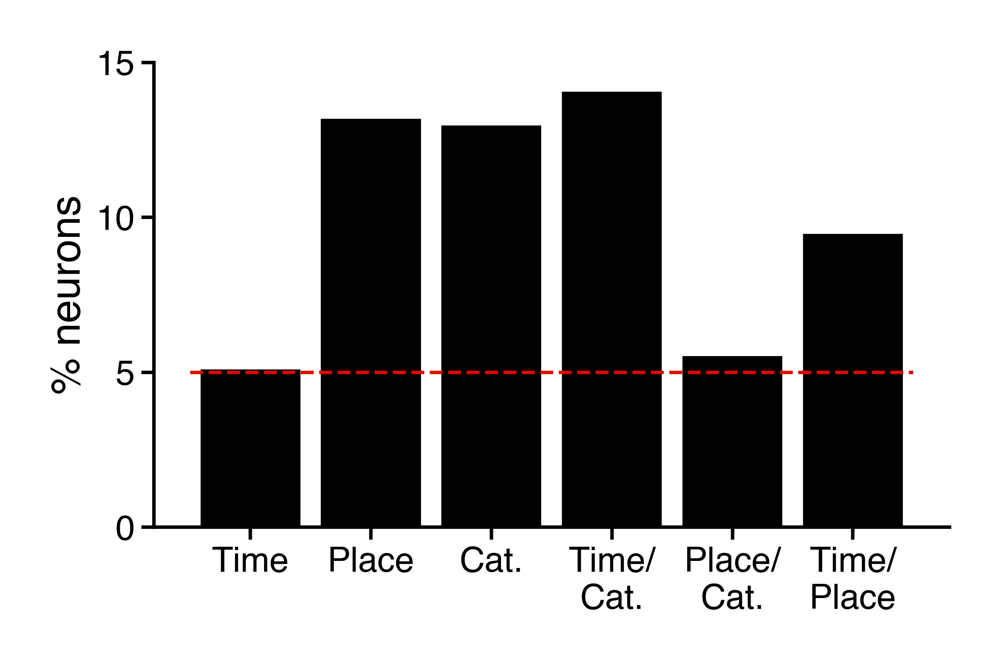

In [6]:
savefig = 0
overwrite = 0
sig_col = 'sig'
full = 'full'
test_vars = ['time', 'place', 'gameState', 'gameState:time', 'gameState:place', 'time:place']
xcats = ['Time', 'Place', 'Cat.', 'Time/\nCat.', 'Place/\nCat.', 'Time/\nPlace']
ylim = [0, 15]
yticks = [0, 5, 10, 15]
figsize = (colws[1], colws[1] * 0.6)
font = {'tick': 5, 'label': 6, 'annot': 5}
spine_lw = 0.5
spine_len = 1.8
labelpad = 2

# Graph percent of units that code for each variable of interest.
_df = mod_pairs.query("(full=='{}')".format(full)).copy()
_df['testvar'] = _df['testvar'].astype(pd.CategoricalDtype(test_vars, ordered=True))
_df = _df.groupby(['testvar'], observed=True)['sig'].apply(lambda x: 100 * np.mean(x)).reset_index()

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=1200)
ax = sns.barplot(x='testvar', y='sig', color='k', data=_df, ax=ax,
                 saturation=1, linewidth=spine_lw, edgecolor='k')
ax.hlines(5, -0.5, len(test_vars) - 0.5, colors='#e10600', linestyles='dashed', lw=spine_lw)
for axis in ['left', 'bottom']:
    ax.spines[axis].set_linewidth(spine_lw)
ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
ax.set_xticklabels(xcats, fontsize=font['tick'])
ax.set_ylim(ylim)
ax.set_yticks(yticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('', fontsize=font['label'], labelpad=labelpad)
ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad-1)

if savefig:
    n_units = np.unique(mod_pairs['subj_sess_unit']).size
    filename = op.join(proj_dir, 'figs', 'plot_navigation2',
                       'pct_sig-time_place_gameState_+interactions-{}units.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
            
fig.show()

In [10]:
mod_pairs.query("(full=='fullMax')")['testvar'].unique()

['max-gameState', 'max-time', 'max-gameState:time', 'max-place', 'max-gameState:place', 'max-time:place']
Categories (6, object): ['max-gameState' < 'max-time' < 'max-gameState:time' < 'max-place' < 'max-gameState:place' < 'max-time:place']

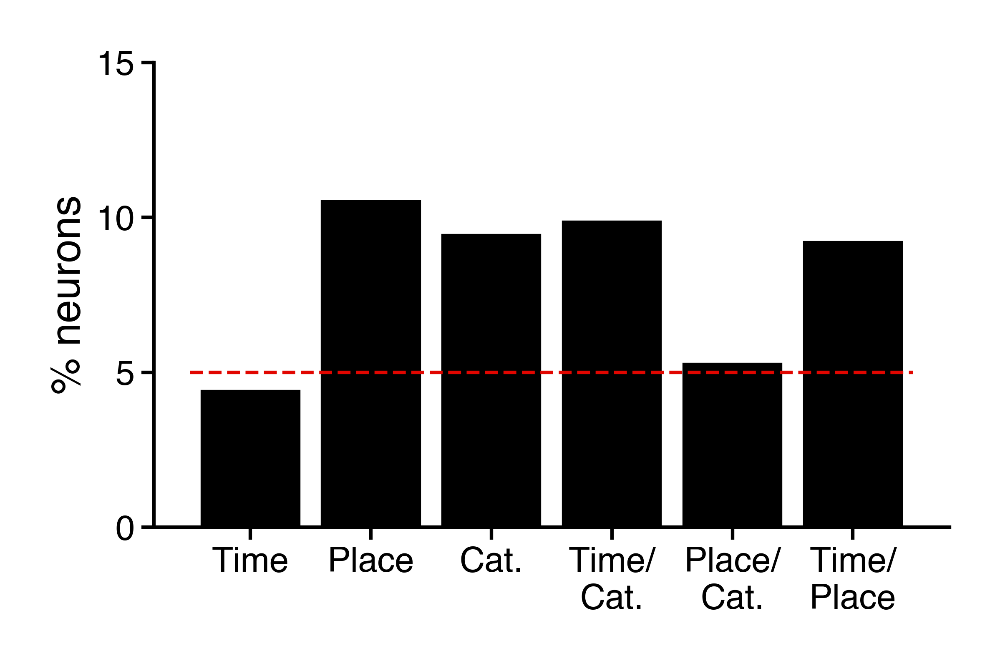

In [12]:
savefig = 1
overwrite = 0
sig_col = 'sig'
full = 'fullMax'
test_vars = ['max-time', 'max-place', 'max-gameState', 'max-gameState:time', 'max-gameState:place', 'max-time:place']
xcats = ['Time', 'Place', 'Cat.', 'Time/\nCat.', 'Place/\nCat.', 'Time/\nPlace']
ylim = [0, 15]
yticks = [0, 5, 10, 15]
figsize = (colws[1], colws[1] * 0.6)
font = {'tick': 5, 'label': 6, 'annot': 5}
spine_lw = 0.5
spine_len = 1.8
labelpad = 2

# Graph percent of units that code for each variable of interest.
_df = mod_pairs.query("(full=='{}')".format(full)).copy()
_df['testvar'] = _df['testvar'].astype(pd.CategoricalDtype(test_vars, ordered=True))
_df = _df.groupby(['testvar'], observed=True)['sig'].apply(lambda x: 100 * np.mean(x)).reset_index()

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=1200)
ax = sns.barplot(x='testvar', y='sig', color='k', data=_df, ax=ax,
                 saturation=1, linewidth=spine_lw, edgecolor='k')
ax.hlines(5, -0.5, len(test_vars) - 0.5, colors='#e10600', linestyles='dashed', lw=spine_lw)
for axis in ['left', 'bottom']:
    ax.spines[axis].set_linewidth(spine_lw)
ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
ax.set_xticklabels(xcats, fontsize=font['tick'])
ax.set_ylim(ylim)
ax.set_yticks(yticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('', fontsize=font['label'], labelpad=labelpad)
ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad-1)

if savefig:
    n_units = np.unique(mod_pairs['subj_sess_unit']).size
    filename = op.join(proj_dir, 'figs', 'plot_navigation2',
                       'pct_sig-time_place_gameState_+interactions-{}units-fullMax.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
            
fig.show()

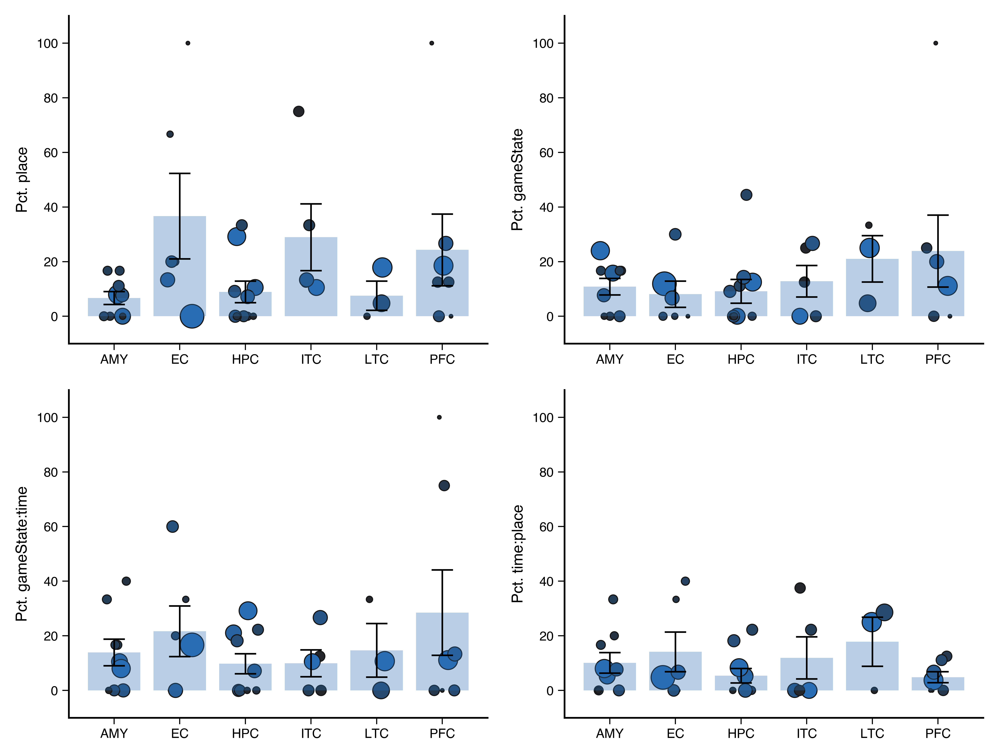

In [12]:
savefig = 0
overwrite = 1
figsize = (colws['1'], colws['1'] * 0.76)
dpi = 1200
font = {'tick': 6, 'label': 7, 'annot': 6, 'fig': 8}
spine_lw = 0.5
ebar_lw = 0.75
ticklength = 3
tickpad = 2
labelpad = 3
figurepad = 5
alpha = 0.33
_color = '#296eb4'
ymin = -10
ymax = 110
yticks = [0, 20, 40, 60, 80, 100]
scaling_factor = 3

# Graph percent of units that code for each variable of interest.
sig_col = 'sig'
full = 'full'
roi_map = od([('A'            , 'AMY'),
              ('EC'           , 'EC'),
              ('Hippocampus'  , 'HPC'),
              ('Inf. temporal', 'ITC'),
              ('Lat. temporal', 'LTC'),
              ('Prefrontal'   , 'PFC')])
rois = list(roi_map.values())
test_vars = ['place', 'gameState', 'gameState:time', 'time:place']

df = mod_pairs.query("(full=='{}') & (testvar=={})".format(full, test_vars)).copy()
df['testvar'] = df['testvar'].astype(pd.CategoricalDtype(test_vars, ordered=True))
df['roi_gen'] = df['roi_gen'].apply(lambda x: roi_map[x])
df['roi_gen'] = df['roi_gen'].astype(pd.CategoricalDtype(rois, ordered=True))
df = (df.groupby(['testvar', 'roi_gen', 'subj'])[sig_col]
        .agg([np.count_nonzero, len, np.mean])
        .fillna(0)
        .reset_index()
        .rename(columns={'count_nonzero': 'nsig',
                         'len': 'n',
                         'mean': 'pctsig'}))
df['pctsig'] = df['pctsig'] * 100

# Make the plots.
plt.close()
fig, ax = plt.subplots(2, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

for iax, testvar in enumerate(test_vars):
    _df = df.query("(testvar=='{}') & (n>0)".format(testvar))
    _ax = ax[iax]
    for _roi in rois:
        sizes = _df.query("(roi_gen=='{}')".format(_roi))['n'].values
        sizes = scaling_factor * np.sqrt(sizes/np.pi) # area to radius
        _ax = sns.stripplot(x='roi_gen', y='pctsig', hue='n',
                            data=_df.query("(roi_gen=='{}')".format(_roi)), ax=_ax,
                            s=sizes, linewidth=spine_lw, alpha=1, color=_color,
                            jitter=0.2, zorder=1)
    _ax = sns.barplot(x='roi_gen', y='pctsig', data=_df, ax=_ax,
                      ci=None, color=_color, saturation=1, alpha=0.33, zorder=2)
    _ax.errorbar(np.arange(len(rois)),
                 _df.groupby('roi_gen')['pctsig'].mean().values, 
                 yerr=_df.groupby('roi_gen')['pctsig'].apply(lambda x: stats.sem(x)).values,
                 ecolor='k', elinewidth=ebar_lw, capsize=5, capthick=ebar_lw, linewidth=0, zorder=3)
    _ax.tick_params(axis='both', width=spine_lw, length=ticklength, pad=tickpad, color='k', labelsize=font['tick'])
    _ax.set_ylim(ymin, ymax)
    _ax.set_yticks(yticks)
    _ax.set_xlabel('')
    _ax.set_ylabel('Pct. {}'.format(testvar), fontsize=font['label'], labelpad=labelpad)
    if _ax.get_legend():
        _ax.get_legend().remove()
    
fig.tight_layout()

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation2', 
                       'pct_sig-time_place_gameState_+interactions-by_region-{}units.pdf'
                       .format(mod_pairs['subj_sess_unit'].unique().size))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        
fig.show()

# Working

In [36]:
def _spikes_per_bin(start,
                    spike_times,
                    dur=1e4,
                    step=1e2):
    """Return the number of spikes in each time bin."""
    bins = np.arange(start, start+dur+1, step=step).astype(int)
    spike_counts = [np.count_nonzero((spikes['spike_times'] >= bins[_i]) *
                                     (spikes['spike_times'] < bins[_i+1]))
                    for _i in range(len(bins)-1)]
    return spike_counts

In [37]:
def _rel_spike_times(start,
                     spike_times,
                     dur=1e4):
    """Return the number of spikes in each time bin."""
    spike_idx = np.where((spikes['spike_times'] >= start) * (spikes['spike_times'] < start+dur))[0]
    _spike_times = (spike_times[spike_idx] - start)
    return _spike_times

In [38]:
nav_neurons = ['U532_ses0-5-8', 'U526_ses0-14-2', 'U527_ses0-58-2', 'U527_ses0-44-4']

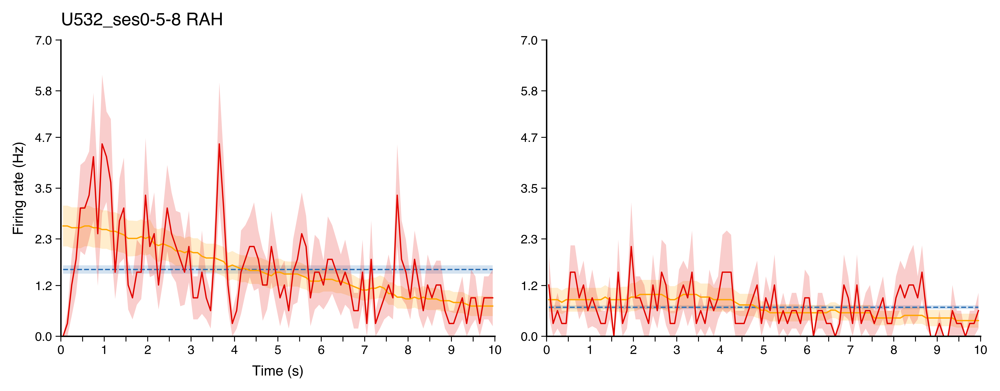

In [39]:
subj_sess_unit = nav_neurons[0]
smooth = 1500 # ms
step = 100 # ms
dur = 10000 # ms
figsize = (8, 3.2)
dpi = 1200
font = {'tick': 7, 'label': 8, 'annot': 10, 'fig': 10}
game_states = ['Encoding', 'Retrieval']
color = '#e10600'
grand_mean_color = '#296eb4'
linewidth = 0.75
alpha = 0.2
tick_len = 3
tickpad = 2
labelpad = 5
ax_linewidth = 0.5

plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

subj_sess, *neuron = subj_sess_unit.split('-')
neuron = '-'.join(neuron)
spikes = spike_preproc.load_spikes(subj_sess, neuron)
events = events_proc.load_events(subj_sess, verbose=0)
spike_mat = {game_state: np.array(events.event_times.query("(gameState=='{}')".format(game_state))['time']
                                                    .apply(lambda x: _spikes_per_bin(x[0], spikes['spike_times']))
                                                    .tolist())
             for game_state in game_states}
n_bins = spike_mat[game_states[0]].shape[1]
fr_mult = int(n_bins/10)
    
# Smooth spike counts over time, separately for each trial and game_state.
if smooth > 0:
    smooth_bins = smooth / step
    spike_mat_smooth = {game_state: gaussian_filter1d(spike_mat[game_state] * fr_mult, smooth_bins, axis=-1)
                        for game_state in game_states}
else:
    spike_mat_smooth = spike_mat.copy()
for game_state in game_states:
    spike_mat_smooth[game_state] = spike_mat_smooth[game_state] * (np.sum(spike_mat[game_state] * fr_mult) / np.sum(spike_mat_smooth[game_state]))

ymin = np.max((0, np.floor(np.min([np.min(np.mean(spike_mat[game_state], axis=0) -
                                         stats.sem(spike_mat[game_state], axis=0)) * fr_mult
                                  for game_state in game_states])))).astype(int)
ymax = np.ceil(np.max([np.max(np.mean(spike_mat[game_state], axis=0) +
                              stats.sem(spike_mat[game_state], axis=0)) * fr_mult
                       for game_state in game_states])).astype(int)
yticks = np.round(np.linspace(ymin, ymax, 7), 1)
yticklabs = yticks
for iGs, game_state in enumerate(game_states):
    iax = iGs
    _ax = ax[iax]
    
    xvals = np.arange(n_bins) + 0.5
    xticks = np.linspace(0, xvals.size, 11)
    xticks_minor = aop.rolling_func(xticks, np.mean, 2).astype(int)
    xticklabs = np.linspace(0, 10, 11).astype(int)
    _means = np.mean(spike_mat[game_state], 0) * fr_mult
    _sems = stats.sem(spike_mat[game_state], 0) * fr_mult
    _means_smooth = np.mean(spike_mat_smooth[game_state], 0)
    _sems_smooth = stats.sem(spike_mat_smooth[game_state], 0)
    _grandmean = np.mean(spike_mat[game_state]) * fr_mult
    _grandsem = stats.sem(np.mean(spike_mat[game_state], axis=0)) * fr_mult
    _ax.fill_between(xvals, ([_grandmean] * xvals.size) + _grandsem, ([_grandmean] * xvals.size) - _grandsem,
                     color=grand_mean_color, lw=0, alpha=alpha)
    _ax.fill_between(xvals, _means_smooth+_sems_smooth, _means_smooth-_sems_smooth,
                     color='orange', lw=0, alpha=alpha)
    _ax.fill_between(xvals, _means+_sems, _means-_sems,
                     color=color, lw=0, alpha=alpha)
    _ax.plot(xvals, [_grandmean] * xvals.size,
             color=grand_mean_color, linewidth=linewidth, linestyle='--')
    _ax.plot(xvals, _means_smooth, color='orange', lw=linewidth)
    _ax.plot(xvals, _means, color=color, lw=linewidth)
    _ax.set_xlim([xticks[0], xticks[-1]])
    _ax.tick_params(which='both', labelsize=font['tick'], length=tick_len, width=ax_linewidth, pad=tickpad)
    _ax.set_xticks(xticks)
    _ax.set_xticks(xticks_minor, minor=True)
    _ax.set_xticklabels(xticklabs)
    _ax.set_ylim([ymin, ymax])
    _ax.set_yticks(yticks)
    _ax.set_yticklabels(yticklabs)
    if iax == 0:
        _ax.set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
        _ax.set_ylabel('Firing rate (Hz)', fontsize=font['label'], labelpad=labelpad)
        _ax.annotate('{} {}'.format(subj_sess_unit, spikes['hemroi']), (0, 1.05),
                     xycoords='axes fraction', fontsize=font['annot'])

fig.tight_layout()
fig.show()

# All time cell firing

In [32]:
def get_spike_mat_smoothed(subj_sess_unit,
                           game_state,
                           smooth=0,
                           mult=2):
    # Load the data.
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])
    event_spikes = time_bin_analysis.load_event_spikes(subj_sess,
                                                       proj_dir=proj_dir,
                                                       verbose=False)
    spike_mat = event_spikes.get_spike_mat(neuron, game_state) * float(mult)
    
    # Smooth spike counts over time, separately for each trial and game_state.
    if smooth:
        spike_mat_smooth = np.array([gaussian_filter1d(spike_mat.values[iTrial, :], smooth)
                                     for iTrial in range(spike_mat.shape[0])])
        spike_mat_smooth = pd.DataFrame(spike_mat_smooth, index=spike_mat.index, columns=spike_mat.columns)
        
    return spike_mat # trial x time_bin

In [932]:
game_states = ['Encoding', 'Retrieval']
smooth = 3
testvar = 'gameState:time'

start_time = time()

#qry = "(testvar=='{}') & (subj_sess_unit=={}) & (field_size_{}>0)"
qry = "(testvar=='{}') & (subj_sess_unit=={})"
neurons = od({game_state: (mod_pairs.query(qry.format(testvar, sig_cells[testvar], game_state))
                                    .sort_values(['field_peak_{}'.format(game_state),
                                                  'field_size_{}'.format(game_state),
                                                  'peak_z_{}'.format(game_state)],
                                                 ascending=[True, True, False])
                           ['subj_sess_unit'].tolist())
              for game_state in game_states})

spike_mats = od([])
mean_frs = od({game_state_out: od({game_state_in: []
                                   for game_state_in in game_states})
               for game_state_out in game_states})
for game_state_out in game_states:
    for neuron in neurons[game_state_out]:
        for game_state_in in game_states:
            if neuron not in spike_mats:
                spike_mats[neuron] = od({game_state: get_spike_mat_smoothed(neuron, game_state, smooth=smooth)
                                         for game_state in game_states})
            mean_frs[game_state_out][game_state_in].append(np.mean(spike_mats[neuron][game_state_in].values, axis=0))
        
for game_state_out in game_states:
    for game_state_in in game_states:
        mean_frs[game_state_out][game_state_in] = np.array(mean_frs[game_state_out][game_state_in])
        
print(testvar, len(sig_cells[testvar]))
for game_state in game_states:
    print(game_state, len(neurons[game_state]))
    
print('Done in {:.1f}s'.format(time() - start_time))

gameState:time 64
Encoding 49
Retrieval 56
Done in 112.0s


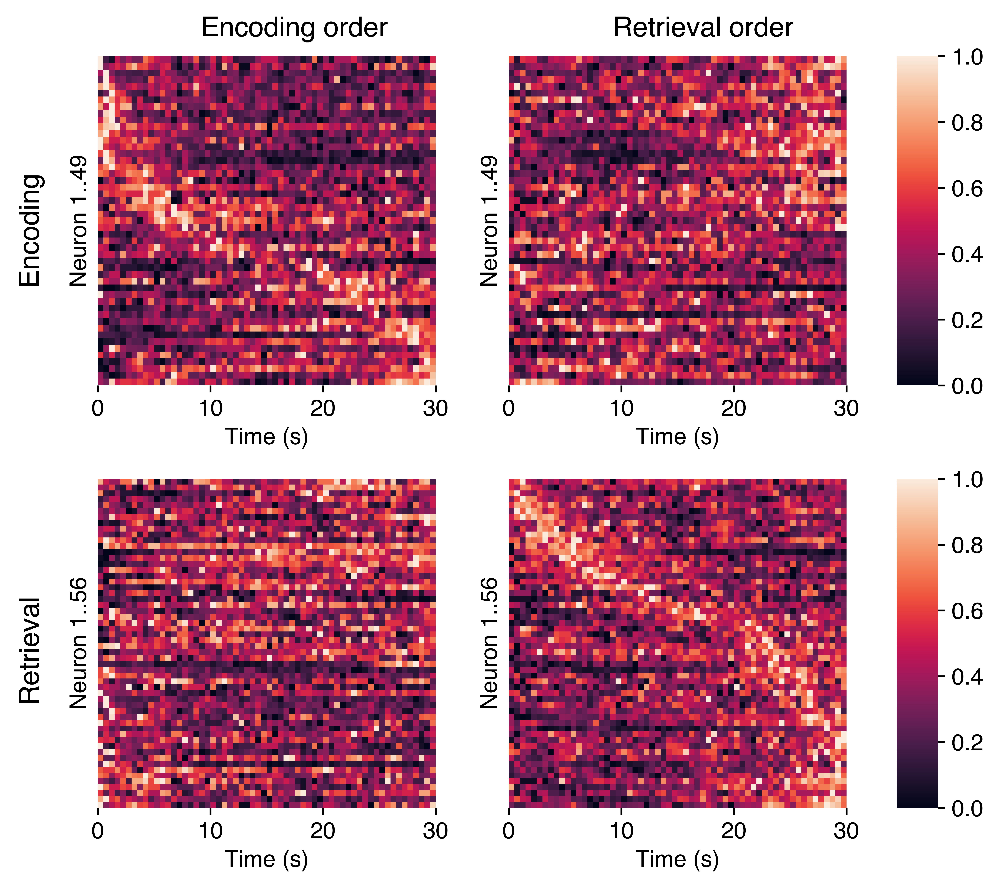

In [931]:
savefig = 0
overwrite = 0
grid_shp = (34, 37)
figsize = (colws['1'], colws['1']*(grid_shp[0]/grid_shp[1]))
dpi = 1200
font = {'tick': 10, 'label': 10, 'annot': 10, 'fig': 12}

plt.close()
fig = plt.figure(figsize=figsize, dpi=dpi)
ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=15, colspan=15),
      plt.subplot2grid(grid_shp, (0, 18), rowspan=15, colspan=15),
      plt.subplot2grid(grid_shp, (0, 35), rowspan=15, colspan=2),
      plt.subplot2grid(grid_shp, (19, 0), rowspan=15, colspan=15),
      plt.subplot2grid(grid_shp, (19, 18), rowspan=15, colspan=15),
      plt.subplot2grid(grid_shp, (19, 35), rowspan=15, colspan=2)]
ax = np.ravel(ax)

ax_labels = {'Encoding': 'Encoding',
             'Retrieval': 'Retrieval'}
ax_titles = {'Encoding': 'Encoding',
             'Retrieval': 'Retrieval'}
    
# The trial phases we want to examine significant time cells for.
game_states = ['Encoding', 'Retrieval']
xsort = {}
n_neurons = []
iax = 0
for game_state_out in game_states:
    for game_state_in in game_states:
        if iax % 3 == 2:
            iax += 1
            
        fr_mat = minmax_scale(mean_frs[game_state_out][game_state_in], axis=1)
        n_neurons.append(fr_mat.shape[0])
        xticks = [0, 20, 40, 60]
        xticklabels = [0, 10, 20, 30]
        vmin = 0
        vmax = 1
        add_cbar = False
        if iax % 3 == 1:
            add_cbar = True

        # Plot the firing rate heatmaps.
        ax[iax] = sns.heatmap(fr_mat, ax=ax[iax], vmin=vmin, vmax=vmax, cmap='rocket',
                              square=False, cbar=add_cbar, cbar_ax=ax[iax+1])
        ax[iax].tick_params(axis='x', which='both', length=3, pad=3)
        ax[iax].tick_params(axis='y', which='both', length=0, pad=3)
        ax[iax].set_xticks(xticks)
        ax[iax].set_xticklabels(xticklabels, fontsize=font['tick'], rotation=0)
        ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=3)
        ax[iax].set_yticks([])
        ax[iax].set_ylabel('Neuron 1..{}'.format(n_neurons[-1]), fontsize=font['label'], labelpad=3)
    
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], length=3, pad=3)
            cbar.set_ticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
            cbar.set_ticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
            #cbar.set_label('Norm. firing rate', fontsize=font['label'], labelpad=2)
        
        iax += 1
    
    fig.text(0.22, 0.9, 'Encoding order', fontsize=font['fig'])
    fig.text(0.6, 0.9, 'Retrieval order', fontsize=font['fig'])
    fig.text(0.05, 0.745, 'Encoding', rotation=90, fontsize=font['fig'])
    fig.text(0.05, 0.32, 'Retrieval', rotation=90, fontsize=font['fig'])
    
if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation2',
                       'Encoding{}_Retrieval{}_time_cells-smooth{}-{}units.pdf'
                       .format(len(neurons['Encoding']), len(neurons['Retrieval']), smooth, len(mod_pairs['subj_sess_unit'].unique())))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        
fig.show()

In [1214]:
game_states = ['Encoding', 'Retrieval']
testvar = 'gameState:time'
smooth = 3

start_time = time()

neurons = (mod_pairs.query("(gameState=='Encoding-Retrieval') & (testvar=='{}') & (subj_sess_unit=={})".format(testvar, sig_cells[testvar]))
                    .sort_values(['field_peak_Encoding', 'field_size_Encoding', 'peak_z_Encoding'],
                                 ascending=[True, True, False]))['subj_sess_unit'].tolist()

spike_mats = od([])
mean_frs = od({game_state: [] for game_state in game_states})
mean_frs_1 = od({game_state: [] for game_state in game_states})
mean_frs_2 = od({game_state: [] for game_state in game_states})
for neuron in neurons:
    spike_mats[neuron] = od({game_state: get_spike_mat_smoothed(neuron, game_state, smooth=smooth)
                             for game_state in game_states})
    for game_state in game_states:
        mean_frs[game_state].append(np.mean(spike_mats[neuron][game_state].values, axis=0))
#         mean_frs_1[game_state].append(np.mean(spike_mats[neuron][game_state].loc[spike_mats[neuron][game_state].index<=18].values, axis=0))
#         mean_frs_2[game_state].append(np.mean(spike_mats[neuron][game_state].loc[spike_mats[neuron][game_state].index>18].values, axis=0))
        mean_frs_1[game_state].append(np.mean(spike_mats[neuron][game_state].loc[spike_mats[neuron][game_state].index%2==0].values, axis=0))
        mean_frs_2[game_state].append(np.mean(spike_mats[neuron][game_state].loc[spike_mats[neuron][game_state].index%2!=0].values, axis=0))
        
for game_state in game_states:
    mean_frs[game_state] = np.array(mean_frs[game_state])
    mean_frs_1[game_state] = np.array(mean_frs_1[game_state])
    mean_frs_2[game_state] = np.array(mean_frs_2[game_state])
    
print('Done in {:.1f}s'.format(time() - start_time))

Done in 35.1s


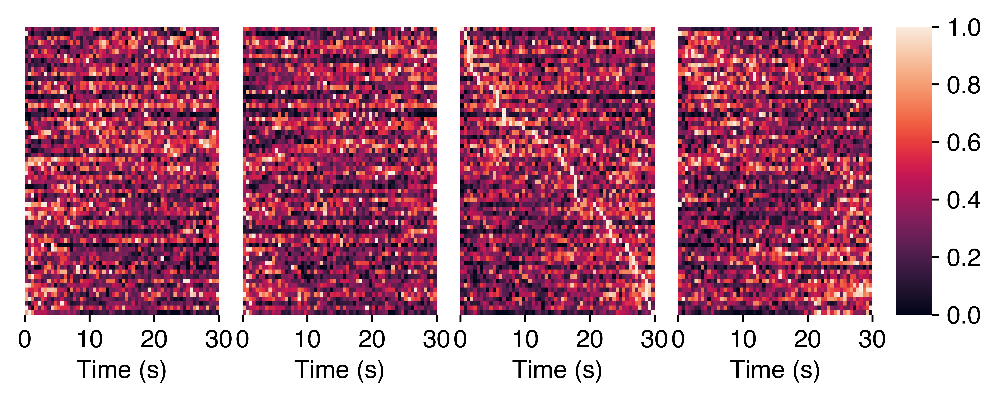

In [1231]:
savefig = 0
overwrite = 1
grid_shp = (15, 46)
figsize = (colws['1'], colws['1']*(grid_shp[0]/grid_shp[1]))
dpi = 1200
font = {'tick': 10, 'label': 10, 'annot': 10, 'fig': 12}
game_states = ['Encoding', 'Retrieval']
resort = True
sort_by = 'Retrieval'
bin1s = False

# -------------------------
plt.close()
fig = plt.figure(figsize=figsize, dpi=dpi)
ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=15, colspan=10),
      plt.subplot2grid(grid_shp, (0, 11), rowspan=15, colspan=10),
      plt.subplot2grid(grid_shp, (0, 22), rowspan=15, colspan=10),
      plt.subplot2grid(grid_shp, (0, 33), rowspan=15, colspan=10),
      plt.subplot2grid(grid_shp, (0, 44), rowspan=15, colspan=2)]
ax = np.ravel(ax)

ax_labels = {'Encoding': 'Encoding',
             'Retrieval': 'Retrieval'}
ax_titles = {'Encoding': 'Encoding',
             'Retrieval': 'Retrieval'}

fr_mat_1 = {game_state: mean_frs_1[game_state]
            for game_state in game_states}
fr_mat_2 = {game_state: mean_frs_2[game_state]
            for game_state in game_states}

# Average in 1s bins.
if bin1s:
    fr_mat_1 = {game_state: np.array([np.mean(arr, -1) for arr in np.split(fr_mat_1[game_state], int(fr_mat_1[game_state].shape[1]/2), axis=1)]).T
                for game_state in game_states}
    fr_mat_2 = {game_state: np.array([np.mean(arr, -1) for arr in np.split(fr_mat_2[game_state], int(fr_mat_2[game_state].shape[1]/2), axis=1)]).T
                for game_state in game_states}
                                     
# Apply min_max scaling for even and odd values for each unit, respectively.
fr_mat_1 = {game_state: minmax_scale(fr_mat_1[game_state], axis=1)
            for game_state in game_states}
fr_mat_2 = {game_state: minmax_scale(fr_mat_2[game_state], axis=1)
            for game_state in game_states}

# Sort neurons by their peak firing time.
if resort:
    xsort = np.argsort(np.argmax(fr_mat_1[sort_by], axis=1))
    fr_mat_1 = {game_state: fr_mat_1[game_state][xsort, :]
                for game_state in game_states}
    fr_mat_2 = {game_state: fr_mat_2[game_state][xsort, :]
                for game_state in game_states}
        
# The trial phases we want to examine significant time cells for.
game_states = ['Encoding', 'Retrieval']
xsort = {}
n_neurons = []
iax = 0
for game_state in game_states:
    for fr_mat in (fr_mat_1, fr_mat_2):
        n_neurons.append(fr_mat[game_state].shape[0])
        if bin1s:
            xticks = [0, 10, 20, 30]
        else:
            xticks = [0, 20, 40, 60]
        xticklabels = [0, 10, 20, 30]
        vmin = 0
        vmax = 1
        add_cbar = False
        if iax == len(ax) - 2:
            add_cbar = True

        # Plot the firing rate heatmaps.
        ax[iax] = sns.heatmap(fr_mat[game_state], ax=ax[iax], vmin=vmin, vmax=vmax, cmap='rocket',
                              square=False, cbar=add_cbar, cbar_ax=ax[iax+1])
        ax[iax].tick_params(axis='x', which='both', length=3, pad=3)
        ax[iax].tick_params(axis='y', which='both', length=0, pad=3)
        ax[iax].set_xticks(xticks)
        ax[iax].set_xticklabels(xticklabels, fontsize=font['tick'], rotation=0)
        ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=3)
        ax[iax].set_yticks([])
        ax[iax].set_ylabel('')
#         ax[iax].set_ylabel('Neuron 1..{}'.format(n_neurons[-1]), fontsize=font['label'], labelpad=3)
#         ax[iax].set_title(game_state, fontsize=font['label'])
    
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], length=3, pad=3)
            cbar.set_ticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
            cbar.set_ticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
            #cbar.set_label('Norm. firing rate', fontsize=font['label'], labelpad=2)
            iax += 1
        
        iax += 1
    
if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation2',
                       'EncodingRetrieval-trial_split-sortby_{}-smooth{}-{}ms_bins-{}time_cells-{}units.pdf'
                       .format(sort_by, smooth, 1000 if bin1s else 500, len(neurons), len(mod_pairs['subj_sess_unit'].unique())))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

In [6]:
# Load firing rate data.
testvar = 'gameState:time'
game_states = ['Encoding', 'Retrieval']
smooth = 3

# Load Z-score firing rates for each neuron.
filename = op.join(proj_dir, 'analysis', 'time_fields', '{}-Encoding_Retrieval-smooth{}-1000perm-zthresh1.96-max_skips1-time_fields.pkl')
z_frs = {game_state: np.array([dio.open_pickle(filename.format(neuron, smooth))['z_frs'][game_state]
                               for neuron in sig_cells[testvar]])
         for game_state in game_states} # neuron x time

# Get the order to plot neuron firing rates in.
neurons = od([])
for game_state in game_states:
    fr_peak = np.argmax(z_frs[game_state], axis=1)
    fr_max = np.max(z_frs[game_state], axis=1)
    df = pd.DataFrame(np.vstack((sig_cells[testvar], fr_peak, fr_max)).T,
                      columns=['subj_sess_unit', 'fr_peak', 'fr_max'])
    df['subj_sess_unit'] = df['subj_sess_unit'].astype(str)
    df['fr_peak'] = df['fr_peak'].astype(int)
    df['fr_max'] = df['fr_max'].astype(float)
    df = df.sort_values(['fr_peak', 'fr_max'], ascending=[True, False]).reset_index(drop=True)
    neurons[game_state] = df['subj_sess_unit'].tolist()

# Reload z_frs in the correct order.
z_frs = od([])
for game_state in game_states:
    z_frs[game_state] = np.array([dio.open_pickle(filename.format(neuron, smooth))['z_frs'][game_state]
                                  for neuron in neurons[game_state]]) # neuron x time

In [7]:
len(sig_cells[testvar])

64

In [8]:
np.percentile(np.array(list(z_frs.values())), [0, 1, 5, 10, 50, 90, 95, 99, 100])

array([-5.24302907, -3.61781217, -2.50692734, -2.07852498, -0.18221513,
        2.18340795,  3.02330926,  5.16151299,  8.37356831])

In [31]:
import sklearn
sklearn.__version__

'0.23.2'

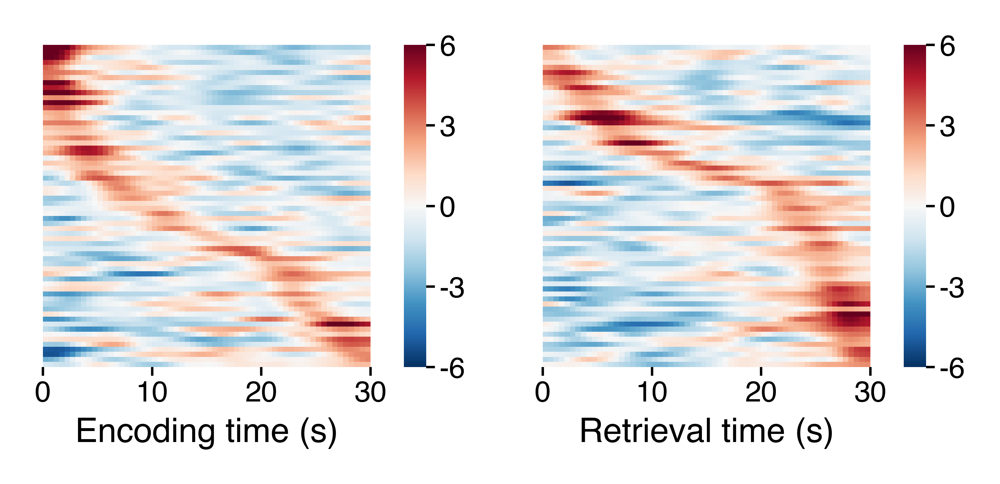

In [10]:
savefig = 0
overwrite = 1
vmin = -6
vmax = 6
cbar_ticks = [-6, -3, 0, 3, 6]
xticks = [0, 20, 40, 60]
xticklabels = [0, 10, 20, 30]
grid_shp = (12, 32)
figsize = (colws['1'] * 0.5, colws['1']*(grid_shp[0]/grid_shp[1]) * 0.5)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
_cmap = 'RdBu_r'
spine_len = 1.8
spine_lw = 0.5
spine_pad = 1
labelpad = 2

# -------------------------------
plt.close()
fig = plt.figure(figsize=figsize, dpi=dpi)
ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=12, colspan=12),
      plt.subplot2grid(grid_shp, (0, 13), rowspan=12, colspan=1),
      plt.subplot2grid(grid_shp, (0, 18), rowspan=12, colspan=12),
      plt.subplot2grid(grid_shp, (0, 31), rowspan=12, colspan=1)]
ax = np.ravel(ax)

iax = 0
for game_state in game_states:
    ax[iax] = sns.heatmap(z_frs[game_state], vmin=vmin, vmax=vmax, cmap=_cmap, ax=ax[iax], cbar_ax=ax[iax+1],
                          square=False) # , mask=np.abs(z_frs)<1.96)
    ax[iax].tick_params(axis='x', which='both', length=spine_len, pad=spine_pad, width=spine_lw)
    ax[iax].tick_params(axis='y', which='both', length=0)
    ax[iax].set_xticks(xticks)
    ax[iax].set_xticklabels(xticklabels, fontsize=font['tick'], rotation=0)
    ax[iax].set_xlabel('{} time (s)'.format(game_state), fontsize=font['label'], labelpad=labelpad)
    ax[iax].set_yticks([])
    ax[iax].set_ylabel('')
    cbar = ax[iax].collections[0].colorbar
    cbar.ax.tick_params(labelsize=font['tick'], length=spine_len, pad=spine_pad, width=spine_lw)
    cbar.set_ticks(cbar_ticks)
    cbar.set_ticklabels(cbar_ticks)
    iax += 2
            
if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation2',
                       'Encoding_Retrieval-Zscore-firing_rates-smooth{}-500ms_bins-{}time_cells-{}units.pdf'
                       .format(smooth, len(neurons), len(mod_pairs['subj_sess_unit'].unique())))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

# Time fields

48
(-0.28299120239959696, 0.0512973476151347)
(0.05225852839015227, 0.7242720041841858)
56
(-0.05799402209061928, 0.6711597555568133)
(0.0238301110344067, 0.8616054691506709)


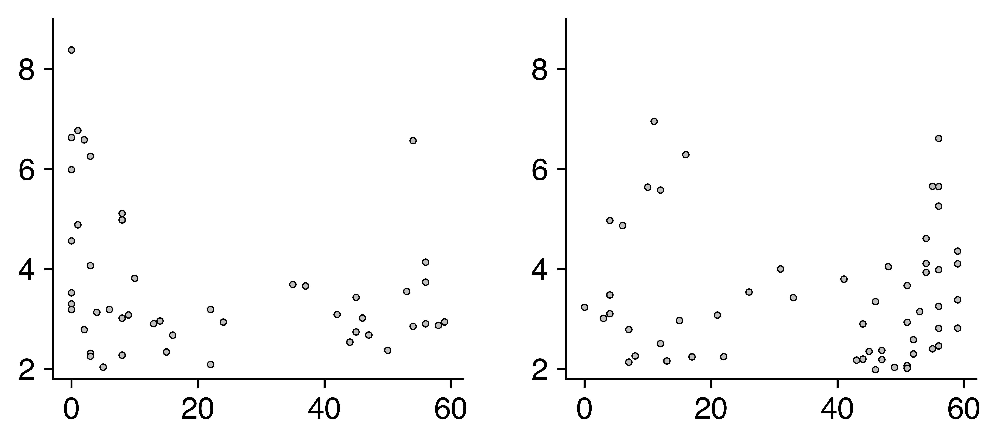

In [30]:
game_states = ['Encoding', 'Retrieval']
val = 'peak_z'
point_size = 6
point_fillcolor = '#bebebe'
point_lw = 0.5
point_edgecolor = 'k'
point_alpha = 1
grid_shp = (12, 14)
figsize = (colws['1'] * 0.5, colws['1'] * 0.2)
ylim = [1.8, 9]

plt.close()
fig, ax = plt.subplots(1, 2, figsize=np.array(figsize)*2, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_df = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_states[0]))
                  .sort_values('peak_z', ascending=False)
                  .drop_duplicates('subj_sess_unit'))
print(len(_df))
print(stats.pearsonr(_df['field_peak'], _df['peak_z']))
print(stats.pearsonr(_df['field_peak'], _df['field_size']))
_ax.scatter(_df['field_peak'].values, _df[val].values, s=point_size,
            c=point_fillcolor, linewidths=point_lw, edgecolors=point_edgecolor, alpha=point_alpha)
_ax.set_ylim(ylim)

iax = 1
_ax = ax[iax]
_df = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_states[1]))
                  .sort_values('peak_z', ascending=False)
                  .drop_duplicates('subj_sess_unit'))
print(len(_df))
print(stats.pearsonr(_df['field_peak'], _df['peak_z']))
print(stats.pearsonr(_df['field_peak'], _df['field_size']))
_ax.scatter(_df['field_peak'].values, _df[val].values, s=point_size,
            c=point_fillcolor, linewidths=point_lw, edgecolors=point_edgecolor, alpha=point_alpha)
_ax.set_ylim(ylim)

fig.show()

Encoding
--------
obs        : [28, 5, 15]
cells/bin  : [1.4, 0.25, 0.75]
exp        : [7.616666666666667, 7.616666666666667, 7.616666666666667]
pvals      : [6.775981097021742e-09, 0.46234101213836687, 0.015025450377671484]
pvals_corr : [2.03279433e-08 4.62341012e-01 3.00509008e-02]
sig        : [ True False  True]

Retrieval
---------
obs        : [17, 5, 34]
cells/bin  : [0.85, 0.25, 1.7]
exp        : [7.616666666666667, 7.616666666666667, 7.616666666666667]
pvals      : [0.0025448902184227198, 0.46234101213836687, 9.425837196869528e-13]
pvals_corr : [5.08978044e-03 4.62341012e-01 2.82775116e-12]
sig        : [ True False  True]



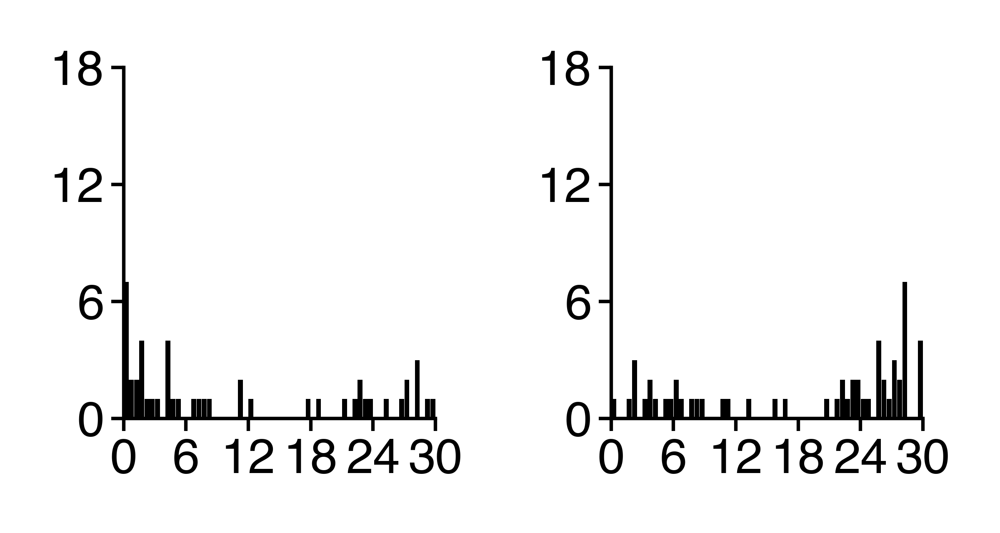

In [29]:
savefig = 0
overwrite = 0
grid_shp = (12, 14)
figsize = (colws['1'] * 0.5, colws['1'] * 0.2)
dpi = 1200
ylim = [0, 18]
yticks = np.arange(0, 19, step=6).astype(int)
yticklabels = yticks
xlim = [0, 60]
xticks = np.arange(0, 61, step=12).astype(int)
xticklabels = (xticks / 2.0).astype(int)
figsize = (colws['2-1/3'], colws['2-1/3']/1.8)
font = {'tick': 7, 'label': 8, 'annot': 7, 'fig': 10}
spine_lw = 0.5
spine_len = 1.8
tickpad = 1
labelpad = 2

plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
game_state = game_states[0]
counts = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_state))
                     .sort_values('peak_z', ascending=False)
                     .drop_duplicates('subj_sess_unit')
                     .groupby(['field_peak'])
                     .size()
                     .reset_index()
                     .rename(columns={'index': 'field_peak', 0: 'count'}))

# Are time cells over-represented in each third of the delay?
bins = [20, 20, 20]
obs = [counts.query("(0<=field_peak<{})".format(bins[0]))['count'].sum(),
       counts.query("({}<=field_peak<{})".format(bins[0], np.sum(bins[:2])))['count'].sum(),
       counts.query("({}<=field_peak<{})".format(np.sum(bins[:2]), np.sum(bins)))['count'].sum()]
bins_total = np.sum(bins)
n = 457
alpha = 0.05
expected = [n * alpha * (bins[_i]/bins_total) for _i in range(len(bins))]

pvals = [stats.binom_test(obs[_i], n, p=alpha*(bins[_i]/bins_total)) for _i in range(len(bins))]
pvals_corr = sm.stats.multipletests(pvals, alpha, method='holm')[1]
print(game_state,
      '-'*len(game_state),
      'obs        : {}'.format(obs),
      'cells/bin  : {}'.format([obs[_i] / bins[_i] for _i in range(len(bins))]),
      'exp        : {}'.format(expected),
      'pvals      : {}'.format(pvals), 
      'pvals_corr : {}'.format(pvals_corr),
      'sig        : {}'.format(pvals_corr < alpha),
      sep='\n', end='\n'*2)

_ax.bar(counts['field_peak']+0.5, counts['count'], color='k', width=0.95)
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=spine_len, width=spine_lw)
_ax.set_xlim(xlim)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabels)
_ax.set_xlabel('') # 'Time (s)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabels)
_ax.set_ylabel('') # Pct. neurons', fontsize=font['label'], labelpad=labelpad)

# -------------------------------

iax = 1
_ax = ax[iax]
game_state = game_states[1]
counts = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_state))
                     .sort_values('peak_z', ascending=False)
                     .drop_duplicates('subj_sess_unit')
                     .groupby(['field_peak'])
                     .size()
                     .reset_index()
                     .rename(columns={'index': 'field_peak', 0: 'count'}))

# Are time cells over-represented in each third of the delay?
bins = [20, 20, 20]
obs = [counts.query("(0<=field_peak<{})".format(bins[0]))['count'].sum(),
       counts.query("({}<=field_peak<{})".format(bins[0], np.sum(bins[:2])))['count'].sum(),
       counts.query("({}<=field_peak<{})".format(np.sum(bins[:2]), np.sum(bins)))['count'].sum()]
bins_total = np.sum(bins)
n = 457
alpha = 0.05
expected = [n * alpha * (bins[_i]/bins_total) for _i in range(len(bins))]

pvals = [stats.binom_test(obs[_i], n, p=alpha*(bins[_i]/bins_total)) for _i in range(len(bins))]
pvals_corr = sm.stats.multipletests(pvals, alpha, method='holm')[1]
print(game_state,
      '-'*len(game_state),
      'obs        : {}'.format(obs),
      'cells/bin  : {}'.format([obs[_i] / bins[_i] for _i in range(len(bins))]),
      'exp        : {}'.format(expected),
      'pvals      : {}'.format(pvals), 
      'pvals_corr : {}'.format(pvals_corr),
      'sig        : {}'.format(pvals_corr < alpha),
      sep='\n', end='\n'*2)

_ax.bar(counts['field_peak']+0.5, counts['count'], color='k', width=0.95)
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=spine_len, width=spine_lw)
_ax.set_xlim(xlim)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabels)
_ax.set_xlabel('') # 'Time (s)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabels)
_ax.set_ylabel('') # Pct. neurons', fontsize=font['label'], labelpad=labelpad)

fig.tight_layout()
fig.show()

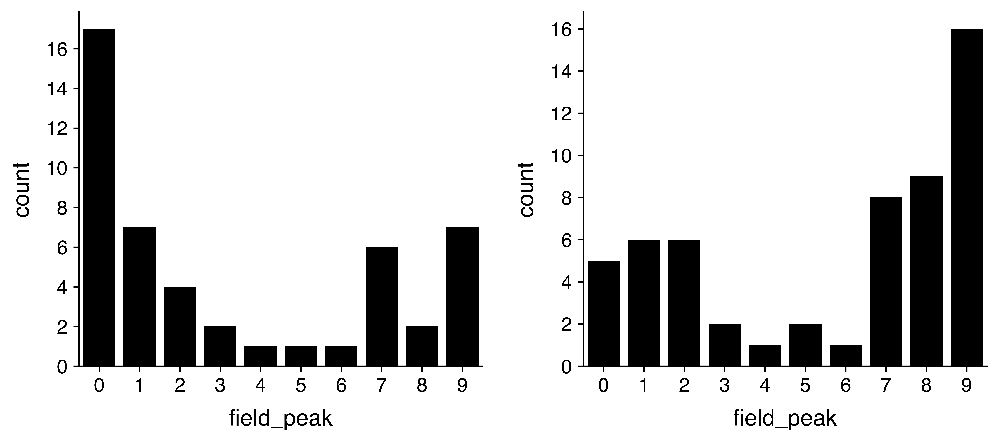

In [18]:
color = 'k'

plt.close()
fig, ax = plt.subplots(1, 2, figsize=(10, 4), dpi=1200)
ax = np.ravel(ax)

iax = 0
game_state = 'Encoding'
counts = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_state))
                     .sort_values('peak_z', ascending=False)
                     .drop_duplicates('subj_sess_unit')
                     .groupby(['field_peak'])
                     .size()
                     .reset_index()
                     .rename(columns={'index': 'field_peak', 0: 'count'}))
counts['field_peak'] = counts['field_peak'].apply(lambda x: int(x/6))
counts = counts.groupby('field_peak')['count'].sum().reset_index()
ax[iax] = sns.barplot(x='field_peak', y='count', data=counts, ax=ax[iax], color=color)

iax = 1
game_state = 'Retrieval'
counts = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_state))
                     .sort_values('peak_z', ascending=False)
                     .drop_duplicates('subj_sess_unit')
                     .groupby(['field_peak'])
                     .size()
                     .reset_index()
                     .rename(columns={'index': 'field_peak', 0: 'count'}))
counts['field_peak'] = counts['field_peak'].apply(lambda x: int(x/6))
counts = counts.groupby('field_peak')['count'].sum().reset_index()
ax[iax] = sns.barplot(x='field_peak', y='count', data=counts, ax=ax[iax], color=color)

fig.show()

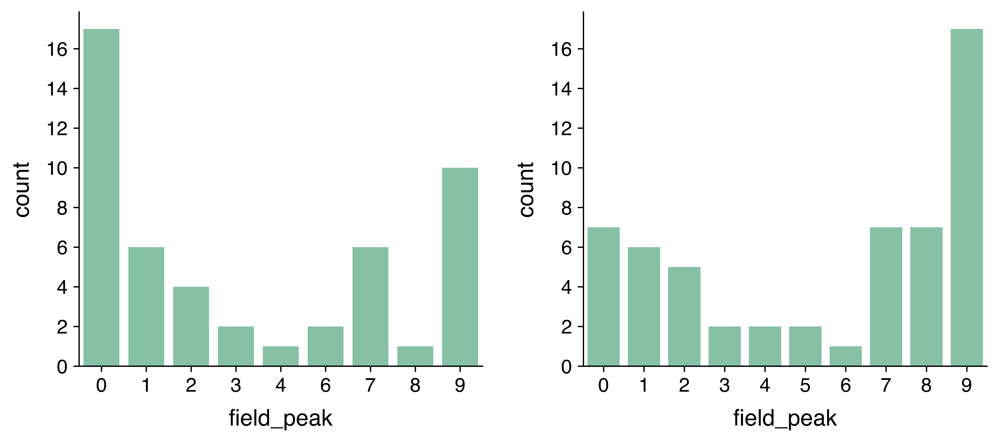

In [847]:
plt.close()
fig, ax = plt.subplots(1, 2, figsize=(10, 4), dpi=1200)
ax = np.ravel(ax)

iax = 0
game_state = 'Encoding'
counts = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_state))
                     .sort_values('peak_z', ascending=False)
                     .drop_duplicates('subj_sess_unit')
                     .groupby(['field_peak'])
                     .size()
                     .reset_index()
                     .rename(columns={'index': 'field_peak', 0: 'count'}))
counts['field_peak'] = counts['field_peak'].apply(lambda x: int(x/6))
counts = counts.groupby('field_peak')['count'].sum().reset_index()
ax[iax] = sns.barplot(x='field_peak', y='count', data=counts, ax=ax[iax], color='#7ccaa5')

iax = 1
game_state = 'Retrieval'
counts = (time_fields.query("(gameState=='{}') & (field_type=='pos')".format(game_state))
                     .sort_values('peak_z', ascending=False)
                     .drop_duplicates('subj_sess_unit')
                     .groupby(['field_peak'])
                     .size()
                     .reset_index()
                     .rename(columns={'index': 'field_peak', 0: 'count'}))
counts['field_peak'] = counts['field_peak'].apply(lambda x: int(x/6))
counts = counts.groupby('field_peak')['count'].sum().reset_index()
ax[iax] = sns.barplot(x='field_peak', y='count', data=counts, ax=ax[iax], color='#7ccaa5')

fig.show()

In [6]:
# How many neurons in each region, for each subject?
roi_gen = 'roi_gen5'
df = ols_pairs.groupby([roi_gen, 'subj']).agg({'subj_sess_unit': lambda x: len(np.unique(x))}).reset_index()
df['subj_sess_unit'] = df['subj_sess_unit'].fillna(0).astype(int)
df = pd.pivot(df, index=roi_gen, columns='subj', values='subj_sess_unit')
print(df.sum(axis=1))
df

roi_gen5
Hippocampus    109
MTL            204
Frontal         69
Temporal        75
dtype: int64


subj,U518,U521,U526,U527,U530,U532,U536,U537,U539,U540
roi_gen5,,,,,,,,,,
Hippocampus,19,5,11,9,11,24,9,3,4,14
MTL,19,19,6,16,61,25,37,9,9,3
Frontal,0,0,8,8,9,1,27,1,0,15
Temporal,28,0,0,0,21,15,0,0,0,11


In [53]:
_df = (ols_pairs.query("(testvar=='time') & (full=='full')")
                .groupby(['subj', 'gameState'])
                .agg({'subj_sess_unit': lambda x: np.unique(x).size, 
                      'sig': [np.sum, np.mean]})
                .reset_index())
_df.columns = ['subj', 'gameState', 'n_cells', 'n_time_cells', 'pct_time_cells']
_df['pct_time_cells'] *= 100

alphas = {'Delay1': 0.05, 'Delay2': 0.05, 'Encoding': 0.05, 'Retrieval': 0.05}
_df['binom_p'] = _df.apply(lambda x: stats.binom_test(x['n_time_cells'], x['n_cells'], alphas[x['gameState']], alternative='greater'), axis=1)
_df['sig'] = _df['binom_p'] < 0.05

_df.groupby(['gameState']).agg({'binom_p': lambda x: '{}/{} {:.1%}'.format(np.sum(x<0.05), len(x), np.mean(x<0.05))})

,binom_p
gameState,
Delay1,4/10 40.0%
Delay2,5/10 50.0%
Encoding,7/10 70.0%
Retrieval,8/10 80.0%


In [ ]:
# Ranking view performance: U521, U537, U530, U526, U518, U536, U532, U527
# Ranking dig performance: U521, U537, U530, U518, U536, U526, U527, U532

In [38]:
def nCr(n, r):
    return math.factorial(n) / (math.factorial(r) * math.factorial(n-r))

In [68]:
itertools.combinations(range(nvars), nsig)

In [71]:
def binom_prob(n, k, pr_k):
    """Return the probability of observing k events.
    
    For 0 <= k <= n.
    
    All observations are assumed independent.
    
    Parameters
    ----------
    k : int
        Number of binary events.
    n : int
        Number of observations.
    pr_k : float
        Probability of k for any one observation.
    """
    n_comb = len(list(itertools.combinations(range(n), k)))
    return n_comb * ((pr_k**k) * ((1-pr_k)**(n-k)))

In [93]:
pr_k = 0.05/6
n = 6
for k in range(n+1):
    print('{} sig: {:.1%}'.format(k, binom_prob(n, k, pr_k)))

0 sig: 95.1%
1 sig: 4.8%
2 sig: 0.1%
3 sig: 0.0%
4 sig: 0.0%
5 sig: 0.0%
6 sig: 0.0%


In [78]:
pr_k = 0.05
n = 6
for k in range(n+1):
    print('{} sig: {:.1%}'.format(k, binom_prob(n, k, pr_k)))

0 sig: 73.5%
1 sig: 23.2%
2 sig: 3.1%
3 sig: 0.2%
4 sig: 0.0%
5 sig: 0.0%
6 sig: 0.0%


In [90]:
pr_k = 0.15
n = 6
for k in range(n+1):
    print('{} sig: {:.1%}'.format(k, binom_prob(n, k, pr_k)))

0 sig: 37.7%
1 sig: 39.9%
2 sig: 17.6%
3 sig: 4.1%
4 sig: 0.5%
5 sig: 0.0%
6 sig: 0.0%


In [55]:
# What percent of neurons are behaviorally tuned?
n_units = ols_pairs.query("(full=='full')")['subj_sess_unit'].unique().size
count_sig = (ols_pairs.query("(full=='full')")
                      .groupby(['gameState', 'subj_sess_unit'])['sig']
                      .apply(np.sum).reset_index()
                      .groupby(['gameState'])['sig']
                      .apply(lambda x: np.unique(x, return_counts=True)))
nav_sig = []
for game_state, vals in count_sig.iteritems():
    for _i in range(len(vals[0])):
        nav_sig.append([game_state, vals[0][_i], vals[1][_i]])
nav_sig = pd.DataFrame(nav_sig, columns=['gameState', 'n_sig', 'n_units'])
nav_sig['pct_units'] = nav_sig['n_units'].apply(lambda x: '{:.1%}'.format(x/n_units))
nav_sig

,gameState,n_sig,n_units,pct_units
0,Delay1,0,384,84.0%
1,Delay1,1,73,16.0%
2,Delay2,0,394,86.2%
3,Delay2,1,63,13.8%
4,Encoding,0,216,47.3%
5,Encoding,1,167,36.5%
6,Encoding,2,53,11.6%
7,Encoding,3,17,3.7%
8,Encoding,4,4,0.9%
9,Retrieval,0,259,56.7%


In [56]:
# Which units are behaviorally-tuned units during encoding and retrieval, respectively?
sig_cells = (ols_pairs.query("(full=='full')")
                      .groupby(['gameState', 'subj_sess_unit'])['sig']
                      .apply(np.sum).reset_index()
                      .query("(sig>0)")
                      .groupby(['gameState'])['subj_sess_unit']
                      .apply(np.unique).to_dict())

# Which units are behaviorally-tuned during both encoding and retrieval?
dbl_sig_cells = np.array([unit for unit in sig_cells['Encoding'] if unit in sig_cells['Retrieval']])

print('Encoding:  {:>3}/{} ({:.1%}) neurons'.format(sig_cells['Encoding'].size, n_units, sig_cells['Encoding'].size / n_units), 
      'Retrieval: {:>3}/{} ({:.1%}) neurons'.format(sig_cells['Retrieval'].size, n_units, sig_cells['Retrieval'].size / n_units), 
      'Both:      {:>3}/{} ({:.1%}) neurons'.format(dbl_sig_cells.size, n_units, dbl_sig_cells.size / n_units), sep='\n', end='\n\n')

# Test whether the number of behaviorally-tuned neurons during both
# encoding and retrieval differs from independent probability.
obs_prob = dbl_sig_cells.size / n_units
ind_prob = (sig_cells['Encoding'].size/n_units) * (sig_cells['Retrieval'].size/n_units)
pval = stats.binom_test(dbl_sig_cells.size, n_units, p=ind_prob)
print('Obs. prob ({:.1%}) != ind. prob ({:.1%}), p = {:.5f}'.format(obs_prob, ind_prob, pval))

Encoding:  241/457 (52.7%) neurons
Retrieval: 198/457 (43.3%) neurons
Both:      120/457 (26.3%) neurons

Obs. prob (26.3%) != ind. prob (22.8%), p = 0.08426


In [7]:
ols_pairs['sig_pos'] = False
ols_pairs.loc[ols_pairs.query("(beta_abs_max>0) & (sig==True)").index.tolist(), 'sig_pos'] = True

In [8]:
# What variables are neurons behaviorally tuned to?
def mean_sum(val):
    return '{}/{} ({:.1%})'.format(np.sum(val), len(val), np.mean(val))

ols_pairs.groupby(['gameState', 'testvar'], observed=True).agg({'sig': mean_sum, 'sig_pos': mean_sum})

sig         sig_pos
gameState testvar                                     
Delay1    time          73/457 (16.0%)  58/457 (12.7%)
Encoding  time          88/457 (19.3%)  52/457 (11.4%)
          place         71/457 (15.5%)  47/457 (10.3%)
          head_direc    49/457 (10.7%)   30/457 (6.6%)
          base_in_view   44/457 (9.6%)   23/457 (5.0%)
          gold_in_view  88/457 (19.3%)  59/457 (12.9%)
Delay2    time          63/457 (13.8%)  46/457 (10.1%)
Retrieval time          80/457 (17.5%)   44/457 (9.6%)
          place         84/457 (18.4%)  54/457 (11.8%)
          head_direc    46/457 (10.1%)   26/457 (5.7%)
          base_in_view  50/457 (10.9%)   12/457 (2.6%)

In [13]:
sig_pct = (ols_pairs.query("(gameState==['Delay1', 'Delay2']) & (testvar=={})".format(test_vars))
                    .groupby(['gameState', 'roi_gen5'], observed=True)
                    .agg({sig_col: [np.sum, 
                                    lambda x: 100 * np.mean(x)]}).reset_index())
sig_pct

gameState     roi_gen5 sig_pos           
                             sum <lambda_0>
0    Delay1  Hippocampus      13  11.926606
1    Delay1          MTL      22  10.784314
2    Delay1      Frontal      10  14.492754
3    Delay1     Temporal      13  17.333333
4    Delay2  Hippocampus       9   8.256881
5    Delay2          MTL      16   7.843137
6    Delay2      Frontal       8  11.594203
7    Delay2     Temporal      13  17.333333

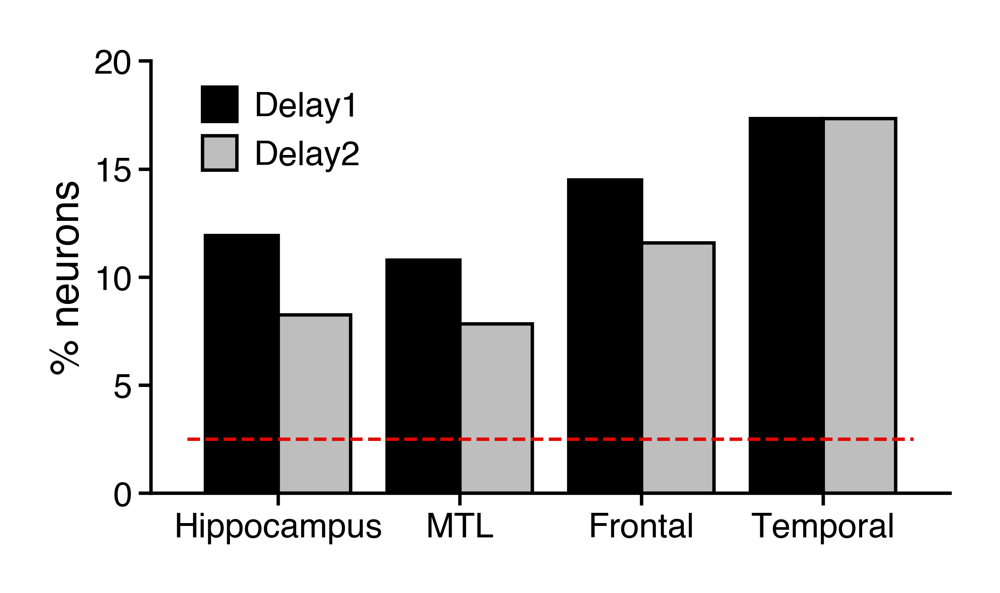

In [43]:
savefig = 0
overwrite = 0
sig_col = 'sig_pos'
xcats = ['Time', 'Place', 'Head\ndirec.', 'View\nbase', 'View\ngold']
ylim = [0, 20]
yticks = [0, 5, 10, 15, 20]
figsize = (colws['2-1/3'], colws['2-1/3']/1.8)
font = {'tick': 5, 'label': 6, 'annot': 5}
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)

# Graph percent of units that code for each variable of interest.
sig_pct = (ols_pairs.query("(gameState==['Delay1', 'Delay2']) & (testvar=='time')")
                    .groupby(['gameState', 'roi_gen5'], observed=True)
                    .agg({sig_col: [np.sum, 
                                    lambda x: 100 * np.mean(x)]}).reset_index())
sig_pct.columns = ['gameState', 'roi', 'sum', 'pct']
sig_pct['gameState'] = sig_pct['gameState'].astype(str)

# Make the plot.
plt.close()
_cmap = ['k', cmap[0]]
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=1200)
ax = sns.barplot(x='roi', y='pct', hue='gameState', data=sig_pct, ax=ax,
                 palette=_cmap, linewidth=spine_lw, edgecolor='k')
ax.hlines(2.5, -0.5, 3.5, colors='#e10600', linestyles='dashed', lw=spine_lw)
for axis in ['left', 'bottom']:
    ax.spines[axis].set_linewidth(spine_lw)
ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#ax.set_xticklabels(xcats, fontsize=font['tick'])
ax.set_ylim(ylim)
ax.set_yticks(yticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('', fontsize=font['label'], labelpad=labelpad)
ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad-1)

# ax2 = ax.twinx()
# ax2.spines['right'].set_visible(True)
# ax2.spines['right'].set_linewidth(spine_lw)
# for axis in ['left', 'bottom', 'top']:
#     ax2.spines[axis].set_visible(False)
# ax2.tick_params(labelsize=font['tick'], pad=1, length=1.5, width=spine_lw)
# slope, icpt, *_ = stats.linregress(sig_pct['pct'], sig_pct['sum'])
# ax2.set_ylim(icpt + (np.array(ylim) * slope))
# ax2.set_yticks(icpt + (np.array(yticks)*slope))
# ax2.set_yticklabels(np.rint(icpt + (np.array(yticks)*slope)).astype(int))
# ax2.set_ylabel('No. units', fontsize=font['label'], labelpad=labelpad)

ax.get_legend().remove()
custom_lines = [Line2D([0], [0], marker='s', color='w', label='Delay1', mfc='k', mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], marker='s', color='w', label='Delay2', mfc=cmap[0], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax.legend(handles=custom_lines, fontsize=font['annot'], bbox_to_anchor=(0.3, 1), handletextpad=0)

if savefig:
    n_units = np.unique(ols_pairs['subj_sess_unit']).size
    filename = op.join(proj_dir, 'figs', 'plot_navigation',
                       'pct_sig-time_place_hd_gold_base-{}units.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
            
fig.show()

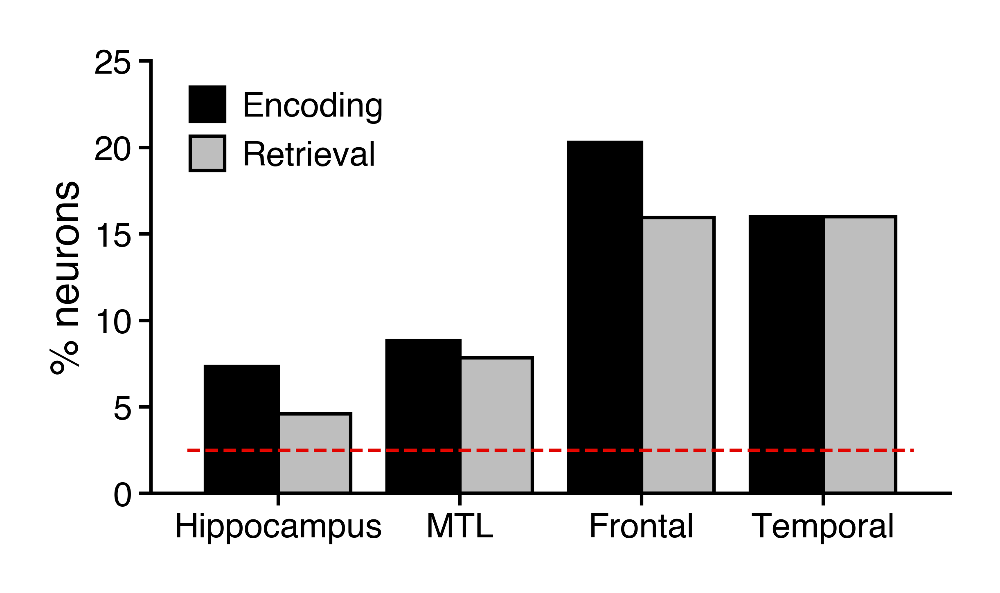

In [46]:
savefig = 0
overwrite = 0
sig_col = 'sig_pos'
xcats = ['Time', 'Place', 'Head\ndirec.', 'View\nbase', 'View\ngold']
ylim = [0, 25]
yticks = [0, 5, 10, 15, 20, 25]
figsize = (colws['2-1/3'], colws['2-1/3']/1.8)
font = {'tick': 5, 'label': 6, 'annot': 5}
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)

# Graph percent of units that code for each variable of interest.
sig_pct = (ols_pairs.query("(gameState==['Encoding', 'Retrieval']) & (testvar=='time')")
                    .groupby(['gameState', 'roi_gen5'], observed=True)
                    .agg({sig_col: [np.sum, 
                                    lambda x: 100 * np.mean(x)]}).reset_index())
sig_pct.columns = ['gameState', 'roi', 'sum', 'pct']
sig_pct['gameState'] = sig_pct['gameState'].astype(str)

# Make the plot.
plt.close()
_cmap = ['k', cmap[0]]
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=1200)
ax = sns.barplot(x='roi', y='pct', hue='gameState', data=sig_pct, ax=ax,
                 palette=_cmap, linewidth=spine_lw, edgecolor='k')
ax.hlines(2.5, -0.5, 3.5, colors='#e10600', linestyles='dashed', lw=spine_lw)
for axis in ['left', 'bottom']:
    ax.spines[axis].set_linewidth(spine_lw)
ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#ax.set_xticklabels(xcats, fontsize=font['tick'])
ax.set_ylim(ylim)
ax.set_yticks(yticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('', fontsize=font['label'], labelpad=labelpad)
ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad-1)

# ax2 = ax.twinx()
# ax2.spines['right'].set_visible(True)
# ax2.spines['right'].set_linewidth(spine_lw)
# for axis in ['left', 'bottom', 'top']:
#     ax2.spines[axis].set_visible(False)
# ax2.tick_params(labelsize=font['tick'], pad=1, length=1.5, width=spine_lw)
# slope, icpt, *_ = stats.linregress(sig_pct['pct'], sig_pct['sum'])
# ax2.set_ylim(icpt + (np.array(ylim) * slope))
# ax2.set_yticks(icpt + (np.array(yticks)*slope))
# ax2.set_yticklabels(np.rint(icpt + (np.array(yticks)*slope)).astype(int))
# ax2.set_ylabel('No. units', fontsize=font['label'], labelpad=labelpad)

ax.get_legend().remove()
custom_lines = [Line2D([0], [0], marker='s', color='w', label='Encoding', mfc='k', mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], marker='s', color='w', label='Retrieval', mfc=cmap[0], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax.legend(handles=custom_lines, fontsize=font['annot'], bbox_to_anchor=(0.33, 1), handletextpad=0)

if savefig:
    n_units = np.unique(ols_pairs['subj_sess_unit']).size
    filename = op.join(proj_dir, 'figs', 'plot_navigation',
                       'pct_sig-time_place_hd_gold_base-{}units.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
            
fig.show()

In [47]:
# What variables are neurons behaviorally tuned to?
sig_col = 'sig_pos'

def _mean_sum(val):
    return r'{} ({:.1f}%)'.format(np.sum(val), np.round(100 * np.mean(val), 1))

df = ols_pairs.copy()
df['roi_gen5'] = df['roi_gen5'].astype(pd.CategoricalDtype(['Hippocampus', 'MTL', 'Temporal', 'Frontal'], ordered=True))
df.groupby(['gameState', 'testvar'], observed=True).agg({sig_col: _mean_sum}).reset_index()

,gameState,testvar,sig_pos
0,Delay1,time,58 (12.7%)
1,Encoding,time,52 (11.4%)
2,Encoding,place,47 (10.3%)
3,Encoding,head_direc,30 (6.6%)
4,Encoding,base_in_view,23 (5.0%)
5,Encoding,gold_in_view,59 (12.9%)
6,Delay2,time,46 (10.1%)
7,Retrieval,time,44 (9.6%)
8,Retrieval,place,54 (11.8%)
9,Retrieval,head_direc,26 (5.7%)


In [9]:
# What variables are neurons behaviorally tuned to?
sig_col = 'sig_pos'

def _mean_sum(val):
    return r'{} ({:.1f}%)'.format(np.sum(val), np.round(100 * np.mean(val), 1))

df = ols_pairs.copy()
df['roi_gen5'] = df['roi_gen5'].astype(pd.CategoricalDtype(['Hippocampus', 'MTL', 'Temporal', 'Frontal'], ordered=True))
pd.pivot(df.groupby(['gameState', 'testvar', 'roi_gen5'], observed=True).agg({sig_col: _mean_sum}).reset_index(),
         index=['gameState', 'testvar'],
         columns=['roi_gen5'],
         values=sig_col)

roi_gen5               Hippocampus         MTL    Temporal     Frontal
gameState testvar                                                     
Delay1    time          13 (11.9%)  22 (10.8%)  13 (17.3%)  10 (14.5%)
Encoding  time            8 (7.3%)   18 (8.8%)  12 (16.0%)  14 (20.3%)
          place          10 (9.2%)  22 (10.8%)    6 (8.0%)   9 (13.0%)
          head_direc      7 (6.4%)   11 (5.4%)  10 (13.3%)    2 (2.9%)
          base_in_view    5 (4.6%)   13 (6.4%)    3 (4.0%)    2 (2.9%)
          gold_in_view  14 (12.8%)  24 (11.8%)  10 (13.3%)  11 (15.9%)
Delay2    time            9 (8.3%)   16 (7.8%)  13 (17.3%)   8 (11.6%)
Retrieval time            5 (4.6%)   16 (7.8%)  12 (16.0%)  11 (15.9%)
          place         12 (11.0%)  22 (10.8%)  12 (16.0%)   8 (11.6%)
          head_direc      8 (7.3%)    9 (4.4%)    5 (6.7%)    4 (5.8%)
          base_in_view    3 (2.8%)    1 (0.5%)    3 (4.0%)    5 (7.2%)

In [67]:
# How strong are the significant units?
(ols_pairs.query("(full=='full') & (sig==True)")
          .groupby(['gameState', 'testvar'], observed=True)
          .agg({'neuron': len,
                'z_lr': lambda x: '{:.1f} ± {:.1f}'.format(np.mean(x), np.std(x))}))

neuron       z_lr
gameState testvar                        
Delay1    time              73  3.4 ± 2.0
Delay2    time              63  3.6 ± 1.9
Encoding  time              88  3.6 ± 1.6
          place             71  3.2 ± 1.6
          head_direc        49  3.5 ± 1.7
          base_in_view      44  5.1 ± 2.8
          gold_in_view      88  5.0 ± 4.1
Retrieval time              80  3.1 ± 1.2
          place             84  3.1 ± 1.5
          head_direc        46  3.4 ± 1.9
          base_in_view      50  3.9 ± 2.6

In [71]:
# How strong are the significant units?
(ols_pairs.query("(full=='full') & (sig==True)")
          .groupby(['gameState', 'testvar', 'roi_gen5'], observed=True)
          .agg({'neuron': len,
                'z_lr': lambda x: '{:.1f} ± {:.1f}'.format(np.mean(x), np.std(x)),
                'fr_max_ind4': lambda x: '{:.1f} ± {:.1f}'.format(np.mean(x), np.std(x))}))

neuron       z_lr fr_max_ind4
gameState testvar      roi_gen5                                  
Delay1    time         Hippocampus      13  3.5 ± 2.1   1.1 ± 1.3
                       MTL              31  3.3 ± 1.5   0.9 ± 1.2
                       Frontal          12  3.4 ± 1.8   0.3 ± 0.6
                       Temporal         17  3.6 ± 2.8   0.9 ± 1.2
Delay2    time         Hippocampus      13  3.6 ± 2.0   1.2 ± 1.1
                       MTL              23  3.5 ± 1.3   1.2 ± 1.3
                       Frontal           9  3.2 ± 1.4   0.9 ± 1.3
                       Temporal         18  4.1 ± 2.6   0.6 ± 1.0
Encoding  time         Hippocampus      16  3.8 ± 1.9   1.5 ± 1.2
                       MTL              32  3.5 ± 1.2   1.5 ± 1.1
                       Frontal          24  3.0 ± 1.0   1.5 ± 1.2
                       Temporal         16  4.3 ± 2.3   0.9 ± 1.1
          place        Hippocampus      12  2.7 ± 0.8   1.7 ± 1.2
                       MTL              33  3.6 ± 2.0   1.5 ± 0.9
                       Frontal          13  3.1 ± 1.2   1.5 ± 1.4
                       Temporal         13  3.0 ± 1.2   1.2 ± 1.2
          head_direc   Hippocampus      12  3.7 ± 1.8   1.7 ± 1.1
                       MTL              17  3.9 ± 2.3   1.9 ± 0.9
                       Frontal           4  2.5 ± 0.7   1.0 ± 1.2
                       Temporal         16  3.1 ± 0.6   1.3 ± 1.3
          base_in_view Hippocampus       8  4.6 ± 2.2   1.2 ± 1.3
                       MTL              20  5.3 ± 3.4   1.9 ± 0.9
                       Frontal           3  6.0 ± 2.2   2.0 ± 1.4
                       Temporal         13  4.8 ± 2.3   1.7 ± 1.1
          gold_in_view Hippocampus      21  5.0 ± 4.3   1.3 ± 1.2
                       MTL              35  4.4 ± 2.2   1.8 ± 1.1
                       Frontal          15  5.8 ± 5.4   1.2 ± 1.2
                       Temporal         17  5.5 ± 5.0   1.5 ± 1.1
Retrieval time         Hippocampus      14  3.1 ± 1.3   1.8 ± 1.3
                       MTL              32  2.8 ± 0.9   1.7 ± 1.2
                       Frontal          14  3.2 ± 1.5   1.4 ± 1.4
                       Temporal         20  3.3 ± 1.0   1.6 ± 1.2
          place        Hippocampus      17  3.0 ± 1.0   1.5 ± 1.3
                       MTL              34  3.5 ± 2.1   1.3 ± 1.0
                       Frontal          10  2.4 ± 0.5   1.6 ± 1.2
                       Temporal         23  2.9 ± 0.8   1.4 ± 1.2
          head_direc   Hippocampus       9  2.8 ± 0.8   1.7 ± 1.5
                       MTL              20  3.5 ± 2.5   1.6 ± 1.2
                       Frontal           5  2.9 ± 0.9   2.2 ± 1.2
                       Temporal         12  3.8 ± 1.5   1.5 ± 1.0
          base_in_view Hippocampus      11  4.3 ± 1.7   1.9 ± 1.3
                       MTL              21  4.1 ± 3.5   2.0 ± 1.1
                       Frontal          10  3.4 ± 1.1   1.9 ± 1.4
                       Temporal          8  3.5 ± 1.6   1.9 ± 1.2

In [31]:
ols_pairs['testvar'].unique()

['time', 'place', 'head_direc', 'base_in_view', 'gold_in_view']
Categories (5, object): ['time' < 'place' < 'head_direc' < 'base_in_view' < 'gold_in_view']

In [40]:
sig_pct['gameState'].unique()

['Encoding', 'Retrieval']
Categories (2, object): ['Encoding' < 'Retrieval']

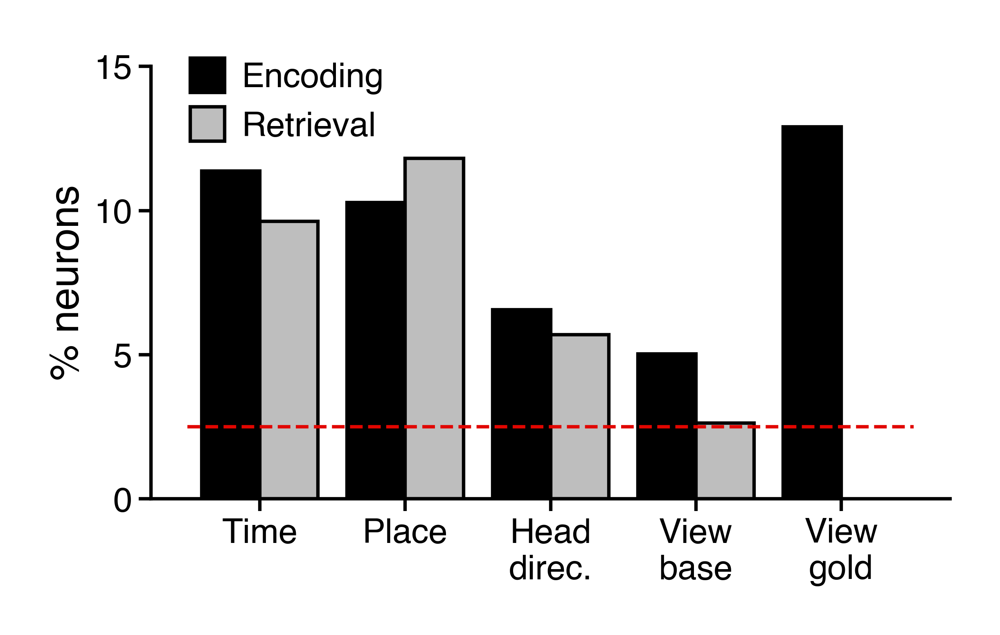

In [52]:
savefig = 0
overwrite = 0
sig_col = 'sig_pos'
test_vars = ['time', 'place', 'head_direc', 'base_in_view', 'gold_in_view']
xcats = ['Time', 'Place', 'Head\ndirec.', 'View\nbase', 'View\ngold']
ylim = [0, 15]
yticks = [0, 5, 10, 15]
figsize = (colws['2-1/3'], colws['2-1/3']/1.8)
font = {'tick': 5, 'label': 6, 'annot': 5}
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)

# Graph percent of units that code for each variable of interest.
sig_pct = (ols_pairs.query("(gameState==['Encoding', 'Retrieval']) & (testvar=={})".format(test_vars))
                    .groupby(['gameState', 'testvar'], observed=True)
                    .agg({sig_col: [np.sum, 
                                    lambda x: 100 * np.mean(x)]}).reset_index())
sig_pct.columns = ['gameState', 'testvar', 'sum', 'pct']
sig_pct['gameState'] = sig_pct['gameState'].astype(str)

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=1200)
ax = sns.barplot(x='testvar', y='pct', hue='gameState', data=sig_pct, ax=ax,
                 palette=['k', cmap[0]], saturation=1, linewidth=spine_lw, edgecolor='k')
ax.hlines(2.5, -0.5, 4.5, colors='#e10600', linestyles='dashed', lw=spine_lw)
for axis in ['left', 'bottom']:
    ax.spines[axis].set_linewidth(spine_lw)
ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
ax.set_xticklabels(xcats, fontsize=font['tick'])
ax.set_ylim(ylim)
ax.set_yticks(yticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('', fontsize=font['label'], labelpad=labelpad)
ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad-1)

# ax2 = ax.twinx()
# ax2.spines['right'].set_visible(True)
# ax2.spines['right'].set_linewidth(spine_lw)
# for axis in ['left', 'bottom', 'top']:
#     ax2.spines[axis].set_visible(False)
# ax2.tick_params(labelsize=font['tick'], pad=1, length=1.5, width=spine_lw)
# slope, icpt, *_ = stats.linregress(sig_pct['pct'], sig_pct['sum'])
# ax2.set_ylim(icpt + (np.array(ylim) * slope))
# ax2.set_yticks(icpt + (np.array(yticks)*slope))
# ax2.set_yticklabels(np.rint(icpt + (np.array(yticks)*slope)).astype(int))
# ax2.set_ylabel('No. units', fontsize=font['label'], labelpad=labelpad)

ax.get_legend().remove()
custom_lines = [Line2D([0], [0], marker='s', color='w', label='Encoding', mfc='k', mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], marker='s', color='w', label='Retrieval', mfc=cmap[0], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax.legend(handles=custom_lines, fontsize=font['annot'], bbox_to_anchor=(0.33, 1.08), handletextpad=0)

if savefig:
    n_units = np.unique(ols_pairs['subj_sess_unit']).size
    filename = op.join(proj_dir, 'figs', 'plot_navigation',
                       'pct_sig-time_place_hd_gold_base-{}units.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
            
fig.show()

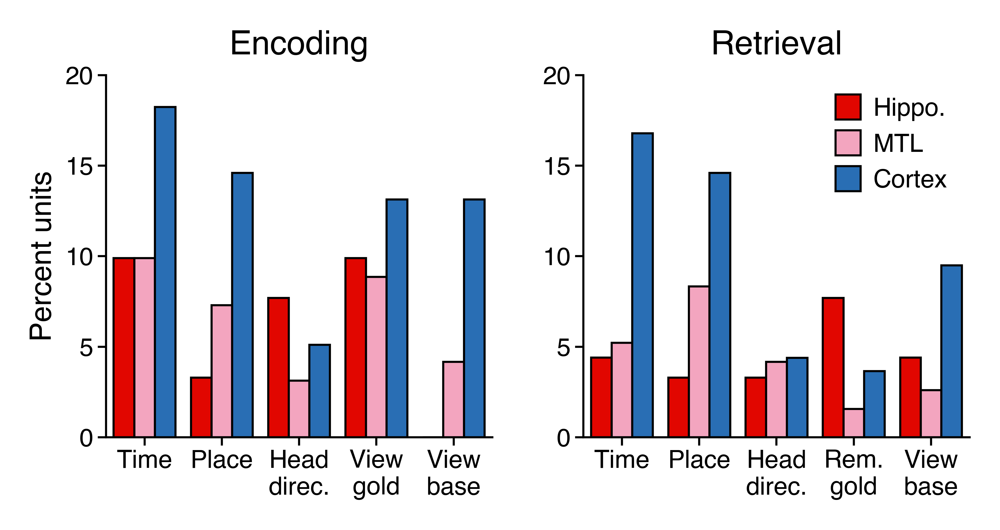

In [29]:
savefig = 0
overwrite = 0

# Graph percent of units that code for each variable of interest.
sig_pct = (ols_pairs.query("(full=='full')")
                    .groupby(['gameState', 'roi_gen', 'testvar'])
                    .agg({'sig_holm': [np.sum, 
                                       lambda x: 100 * np.mean(x)]}).reset_index())
sig_pct.columns = ['gameState', 'roi_gen', 'testvar', 'sum', 'pct']
roi_cats = ['Hippocampus', 'MTL', 'Cortex']
sig_pct['roi_gen'] = sig_pct['roi_gen'].astype(pd.CategoricalDtype(roi_cats, ordered=True))
sig_pct = sig_pct.sort_values(['gameState', 'roi_gen', 'testvar']).reset_index(drop=True)

# Plot params.
xcats = {'Encoding': ['Time', 'Place', 'Head\ndirec.', 'View\ngold', 'View\nbase'],
         'Retrieval': ['Time', 'Place', 'Head\ndirec.', 'Rem.\ngold', 'View\nbase']}
ylim = [0, 20]
yticks = [0, 5, 10, 15, 20]
# figsize = (colws['2-1/3'], colws['2-1/3']/1.8)
figsize = (colws[2], colws[2] * 0.5)
font = {'tick': 6, 'label': 7, 'annot': 6, 'fig': 8}
spine_lw = 0.5
ticklength = 2
tickpad = 1
labelpad = 3
figurepad = 5
cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)
_cmap = [cmap[1], cmap[3], cmap[2]]

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=1200)
ax = np.ravel(ax)

for iax, game_state in enumerate(['Encoding', 'Retrieval']):
    _df = sig_pct.query("(gameState=='{}')".format(game_state))
    ax[iax] = sns.barplot(x='testvar', y='pct', hue='roi_gen', data=_df, estimator=np.sum, ci=None, ax=ax[iax],
                          palette=_cmap, saturation=1, linewidth=spine_lw, edgecolor='k')
#     ax[iax].hlines(1, -0.5, 4.5, colors='#bebebe', linestyles='dashed', lw=spine_lw)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], length=ticklength, pad=tickpad, width=spine_lw)
    ax[iax].set_xticklabels(xcats[game_state], fontsize=font['tick'])
    ax[iax].set_ylim(ylim)
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(yticks)
    ax[iax].set_xlabel('', fontsize=font['label'], labelpad=labelpad)
    if iax == 0:
        ax[iax].set_ylabel('Percent units', fontsize=font['label'], labelpad=labelpad-1)
    else:
        ax[iax].set_ylabel('')
    ax[iax].get_legend().remove()
    ax[iax].set_title(game_state, fontsize=font['fig'], pad=figurepad)

custom_lines = [Line2D([0], [0], lw=0, marker='s', color='k', label='Hippo.', mfc=_cmap[0], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='MTL', mfc=_cmap[1], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='Cortex', mfc=_cmap[2], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax[iax].legend(handles=custom_lines, fontsize=font['annot'], loc=1, bbox_to_anchor=(1, 1), handletextpad=0)

fig.tight_layout(pad=0, w_pad=1.2, rect=[0, 0, 1, 1])

if savefig:
    n_units = np.unique(ols_pairs['subj_sess_unit']).size
    filename = op.join(proj_dir, 'figs', 'plot_navigation',
                       'pct_sig-time_place_hd_gold_base-by_region-{}units.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
            
fig.show()

In [77]:
roi_gen = 'roi_gen5'
fr_max_ind = 'fr_max_ind10'

game_states = ['Encoding', 'Retrieval']
units_per_region = ols_pairs[['subj_sess_unit', roi_gen]].drop_duplicates().groupby(roi_gen).size()
_ols_pairs = ols_pairs.query("(testvar=='time') & (full=='full') & (sig==True) & (gameState=={})".format(game_states)).copy()

_ols_pairs['peak_fr_ind'] = _ols_pairs[fr_max_ind]
peak_fr_counts = _ols_pairs.groupby(['gameState', roi_gen, 'peak_fr_ind']).size().reset_index().rename(columns={'peak_fr_ind': 'time', 0: 'count'})

_counts = peak_fr_counts.groupby(['gameState', roi_gen])['count'].apply(np.sum).to_dict()
peak_fr_counts['prop_sig'] = peak_fr_counts.apply(lambda x: 100 * (x['count'] / _counts[(x['gameState'], x[roi_gen])]), axis=1)
peak_fr_counts['prop_all'] = peak_fr_counts.apply(lambda x: 100 * (x['count'] / units_per_region[x[roi_gen]]), axis=1)

roi_cats = ['Hippocampus', 'MTL', 'Frontal', 'Temporal']
peak_fr_counts[roi_gen] = peak_fr_counts[roi_gen].astype(pd.CategoricalDtype(roi_cats, ordered=True))
peak_fr_counts = peak_fr_counts.sort_values(['gameState', roi_gen, 'time']).reset_index(drop=True)

In [78]:
peak_fr_counts.groupby(['gameState', roi_gen]).agg({'count': np.sum, 'prop_sig': np.sum, 'prop_all': np.sum})

count  prop_sig   prop_all
gameState roi_gen5                               
Encoding  Hippocampus     16     100.0  14.678899
          MTL             32     100.0  15.686275
          Frontal         24     100.0  34.782609
          Temporal        16     100.0  21.333333
Retrieval Hippocampus     14     100.0  12.844037
          MTL             32     100.0  15.686275
          Frontal         14     100.0  20.289855
          Temporal        20     100.0  26.666667

In [16]:
peak_fr_counts.groupby(['gameState', 'roi_gen']).agg({'count': np.sum, 'prop_sig': np.sum, 'prop_all': np.sum})

count  prop_sig   prop_all
gameState roi_gen                                
Encoding  Hippocampus      9     100.0   9.890110
          MTL             19     100.0   9.895833
          Cortex          25     100.0  18.248175
Retrieval Hippocampus      4     100.0   4.395604
          MTL             10     100.0   5.208333
          Cortex          23     100.0  16.788321

IndexError: list index out of range

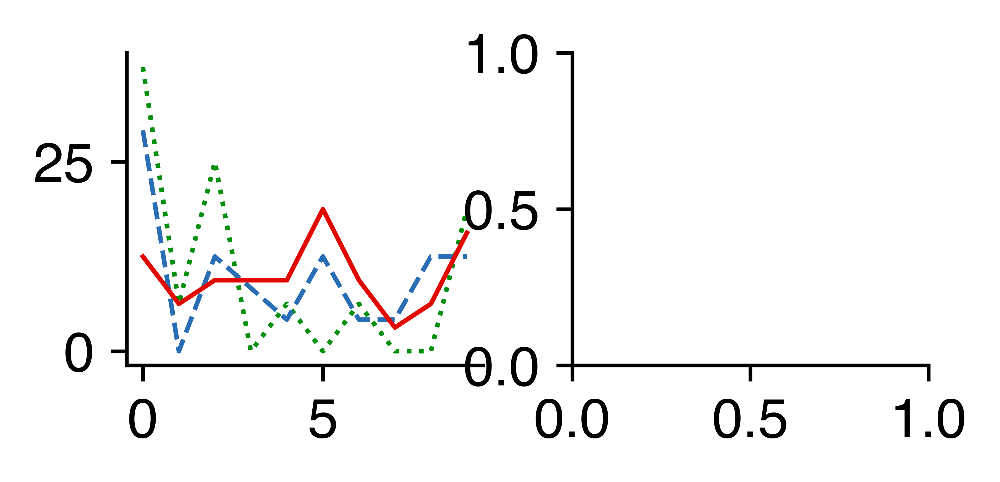

In [85]:
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2] * 0.4)
dpi = 1200
font = {'tick': 6, 'label': 7, 'annot': 6, 'fig': 8}
lw = 1
spine_lw = 0.5
ticklength = 2
tickpad = 1
labelpad = 3
figurepad = 5

rois = ['Temporal', 'Frontal', 'MTL', 'Hippocampus']
linestyles = ['dotted', '--', '-']

plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

# cmap = {0: (190, 190, 190), # gray
#         1: (225, 6, 0), # red
#         2: (41, 110, 180), # blue
#         3: (243, 165, 191)} # pink
# for k in cmap:
#     cmap[k] = list(np.array(cmap[k])/255)
# _cmap = [cmap[1], cmap[3], cmap[2]]

_cmap = ['#008f0a', '#296eb4', '#e10600', 'k']
    
for iax, game_state in enumerate(['Encoding', 'Retrieval']):
    _df = peak_fr_counts.query("(gameState=='{}')".format(game_state)).copy()
#     ax[iax] = sns.barplot(x='time', y='prop_all', hue='roi_gen', data=_df, estimator=np.sum, ci=None, ax=ax[iax],
#                         palette=_cmap, saturation=1, linewidth=spine_lw, edgecolor='k')
    for iRoi, roi in enumerate(rois):
        xvals = np.arange(10)
        yvals = []
        for xval in xvals:
            yvals.append(peak_fr_counts.query("(gameState=='{}') & ({}=='{}')".format(game_state, roi_gen, roi)).set_index('time')['prop_all'].get(xval, 0))
        xvals = np.array(xvals)
        ax[iax].plot(xvals, yvals, color=_cmap[iRoi], lw=lw, linestyle=linestyles[iRoi])
    # ax[iax].hlines(ols_pairs['subj_sess_unit'].unique().size * 0.005, -0.75, 9.75, colors='#e10600', linestyles='dashed', lw=spine_lw)
    ax[iax].tick_params(axis='both', width=spine_lw, length=ticklength, pad=tickpad, color='k', labelsize=font['tick'])
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    if fr_max_col == 'fr_max_ind10':
        ax[iax].set_xlim([-0.5, 9.5])
        ax[iax].set_xticks(np.arange(11)-0.5)
        ax[iax].set_xticklabels(np.arange(0, 33, 3), fontsize=font['tick'])
    elif fr_max_col == 'fr_max_ind5':
        ax[iax].set_xlim([0, 4])
        ax[iax].set_xticks(np.arange(5))
        ax[iax].set_xticklabels(['0-6', '6-12', '12-18', '18-24', '24-30'], fontsize=font['tick'])
    ax[iax].set_ylim([0, 12])
    yticks = [0, 4, 8, 12]
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(yticks, fontsize=font['tick'])
    ax[iax].set_xlabel('{} time (s)'.format(game_state), fontsize=font['label'], labelpad=labelpad)
    if iax == 0:
        ax[iax].set_ylabel('Pct. neurons', fontsize=font['label'], labelpad=labelpad)
    else:
        ax[iax].set_ylabel('')
#     ax[iax].set_title(game_state.replace('Delay', 'Delay '), fontsize=font['fig'], pad=figurepad)
#     ax[iax].get_legend().remove()

custom_lines = [Line2D([0], [0], lw=0, marker='s', color='k', label='Hippo.', mfc=_cmap[2], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='MTL', mfc=_cmap[1], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='Cortex', mfc=_cmap[0], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax[iax].legend(handles=custom_lines, fontsize=font['annot'], loc=1, bbox_to_anchor=(1, 1), handletextpad=0)

fig.tight_layout(pad=0, w_pad=0.5, rect=[0, 0, 1, 1])

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_nav', 'navigation_time_cell_peak_firing_time_percents_by_region_all.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

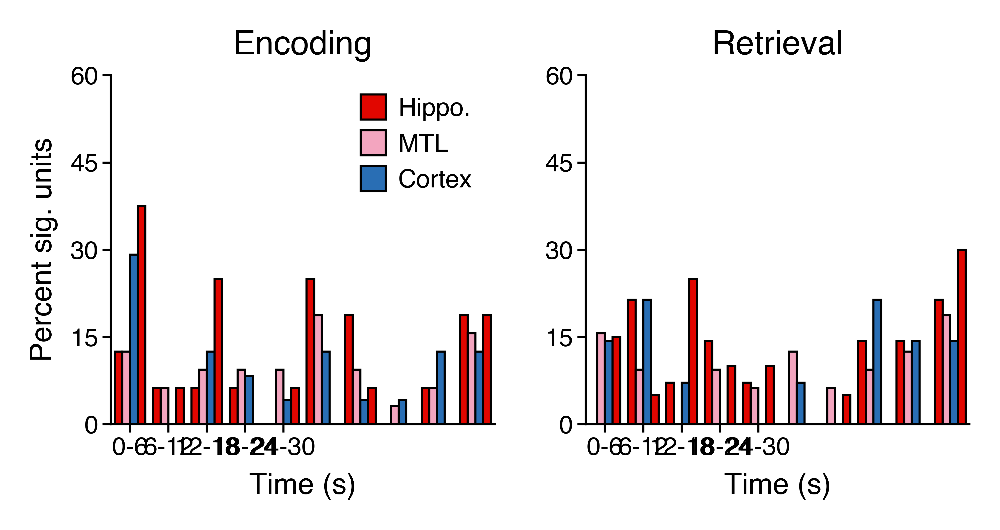

In [84]:
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2] * 0.5)
dpi = 1200
font = {'tick': 6, 'label': 7, 'annot': 6, 'fig': 8}
spine_lw = 0.5
ticklength = 2
tickpad = 1
labelpad = 3
figurepad = 5

plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)
_cmap = [cmap[1], cmap[3], cmap[2]]
    
for iax, game_state in enumerate(['Encoding', 'Retrieval']):
    _df = peak_fr_counts.query("(gameState=='{}')".format(game_state)).copy()
    ax[iax] = sns.barplot(x='time', y='prop_sig', hue=roi_gen, data=_df, estimator=np.sum, ci=None, ax=ax[iax],
                        palette=_cmap, saturation=1, linewidth=spine_lw, edgecolor='k')
    # ax[iax].hlines(ols_pairs['subj_sess_unit'].unique().size * 0.005, -0.75, 9.75, colors='#e10600', linestyles='dashed', lw=spine_lw)
    ax[iax].tick_params(axis='both', width=spine_lw, length=ticklength, pad=tickpad, color='k', labelsize=font['tick'])
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].set_xticks(np.arange(5))
    ax[iax].set_xticklabels(['0-6', '6-12', '12-18', '18-24', '24-30'], fontsize=font['tick'])
    ax[iax].set_ylim([0, 60])
    yticks = [0, 15, 30, 45, 60]
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(yticks, fontsize=font['tick'])
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    if iax == 0:
        ax[iax].set_ylabel('Percent sig. units', fontsize=font['label'], labelpad=labelpad)
    else:
        ax[iax].set_ylabel('')
    ax[iax].set_title(game_state.replace('Delay', 'Delay '), fontsize=font['fig'], pad=figurepad)
    ax[iax].get_legend().remove()

custom_lines = [Line2D([0], [0], lw=0, marker='s', color='k', label='Hippo.', mfc=_cmap[0], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='MTL', mfc=_cmap[1], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='Cortex', mfc=_cmap[2], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax[0].legend(handles=custom_lines, fontsize=font['annot'], loc=1, bbox_to_anchor=(1, 1), handletextpad=0)

fig.tight_layout(pad=0, w_pad=1.2, rect=[0, 0, 1, 1])

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation', 'navigation_time_cell_peak_firing_time_percents_by_region.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

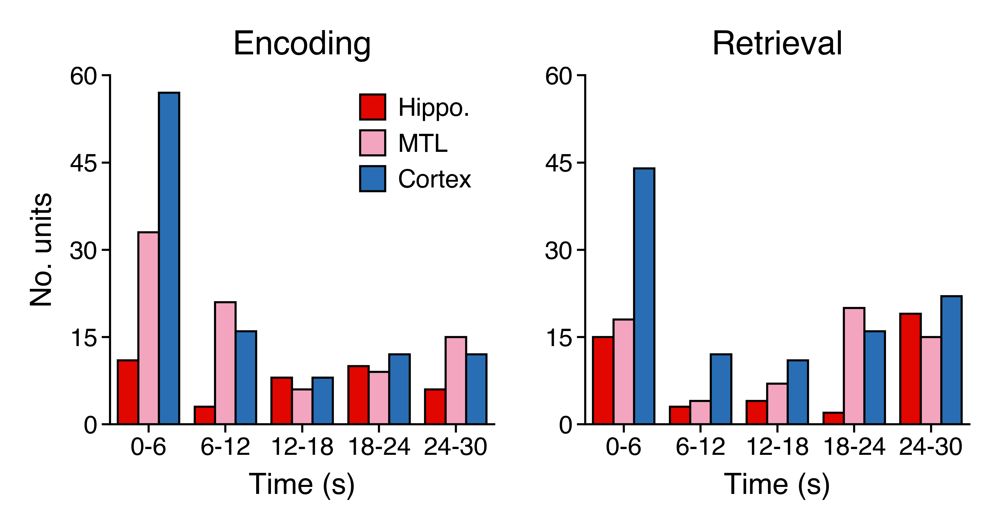

In [34]:
savefig = 1
overwrite = 1
figsize = (colws[2], colws[2] * 0.5)
dpi = 1200
font = {'tick': 6, 'label': 7, 'annot': 6, 'fig': 8}
spine_lw = 0.5
ticklength = 2
tickpad = 1
labelpad = 3
figurepad = 5

plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)
_cmap = [cmap[1], cmap[3], cmap[2]]
    
for iax, game_state in enumerate(['Encoding', 'Retrieval']):
    _df = peak_fr_counts.query("(gameState=='{}')".format(game_state)).copy()
    ax[iax] = sns.barplot(x='time', y='count', hue='roi_gen', data=_df, estimator=np.sum, ci=None, ax=ax[iax],
                        palette=_cmap, saturation=1, linewidth=spine_lw, edgecolor='k')
    # ax[iax].hlines(ols_pairs['subj_sess_unit'].unique().size * 0.005, -0.75, 9.75, colors='#e10600', linestyles='dashed', lw=spine_lw)
    ax[iax].tick_params(axis='both', width=spine_lw, length=ticklength, pad=tickpad, color='k', labelsize=font['tick'])
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].set_xticks(np.arange(5))
    ax[iax].set_xticklabels(['0-6', '6-12', '12-18', '18-24', '24-30'], fontsize=font['tick'])
    ax[iax].set_ylim([0, 60])
    yticks = [0, 15, 30, 45, 60]
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(yticks, fontsize=font['tick'])
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    if iax == 0:
        ax[iax].set_ylabel('No. units', fontsize=font['label'], labelpad=labelpad)
    else:
        ax[iax].set_ylabel('')
    ax[iax].set_title(game_state.replace('Delay', 'Delay '), fontsize=font['fig'], pad=figurepad)
    ax[iax].get_legend().remove()

custom_lines = [Line2D([0], [0], lw=0, marker='s', color='k', label='Hippo.', mfc=_cmap[0], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='MTL', mfc=_cmap[1], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='Cortex', mfc=_cmap[2], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax[0].legend(handles=custom_lines, fontsize=font['annot'], loc=1, bbox_to_anchor=(1, 1), handletextpad=0)

fig.tight_layout(pad=0, w_pad=1.2, rect=[0, 0, 1, 1])

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation', 'navigation_time_cell_peak_firing_time_counts_by_region.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

In [35]:
n_bins_per_step = 12
game_states = ['Encoding', 'Retrieval']

_ols_pairs = ols_pairs.query("(testvar=='time') & (sig==True) & (gameState=={})".format(game_states)).copy()
_ols_pairs['peak_fr_ind'] = _ols_pairs['fr_max_ind'].apply(lambda x: int(x/n_bins_per_step))
peak_fr_counts = _ols_pairs.groupby(['gameState', 'roi_gen', 'peak_fr_ind']).size().reset_index().rename(columns={'peak_fr_ind': 'time', 0: 'count'})

roi_cats = ['MTL', 'Cortex']
peak_fr_counts.loc[peak_fr_counts['roi_gen']=='Hippocampus', 'roi_gen'] = 'MTL'
peak_fr_counts['roi_gen'] = peak_fr_counts['roi_gen'].astype(pd.CategoricalDtype(roi_cats, ordered=True))
peak_fr_counts = peak_fr_counts.sort_values(['gameState', 'roi_gen', 'time']).reset_index(drop=True)

_counts = peak_fr_counts.groupby(['gameState', 'roi_gen'])['count'].apply(np.sum).to_dict()
peak_fr_counts['prop'] = peak_fr_counts.apply(lambda x: 100 * (x['count'] / _counts[(x['gameState'], x['roi_gen'])]), axis=1)

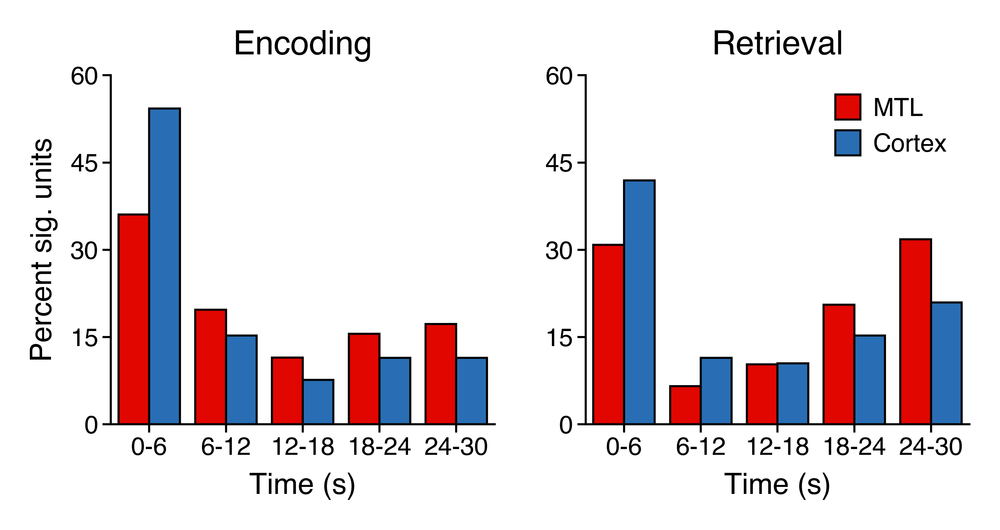

In [38]:
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2] * 0.5)
dpi = 1200
font = {'tick': 6, 'label': 7, 'annot': 6, 'fig': 8}
spine_lw = 0.5
ticklength = 2
tickpad = 1
labelpad = 3
figurepad = 5

plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)
_cmap = [cmap[1], cmap[2]]
    
for iax, game_state in enumerate(['Encoding', 'Retrieval']):
    _df = peak_fr_counts.query("(gameState=='{}')".format(game_state)).copy()
    ax[iax] = sns.barplot(x='time', y='prop', hue='roi_gen', data=_df, estimator=np.sum, ci=None, ax=ax[iax],
                        palette=_cmap, saturation=1, linewidth=spine_lw, edgecolor='k')
    # ax[iax].hlines(ols_pairs['subj_sess_unit'].unique().size * 0.005, -0.75, 9.75, colors='#e10600', linestyles='dashed', lw=spine_lw)
    ax[iax].tick_params(axis='both', width=spine_lw, length=ticklength, pad=tickpad, color='k', labelsize=font['tick'])
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].set_xticks(np.arange(5))
    ax[iax].set_xticklabels(['0-6', '6-12', '12-18', '18-24', '24-30'], fontsize=font['tick'])
    ax[iax].set_ylim([0, 60])
    yticks = [0, 15, 30, 45, 60]
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(yticks, fontsize=font['tick'])
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    if iax == 0:
        ax[iax].set_ylabel('Percent sig. units', fontsize=font['label'], labelpad=labelpad)
    else:
        ax[iax].set_ylabel('')
    ax[iax].set_title(game_state.replace('Delay', 'Delay '), fontsize=font['fig'], pad=figurepad)
    ax[iax].get_legend().remove()

custom_lines = [Line2D([0], [0], lw=0, marker='s', color='k', label='MTL', mfc=_cmap[0], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='Cortex', mfc=_cmap[1], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax[iax].legend(handles=custom_lines, fontsize=font['annot'], loc=1, bbox_to_anchor=(1, 1), handletextpad=0)

fig.tight_layout(pad=0, w_pad=1.2, rect=[0, 0, 1, 1])

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation', 'navigation_time_cell_peak_firing_time_percents_by_region2.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

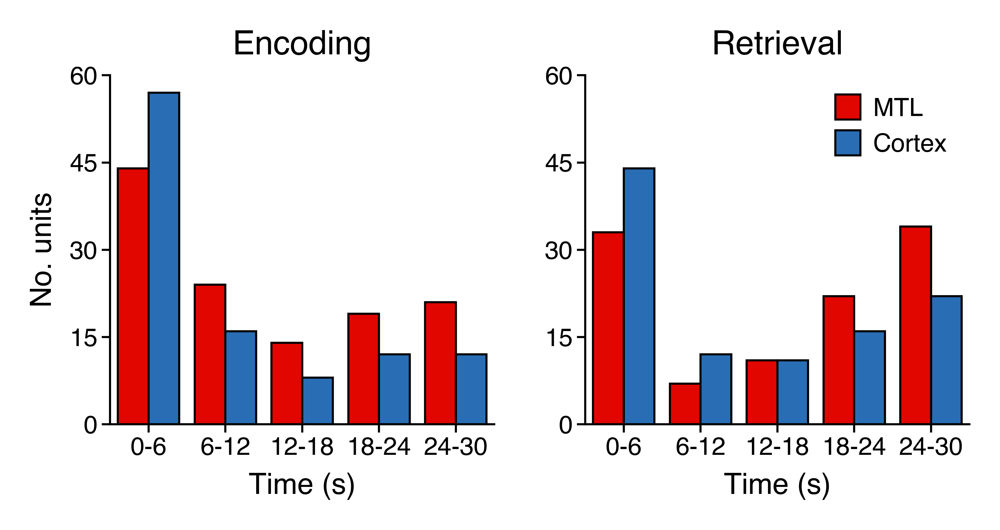

In [39]:
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2] * 0.5)
dpi = 1200
font = {'tick': 6, 'label': 7, 'annot': 6, 'fig': 8}
spine_lw = 0.5
ticklength = 2
tickpad = 1
labelpad = 3
figurepad = 5

plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

cmap = {0: (190, 190, 190), # gray
        1: (225, 6, 0), # red
        2: (41, 110, 180), # blue
        3: (243, 165, 191)} # pink
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)
_cmap = [cmap[1], cmap[2]]
    
for iax, game_state in enumerate(['Encoding', 'Retrieval']):
    _df = peak_fr_counts.query("(gameState=='{}')".format(game_state)).copy()
    ax[iax] = sns.barplot(x='time', y='count', hue='roi_gen', data=_df, estimator=np.sum, ci=None, ax=ax[iax],
                        palette=_cmap, saturation=1, linewidth=spine_lw, edgecolor='k')
    # ax[iax].hlines(ols_pairs['subj_sess_unit'].unique().size * 0.005, -0.75, 9.75, colors='#e10600', linestyles='dashed', lw=spine_lw)
    ax[iax].tick_params(axis='both', width=spine_lw, length=ticklength, pad=tickpad, color='k', labelsize=font['tick'])
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].set_xticks(np.arange(5))
    ax[iax].set_xticklabels(['0-6', '6-12', '12-18', '18-24', '24-30'], fontsize=font['tick'])
    ax[iax].set_ylim([0, 60])
    yticks = [0, 15, 30, 45, 60]
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(yticks, fontsize=font['tick'])
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    if iax == 0:
        ax[iax].set_ylabel('No. units', fontsize=font['label'], labelpad=labelpad)
    else:
        ax[iax].set_ylabel('')
    ax[iax].set_title(game_state.replace('Delay', 'Delay '), fontsize=font['fig'], pad=figurepad)
    ax[iax].get_legend().remove()

custom_lines = [Line2D([0], [0], lw=0, marker='s', color='k', label='MTL', mfc=_cmap[0], mew=spine_lw, mec='k', ms=font['annot']),
                Line2D([0], [0], lw=0, marker='s', color='k', label='Cortex', mfc=_cmap[1], mew=spine_lw, mec='k', ms=font['annot'])]
legend = ax[iax].legend(handles=custom_lines, fontsize=font['annot'], loc=1, bbox_to_anchor=(1, 1), handletextpad=0)

fig.tight_layout(pad=0, w_pad=1.2, rect=[0, 0, 1, 1])

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation', 'navigation_time_cell_peak_firing_time_counts_by_region2.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

In [145]:
# How strongly are significant neurons tuned?
# In what brain regions are these neurons located?
def mean_sem(val):
    return '{:.1f} ± {:.1f}'.format(np.mean(val), stats.sem(val))

def unique_dict(vec):
    vals, counts = np.unique(vec, return_counts=True)
    output = od([])
    for _i in range(len(vals)):
        output[vals[_i]] = counts[_i]
    return output

n_units_by_roi = ols_pairs.drop_duplicates('subj_sess_unit').groupby('roi_gen').size().to_dict()
_df = (ols_pairs.query("(full=='full') & (sig_holm==True)")
                .groupby(['gameState', 'testvar'])
                .agg({'z_lr': mean_sem, 
                      'roi_gen': unique_dict})
                .reset_index())
for roi in np.sort(list(n_units_by_roi.keys())):
    _df[roi] = _df['roi_gen'].apply(lambda x: '{}/{} ({:.1%})'.format(x.get(roi, 0), n_units_by_roi[roi], x.get(roi, 0)/n_units_by_roi[roi]))
_df.drop(columns=['roi_gen'], inplace=True)

_df

,gameState,testvar,z_lr,Cortex,Hippocampus,MTL
0,Encoding,time,4.6 ± 0.2,25/136 (18.4%),9/88 (10.2%),19/183 (10.4%)
1,Encoding,place,6.0 ± 0.6,20/136 (14.7%),3/88 (3.4%),14/183 (7.7%)
2,Encoding,head_direc,5.2 ± 0.6,7/136 (5.1%),7/88 (8.0%),6/183 (3.3%)
3,Encoding,gold_in_view,8.9 ± 0.9,18/136 (13.2%),9/88 (10.2%),16/183 (8.7%)
4,Encoding,base_in_view,19.1 ± 4.6,18/136 (13.2%),0/88 (0.0%),7/183 (3.8%)
5,Retrieval,time,4.6 ± 0.2,23/136 (16.9%),4/88 (4.5%),10/183 (5.5%)
6,Retrieval,place,5.9 ± 0.7,20/136 (14.7%),3/88 (3.4%),16/183 (8.7%)
7,Retrieval,head_direc,5.3 ± 1.0,6/136 (4.4%),3/88 (3.4%),7/183 (3.8%)
8,Retrieval,gold_in_view,7.1 ± 0.8,5/136 (3.7%),7/88 (8.0%),3/183 (1.6%)
9,Retrieval,base_in_view,23.1 ± 6.0,13/136 (9.6%),4/88 (4.5%),5/183 (2.7%)


# Single-cell examples: time, place, head direction, and view coding

In [ ]:
# neurons = ['U518_ses0-4-1', 'U532_ses0-4-1', 'U530_ses0-13-1', 'U518_ses0-73-1', 'U518_ses1-38-1', 'U532_ses0-10-1',
#            'U532_ses0-5-8', 'U530_ses0-3-2', 'U526_ses0-12-2', 'U518_ses0-73-1', 'U527_ses0-58-2', 'U532_ses0-8-2',
#            'U518_ses1-43-2', 'U532_ses0-4-3', 'U532_ses0-3-2', 'U518_ses1-36-1']

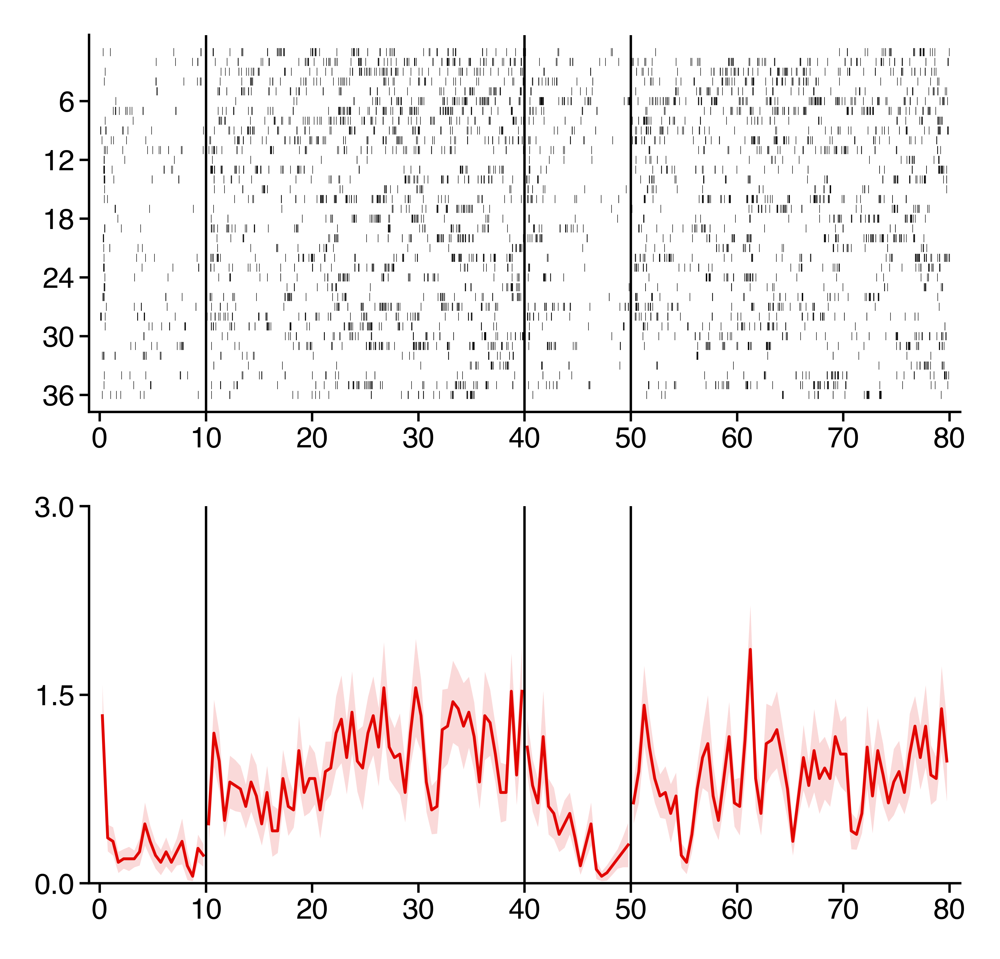

In [89]:
# Save raster and firing rate plots for chosen neuron.
subj_sess_unit = 'U537_ses0-24-1'
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
savefig = 0
overwrite = 1
figsize = (3.25, 3.25)
dpi = 1200
font = {'tick': 6, 'label': 8, 'annot': 8, 'fig': 9}
ax_linewidth = 0.5
labelpad = 2
plot_vlines = 1
plot_labels = 0
plot_game_states = 0
plot_title = 0
rastersize = 1.7
rasterwidth = 0.1

plt.close()
fig, ax = plt.subplots(2, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
subj_sess = subj_sess_unit.split('-')[0]
neuron = '-'.join(subj_sess_unit.split('-')[1:])
ax[iax] = time_cell_plots.time_raster(subj_sess,
                                      neuron,
                                      game_states=game_states,
                                      plot_vlines=plot_vlines,
                                      plot_labels=plot_labels,
                                      plot_game_states=plot_game_states,
                                      plot_title=plot_title,
                                      ax=ax[iax],
                                      font=font,
                                      labelpad=labelpad,
                                      ax_linewidth=ax_linewidth,
                                      rastersize=rastersize,
                                      rasterwidth=rasterwidth)
iax += 1
ax[iax] = time_cell_plots.firing_rate_over_time(subj_sess,
                                                neuron,
                                                game_states=game_states,
                                                plot_vlines=plot_vlines,
                                                plot_labels=plot_labels,
                                                plot_game_states=plot_game_states,
                                                plot_title=plot_title,
                                                ax=ax[iax],
                                                font=font,
                                                labelpad=labelpad,
#                                                 ymin=1.5,
#                                                 ymax=1.5,
#                                                 yticks=[1, 3, 5],
                                                ax_linewidth=ax_linewidth)

if savefig:
    chan, unit = neuron.split('-')
    hemroi = spike_preproc.roi_lookup(subj_sess, chan)
    filename = op.join(proj_dir, 'figs', 'plot_rasters',
                       '{}-CSC{}-unit{}-{}-{}-raster.pdf'.format(subj_sess, chan, unit, hemroi, '_'.join(game_states)))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
            
fig.show()

In [ ]:
units = ['U518_ses1-43-2', 'U518_ses1-67-2', 'U518_ses1-38-1', 'U521_ses0-21-1', 'U532_ses0-4-3', 'U532_ses0-8-2']
cols = ['subj_sess_unit', 'hem', 'roi', 'gameState', 'testvar', 'full', 'z_lr', 'emp_pval', 'sig_holm', 'fr_mean', 'fr_max']
_units = ['U518_ses1-43-2', 'U521_ses0-21-1', 'U532_ses0-4-3']
ols_pairs.query("(full=='full') & (subj_sess_unit=={}) & (sig_holm==True)".format(_units)).reset_index(drop=True)[cols]

U536_ses0-76-1, Retrieval, Z = 3.5, sig = True
Done in 49.7s


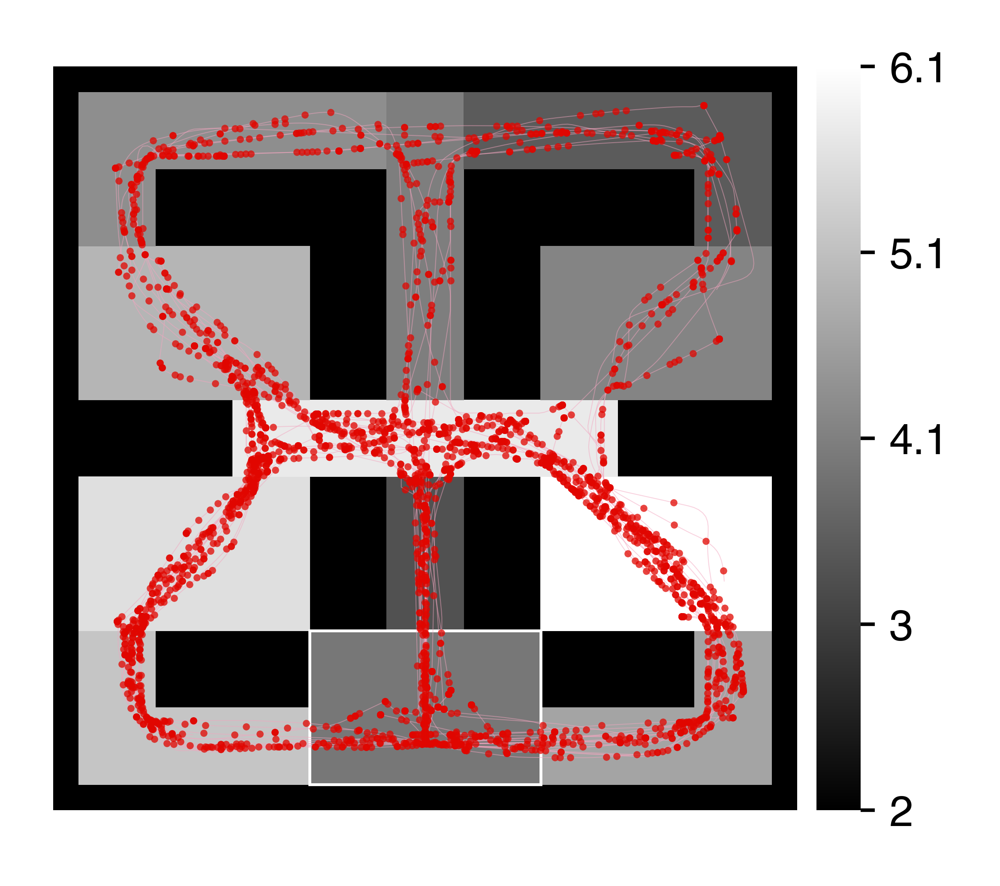

In [106]:
# Plot a neuron's firing rate by maze location.
savefig = False
overwrite = False
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 9}
base_color = 'w'
game_states = ['Encoding', 'Retrieval']
only_show_spikes_when_moving = False

start_time = time()

# unit = 'U518_ses1-43-2'
# unit = 'U521_ses0-21-1'
unit = 'U532_ses0-4-3'
game_state = 'Encoding'
# _df = ols_pairs.query("(testvar=='place') & (subj_sess_unit=='{}') & (gameState=='{}')".format(unit, game_state))
_df = ols_pairs.query("(testvar=='place') & (full=='full') & (sig_holm==True) & (subj_sess=='U536_ses0')")
# units = ['U518_ses1-43-2', 'U518_ses1-67-2', 'U518_ses1-38-1', 'U521_ses0-21-1', 'U532_ses0-8-2', 'U532_ses0-4-3']
# _df = ols_pairs.query("(testvar=='place') & (full=='full') & (subj_sess_unit=={}) & (gameState=={})".format(units, game_states))
for idx, row in _df.iterrows():
    subj_sess = row['subj_sess']
    neuron = row['neuron']
    game_state = row['gameState']
    
    fig, ax = plot_firing_maze(subj_sess, 
                               neuron, 
                               game_state, 
                               font=font, 
                               base_color=base_color,
                               only_show_spikes_when_moving=only_show_spikes_when_moving,
                               nav_lw=0.12,
                               nav_color='#296eb4', #f3a5bf
                               nav_alpha=0.5,
                               spike_marker='.',
                               spike_fill_color='#e10600',
                               spike_edge_color='#e10600',
                               spike_alpha=0.75, # 0.25 0.5
                               spike_markersize=2, # 1
                               spike_mew=0,
                               dpi=dpi)

    if savefig:
        chan, unit = neuron.split('-')
        hemroi = spike_preproc.roi_lookup(subj_sess, chan)
        filename = op.join(proj_dir, 'figs', 'plot_navigation', 
                           '{}-CSC{}-unit{}-{}-{}-place_firing.png'.format(subj_sess, chan, unit, hemroi, game_state))
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='png', dpi=dpi, bbox_inches='tight')

print('{}-{}, {}, Z = {:.1f}, sig = {}'.format(subj_sess, neuron, game_state, row['z_lr'], row['sig_holm']))
print('Done in {:.1f}s'.format(time() - start_time))
fig.show()

# Neural coding strength between behav. parameter pairs

In [45]:
# Compare each neuron's time coding strength between game state pairs.
sig_col = 'sig_holm'
game_state_pairs = [('Encoding', 'Encoding'),
                    ('Retrieval', 'Retrieval'),
                    ('Encoding', 'Retrieval')]
testvar_pairs = [('time', 'time'),
                 ('place', 'place'),
                 ('head_direc', 'head_direc'),
                 ('base_in_view', 'base_in_view'),
                 ('gold_in_view', 'gold_in_view'),
                 ('time', 'place'),
                 ('time', 'head_direc'),
                 ('time', 'base_in_view'),
                 ('time', 'gold_in_view'),
                 ('place', 'head_direc'),
                 ('place', 'base_in_view'),
                 ('place', 'gold_in_view'),
                 ('head_direc', 'base_in_view'),
                 ('head_direc', 'gold_in_view'),
                 ('base_in_view', 'gold_in_view')]

cols = ['subj_sess', 'neuron', 'gameState1', 'gameState2', 'testvar1', 'testvar2', 'zlr1', 'zlr2', 'sig1', 'sig2']
subj_sess_units = list(np.unique(ols_pairs['subj_sess_unit']))
param_strength = []
for subj_sess_unit in subj_sess_units:
    subj_sess, chan, unit = subj_sess_unit.split('-')
    neuron = '{}-{}'.format(chan, unit)
    for game_state_pair in game_state_pairs:
        gs1, gs2 = game_state_pair
        for tv1, tv2 in testvar_pairs:
            qry1 = "(subj_sess_unit=='{}') & (gameState=='{}') & (testvar=='{}') & (full=='full')".format(subj_sess_unit, gs1, tv1)
            qry2 = "(subj_sess_unit=='{}') & (gameState=='{}') & (testvar=='{}') & (full=='full')".format(subj_sess_unit, gs2, tv2)
            param_strength.append([subj_sess,
                                   neuron,
                                   gs1,
                                   gs2,
                                   tv1,
                                   tv2,
                                   ols_pairs.query(qry1).iloc[0]['z_lr'], 
                                   ols_pairs.query(qry2).iloc[0]['z_lr'],
                                   ols_pairs.query(qry1).iloc[0][sig_col], 
                                   ols_pairs.query(qry2).iloc[0][sig_col]])
        
param_strength = pd.DataFrame(param_strength, columns=cols)
param_strength.insert(0, 'subj_sess_unit', param_strength.apply(lambda x: '{}-{}'.format(x['subj_sess'], x['neuron']), axis=1))

# Determine if each neuron is a time cell, place cell, both, or neither.
param_strength['sig_state'] = 0
param_strength.loc[(param_strength['sig1']==True) & (param_strength['sig2']==False), 'sig_state'] = 2
param_strength.loc[(param_strength['sig1']==False) & (param_strength['sig2']==True), 'sig_state'] = 3
param_strength.loc[(param_strength['sig1']==True) & (param_strength['sig2']==True), 'sig_state'] = 1

print('param_strength:', param_strength.shape)

In [13]:
param_strength.head()

,subj_sess_unit,subj_sess,neuron,gameState1,gameState2,testvar1,testvar2,zlr1,zlr2,sig1,sig2,sig_state
0,U518_ses0-11-1,U518_ses0,11-1,Encoding,Encoding,time,time,-0.088040,-0.088040,False,False,0
1,U518_ses0-11-1,U518_ses0,11-1,Encoding,Encoding,place,place,1.023567,1.023567,False,False,0
2,U518_ses0-11-1,U518_ses0,11-1,Encoding,Encoding,head_direc,head_direc,-0.307546,-0.307546,False,False,0
3,U518_ses0-11-1,U518_ses0,11-1,Encoding,Encoding,base_in_view,base_in_view,-0.202968,-0.202968,False,False,0
4,U518_ses0-11-1,U518_ses0,11-1,Encoding,Encoding,gold_in_view,gold_in_view,-0.462467,-0.462467,False,False,0


time place 0.13333333333333333 4.152218765705752 0.000999000999000999
time head_direc 0.04040404040404041 0.4299028108184574 0.4145854145854146
time gold_in_view 0.0625 0.9743590704987474 0.23076923076923078
time base_in_view 0.05454545454545454 0.7515890692088847 0.2727272727272727


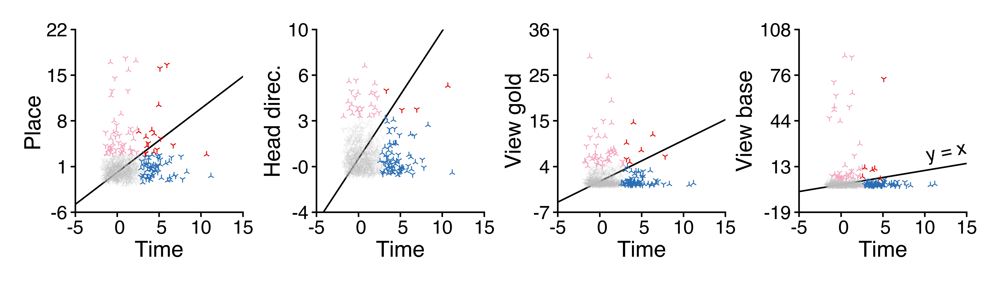

In [19]:
# Plot Z-scored likelihood ratios for behavioral variable pairs.
savefig = False
overwrite = False
add_legend = False
n_perm = 1000

# Plot params.
figsize = (colws['2-2/3'], colws['2-2/3']/4)
font = {'tick': 6, 'label': 7, 'annot': 6}
spine_lw = 0.5
marker_size = 0.5
marker_lw = 0.3
_testvar_pairs = [('time', 'place'),
                  ('time', 'head_direc'),
                  ('time', 'gold_in_view'),
                  ('time', 'base_in_view'),]
fancy_labels = {'time': 'Time',
                'place': 'Place',
                'head_direc': 'Head direc.',
                'base_in_view': 'View base',
                'gold_in_view': 'View gold'}

cmap = {0: (190, 190, 190), # gray #bebebe
        1: (225, 6, 0), # red #e10600
        2: (41, 110, 180), # blue #296eb4
        3: (243, 165, 191)} # pink #f3a5bf
for k in cmap:
    cmap[k] = list(np.array(cmap[k])/255)

# Make the plot.
plt.close()
#fig, ax = plt.subplots(1, 4, figsize=(colws[2], colws[2]/4), dpi=1200)
fig, ax = plt.subplots(1, 4, figsize=figsize, dpi=1200)
ax = np.ravel(ax)

iax = 0
vmin = -3
vmax = 20
for tv1, tv2 in _testvar_pairs:
    qry1 = "(gameState1=='Encoding') & (gameState2=='Encoding') & (testvar1=='{}') & (testvar2=='{}')".format(tv1, tv2)
    qry2 = "(gameState1=='Retrieval') & (gameState2=='Retrieval') & (testvar1=='{}') & (testvar2=='{}')".format(tv1, tv2)
    _df = pd.concat((param_strength.query(qry1), param_strength.query(qry2)))
    jaccard = jaccard_score(_df['sig1'], _df['sig2'])
    jaccard, jaccard_z, pval = jaccard_permtest(_df['sig1'].copy().values, 
                                                _df['sig2'].copy().values,
                                                n_perm=n_perm)
    print(tv1, tv2, jaccard, jaccard_z, pval)
    _cmap = {_i: cmap[_i] for _i in _df['sig_state'].unique() if (_i!=0)}
    _min = np.floor(np.min(_df.dropna()['zlr1'].to_numpy())).astype(int)
    _max = np.ceil(np.max(_df.dropna()['zlr1'].to_numpy())).astype(int)
    xmin = _min - (0.2 * (_max - _min))
    xmax = _max + (0.2 * (_max - _min))
    _min = np.floor(np.min(_df.dropna()['zlr2'].to_numpy())).astype(int)
    _max = np.ceil(np.max(_df.dropna()['zlr2'].to_numpy())).astype(int)
    ymin = _min - (0.2 * (_max - _min))
    ymax = _max + (0.2 * (_max - _min))
    vmin = np.max((xmin, ymin))
    vmax = np.min((xmax, ymax))
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=1.5, width=spine_lw)
    ax[iax].plot(np.linspace(vmin, vmax), np.linspace(vmin, vmax), color='k', lw=spine_lw, zorder=0)
    ax[iax] = sns.scatterplot('zlr1', 'zlr2', hue='sig_state', style='gameState1',
                              data=_df.query("(sig_state==0)"), ax=ax[iax],
                              markers=['2', '1'], 
                              alpha=0.2, 
                              size=marker_size, 
                              linewidth=marker_lw, 
                              palette=[cmap[0]], 
                              edgecolor='face',
                              legend=False)
    ax[iax] = sns.scatterplot('zlr1', 'zlr2', hue='sig_state', style='gameState1',
                              data=_df.query("(sig_state!=0)"), ax=ax[iax],
                              markers=['2', '1'], 
                              alpha=1, 
                              size=marker_size, 
                              linewidth=marker_lw, 
                              palette=_cmap, 
                              edgecolor='face',
                              legend=False)
    xticks = np.linspace(xmin, xmax, 5)
    yticks = np.linspace(ymin, ymax, 5)
    ax[iax].set_xlim([xmin, xmax])
    ax[iax].set_xticks(xticks)
    ax[iax].set_xticklabels(['{:>2.0f}'.format(x) for x in xticks])
    ax[iax].set_ylim([ymin, ymax])
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(['{:>2.0f}'.format(x) for x in yticks])
    ax[iax].set_xlabel(fancy_labels[tv1], fontsize=font['label'], labelpad=1)
    ax[iax].set_ylabel(fancy_labels[tv2], fontsize=font['label'], labelpad=1)
    iax += 1

if add_legend:
    custom_lines = [Line2D([0], [0], lw=0, marker='2', color='k', label='Encoding', mew=marker_lw*1.5, ms=font['annot']-1),
                    Line2D([0], [0], lw=0, marker='1', color='k', label='Retrieval', mew=marker_lw*1.5, ms=font['annot']-1)]
    legend = ax[iax-1].legend(handles=custom_lines, fontsize=font['annot'], loc=1, bbox_to_anchor=(1.1, 1), handletextpad=0)

ax[iax-1].annotate('y = x', (0.75, 0.32), xycoords='axes fraction', fontsize=font['annot'], rotation=11)

fig.set_facecolor('w')
fig.tight_layout(pad=0)

if savefig:
    n_units = np.unique(_df.apply(lambda x: '{}-{}'.format(x['subj_sess'], x['neuron']), axis=1)).size
    filename = op.join(proj_dir, 'figs', 'plot_navigation', 
                       'nav-time_vs_other_behav-zlr_ols_strength-{}units.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.set_rasterized(False) # rasterize for smaller file
        fig.savefig(filename, format='pdf', bbox_inches='tight')
            
fig.show()

time place 0.13333333333333333 4.23077309372329 0.001998001998001998
time head_direc 0.04040404040404041 0.4567934698327516 0.39760239760239763
time base_in_view 0.05454545454545454 0.6402668599886316 0.3226773226773227
time gold_in_view 0.0625 0.9962420264463495 0.21478521478521478
place head_direc 0.1375 5.8566619502118415 0.000999000999000999
place base_in_view 0.19540229885057472 7.966579155978592 0.000999000999000999
place gold_in_view 0.01904761904761905 -1.1079477842985819 0.938061938061938
head_direc base_in_view 0.028985507246376812 0.10878743409531894 0.5624375624375625
head_direc gold_in_view 0.0136986301369863 -0.7111390924852677 0.8731268731268731
base_in_view gold_in_view 0.023529411764705882 -0.5176465531606682 0.7842157842157842


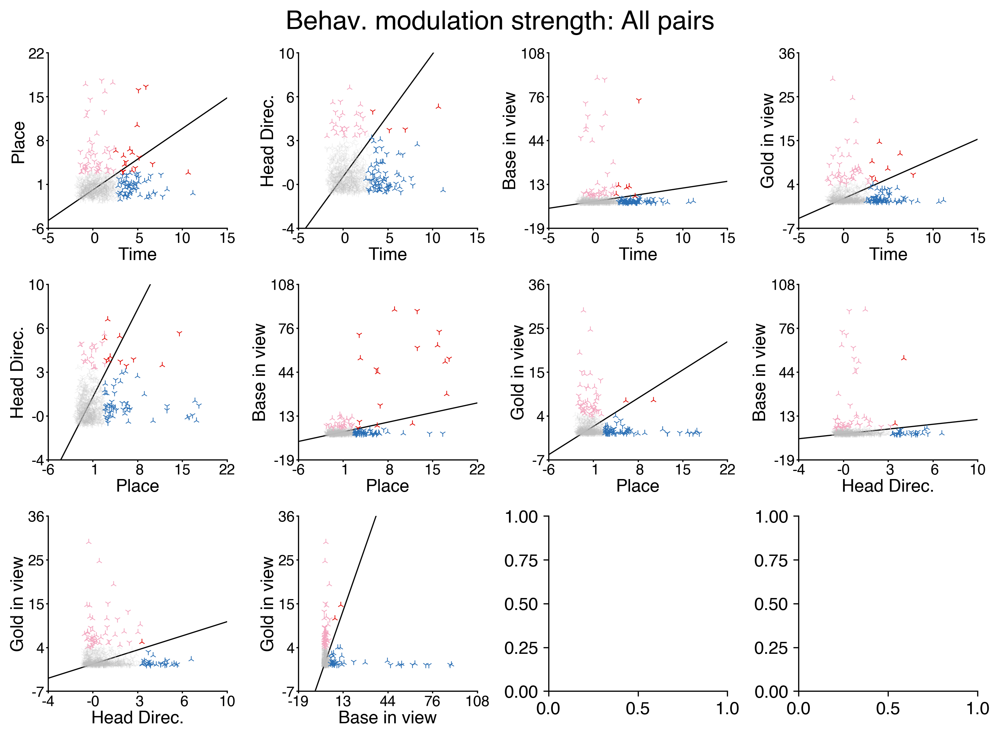

In [20]:
figsize = (9.6, 6.75)
font = {'tick': 6, 'label': 7, 'annot': 6}
spine_lw = 0.8
marker_size = 20
marker_lw = 0.5

# Plot Z-scored likelihood ratios for behavioral variable pairs.
plt.close()
fig, ax = plt.subplots(3, 4, figsize=figsize, dpi=300)
ax = np.ravel(ax)

font = {'tick': 10, 'label': 12, 'annot': 12, 'fig': 16}
fancy_labels = {'time': 'Time',
                'place': 'Place',
                'head_direc': 'Head Direc.',
                'base_in_view': 'Base in view',
                'gold_in_view': 'Gold in view'}
iax = 0
vmin = -3
vmax = 20
#for game_state in ['Encoding', 'Retrieval']:
for tv1, tv2 in testvar_pairs:
    if tv1 == tv2:
        continue
    qry1 = "(gameState1=='Encoding') & (gameState2=='Encoding') & (testvar1=='{}') & (testvar2=='{}')".format(tv1, tv2)
    qry2 = "(gameState1=='Retrieval') & (gameState2=='Retrieval') & (testvar1=='{}') & (testvar2=='{}')".format(tv1, tv2)
    _df = pd.concat((param_strength.query(qry1), param_strength.query(qry2)))
    jaccard = jaccard_score(_df['sig1'], _df['sig2'])
    jaccard, jaccard_z, pval = jaccard_permtest(_df['sig1'].copy().values, 
                                                _df['sig2'].copy().values,
                                                n_perm=n_perm)
    print(tv1, tv2, jaccard, jaccard_z, pval)
    _cmap = {_i: cmap[_i] for _i in _df['sig_state'].unique() if (_i!=0)}
    _min = np.floor(np.min(_df.dropna()['zlr1'].to_numpy())).astype(int)
    _max = np.ceil(np.max(_df.dropna()['zlr1'].to_numpy())).astype(int)
    xmin = _min - (0.2 * (_max - _min))
    xmax = _max + (0.2 * (_max - _min))
    _min = np.floor(np.min(_df.dropna()['zlr2'].to_numpy())).astype(int)
    _max = np.ceil(np.max(_df.dropna()['zlr2'].to_numpy())).astype(int)
    ymin = _min - (0.2 * (_max - _min))
    ymax = _max + (0.2 * (_max - _min))
    vmin = np.max((xmin, ymin))
    vmax = np.min((xmax, ymax))
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=1.5, width=spine_lw)
    ax[iax].plot(np.linspace(vmin, vmax), np.linspace(vmin, vmax), color='k', lw=spine_lw, zorder=0)
    ax[iax] = sns.scatterplot('zlr1', 'zlr2', hue='sig_state', style='gameState1',
                              data=_df.query("(sig_state==0)"), ax=ax[iax],
                              markers=['2', '1'], 
                              alpha=0.2, 
                              s=marker_size, 
                              linewidth=marker_lw,
                              palette=[cmap[0]], 
                              edgecolor='face',
                              legend=False)
    ax[iax] = sns.scatterplot('zlr1', 'zlr2', hue='sig_state', style='gameState1',
                              data=_df.query("(sig_state!=0)"), ax=ax[iax],
                              markers=['2', '1'], 
                              alpha=1, 
                              s=marker_size, 
                              linewidth=marker_lw, 
                              palette=_cmap, 
                              edgecolor='face',
                              legend=False)
    xticks = np.linspace(xmin, xmax, 5)
    yticks = np.linspace(ymin, ymax, 5)
    ax[iax].set_xlim([xmin, xmax])
    ax[iax].set_xticks(xticks)
    ax[iax].set_xticklabels(['{:>2.0f}'.format(x) for x in xticks])
    ax[iax].set_ylim([ymin, ymax])
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(['{:>2.0f}'.format(x) for x in yticks])
    ax[iax].set_xlabel(fancy_labels[tv1], fontsize=font['label'], labelpad=1)
    ax[iax].set_ylabel(fancy_labels[tv2], fontsize=font['label'], labelpad=1)
    iax += 1
    
fig.suptitle('Behav. modulation strength: All pairs', fontsize=font['fig'] + 2, y=1.03)
fig.set_facecolor('w')
fig.tight_layout(w_pad=1, h_pad=1)
fig.show()

time time 0.1935483870967742 4.792129398011232 0.000999000999000999
place place 0.34782608695652173 10.549977206852876 0.000999000999000999
head_direc head_direc 0.07407407407407407 1.883106511186811 0.11588411588411589
base_in_view base_in_view 0.3548387096774194 11.791585487973764 0.000999000999000999
gold_in_view gold_in_view 0.07142857142857142 1.7645467946913296 0.11488511488511488
time place 0.07142857142857142 0.429421300854324 0.4065934065934066
time head_direc 0.05660377358490566 1.1540152873393255 0.2037962037962038
time base_in_view 0.0 -1.6433775195519094 1.0
time gold_in_view 0.03773584905660377 0.3936989295906274 0.4905094905094905
place head_direc 0.10256410256410256 2.851662880669499 0.023976023976023976
place base_in_view 0.1951219512195122 5.373311308862419 0.000999000999000999
place gold_in_view 0.0 -1.062364630684114 1.0
head_direc base_in_view 0.029411764705882353 0.09602897113393696 0.6133866133866134
head_direc gold_in_view 0.0 -0.7790859217129046 1.0
base_in_vie

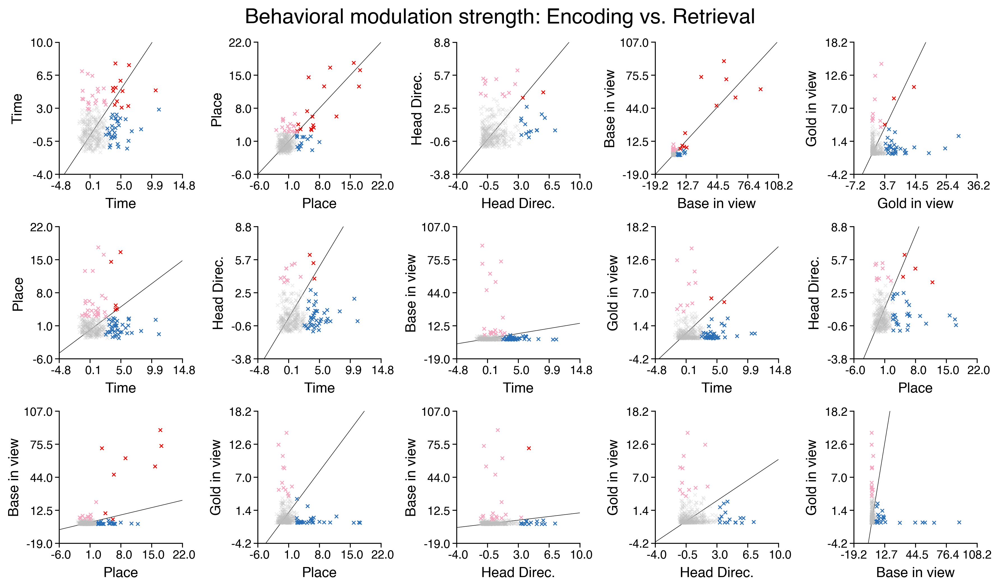

In [21]:
# Plot Z-scored likelihood ratios for behavioral variable pairs.
plt.close()
fig, ax = plt.subplots(3, 5, figsize=(12, 6.75), dpi=300)
ax = np.ravel(ax)

font = {'tick': 10, 'label': 12, 'annot': 12, 'fig': 16}
fancy_labels = {'time': 'Time',
                'place': 'Place',
                'head_direc': 'Head Direc.',
                'base_in_view': 'Base in view',
                'gold_in_view': 'Gold in view'}
iax = 0
vmin = -3
vmax = 20
for tv1, tv2 in testvar_pairs:
    qry = "(gameState1=='{}') & (gameState2=='{}') & (testvar1=='{}') & (testvar2=='{}')".format('Encoding', 'Retrieval', tv1, tv2)
    _df = param_strength.query(qry)
    jaccard = jaccard_score(_df['sig1'], _df['sig2'])
    jaccard, jaccard_z, pval = jaccard_permtest(_df['sig1'].copy().values, 
                                                _df['sig2'].copy().values,
                                                n_perm=n_perm)
    print(tv1, tv2, jaccard, jaccard_z, pval)
    _cmap = {_i: cmap[_i] for _i in _df['sig_state'].unique() if (_i!=0)}
    _min = np.floor(np.min(_df.dropna()['zlr1'].to_numpy())).astype(int)
    _max = np.ceil(np.max(_df.dropna()['zlr1'].to_numpy())).astype(int)
    xmin = _min - (0.2 * (_max - _min))
    xmax = _max + (0.2 * (_max - _min))
    _min = np.floor(np.min(_df.dropna()['zlr2'].to_numpy())).astype(int)
    _max = np.ceil(np.max(_df.dropna()['zlr2'].to_numpy())).astype(int)
    ymin = _min - (0.2 * (_max - _min))
    ymax = _max + (0.2 * (_max - _min))
    vmin = np.max((xmin, ymin))
    vmax = np.min((xmax, ymax))
    rho, pval = stats.spearmanr(_df.query("(sig_state!=0)")['zlr1'], _df.query("(sig_state!=0)")['zlr2'])
    ax[iax].plot(np.linspace(vmin, vmax), np.linspace(vmin, vmax), color='k', lw=0.4, zorder=0)
    ax[iax] = sns.scatterplot('zlr1', 'zlr2', hue='sig_state', alpha=0.25, lw=0.4, marker='x',
                              palette=[cmap[0]], legend=False, 
                              data=_df.query("(sig_state==0)"), ax=ax[iax])
    ax[iax] = sns.scatterplot('zlr1', 'zlr2', hue='sig_state', alpha=1, lw=0.8, marker='x',
                              edgecolor='k', palette=_cmap, legend=False, 
                              data=_df.query("(sig_state!=0)").sort_values('sig_state'), ax=ax[iax])
    ax[iax].set_xlim([xmin, xmax])
    ax[iax].set_ylim([ymin, ymax])
    ax[iax].tick_params(labelsize=font['tick'], pad=2)
    xticks = np.linspace(xmin, xmax, 5)
    yticks = np.linspace(ymin, ymax, 5)
    ax[iax].set_xticks(xticks)
    ax[iax].set_xticklabels(['{:>5.1f}'.format(x) for x in xticks])
    ax[iax].set_yticks(yticks)
    ax[iax].set_yticklabels(['{:>5.1f}'.format(x) for x in yticks])
    ax[iax].set_xlabel(fancy_labels[tv1], fontsize=font['label'], labelpad=5)
    ax[iax].set_ylabel(fancy_labels[tv2], fontsize=font['label'], labelpad=2)
#     ax[iax].annotate(r'$\rho = {:.2f}$'.format(rho), (0.1, 0.9), xycoords='axes fraction',
#                      color='k', fontsize=font['tick']-2)
    iax += 1
    
fig.suptitle('Behavioral modulation strength: Encoding vs. Retrieval', fontsize=font['fig'] + 2, y=1.03)
fig.set_facecolor('w')
fig.tight_layout(w_pad=1, h_pad=1)
fig.show()

# Mean firing over time, all navigation time cells

In [5]:
ols_pairs.columns

Index(['subj', 'subj_sess', 'subj_sess_unit', 'neuron', 'hem', 'roi',
       'roi_gen2', 'roi_gen3', 'roi_gen4', 'roi_gen5', 'gameState', 'testvar',
       'full', 'llf_full', 'lr', 'z_lr', 'emp_pval', 'spike_mat', 'mean_frs',
       'sem_frs', 'fr_mean', 'fr_max', 'fr_max_ind', 'fr_max_ind4',
       'fr_max_ind5', 'fr_max_ind10', 'sparsity', 'sig', 'sig_holm',
       'beta_argmin', 'beta_min', 'beta_argmax', 'beta_max', 'beta_abs_argmax',
       'beta_abs_max'],
      dtype='object')

In [23]:
def _combine_time_bins(spike_mat, bins=10):
    """Return sum of spikes across trials within each time bin."""
    spike_mat = np.array(spike_mat)
    if len(spike_mat.shape) == 2:
        return np.array([v.sum() for v in np.split(np.sum(spike_mat, axis=0), bins)])
    else:
        return None

In [26]:
ols_pairs.columns

Index(['subj', 'subj_sess', 'subj_sess_unit', 'neuron', 'hem', 'roi',
       'roi_gen2', 'roi_gen3', 'roi_gen4', 'roi_gen5', 'gameState', 'testvar',
       'full', 'llf_full', 'lr', 'z_lr', 'emp_pval', 'spike_mat', 'mean_frs',
       'sem_frs', 'fr_mean', 'fr_max', 'fr_max_ind', 'fr_max_ind4',
       'fr_max_ind5', 'fr_max_ind10', 'sparsity', 'sig', 'sig_holm',
       'beta_argmin', 'beta_min', 'beta_argmax', 'beta_max', 'beta_abs_argmax',
       'beta_abs_max', 'sig_pos'],
      dtype='object')

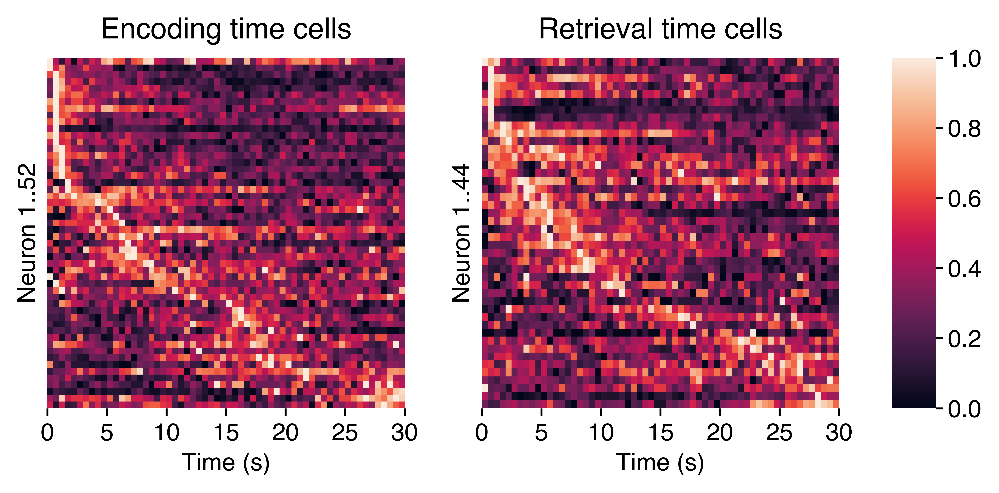

In [28]:
savefig = 1
overwrite = 1
grid_shp = (15, 37)
figsize = (colws['1'], colws['1']*(grid_shp[0]/grid_shp[1]))
dpi = 1200

# Plot the mean timecourse for all Encoding and Retrieval neurons.
spikes_by_time = od([('Encoding', []), ('Retrieval', [])])
for game_state in ['Encoding', 'Retrieval']:
    mean_spikes = []
    qry = "(sig==True) & (beta_abs_max>0) & (testvar=='time') & (gameState=='{}')".format(game_state)
    for idx, row in ols_pairs.query(qry).sort_values(['beta_abs_argmax', 'fr_max_ind', 'sparsity']).iterrows():
        subj_sess = row['subj_sess']
        chan, unit = row['neuron'].split('-')
        spikes_by_time[game_state].append(_combine_time_bins(row['spike_mat'], 60)) # time_bin; mean over trials
    spikes_by_time[game_state] = np.array(spikes_by_time[game_state]) # neuron x time_bin

plt.close()
fig = plt.figure(figsize=figsize, dpi=dpi)
ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=grid_shp[0], colspan=15),
      plt.subplot2grid(grid_shp, (0, 18), rowspan=grid_shp[0], colspan=15),
      plt.subplot2grid(grid_shp, (0, 35), rowspan=grid_shp[0], colspan=2)]
ax = np.ravel(ax)

font = {'tick': 10, 'label': 10, 'annot': 10, 'fig': 12}

ax_labels = {'Encoding': 'Encoding',
             'Retrieval': 'Retrieval'}
ax_titles = {'Encoding': 'Encoding time cells',
             'Retrieval': 'Retrieval time cells'}

game_states = ['Encoding', 'Retrieval']
n_neurons = []
for i, game_state in enumerate(game_states):
    # Concat firing rates across trial phases, for each neuron.
    ii = i
    
    #xsort = np.argsort(np.argmax(spikes_by_time[game_state], axis=1))
    fr_mat = minmax_scale(spikes_by_time[game_state], axis=1)#[xsort, :]
    n_neurons.append(fr_mat.shape[0])
    
    # Plot the firing rate heatmap.
    xticks = np.arange(0, fr_mat.shape[1]+1, 10)
    xticklabels = np.arange(0, (fr_mat.shape[1]+1)/2, 5, dtype=np.int)
    vmin = 0
    vmax = 1
    add_cbar = False
    if ii == len(ax) - 2:
        add_cbar = True
    ax[ii] = sns.heatmap(fr_mat, ax=ax[ii], vmin=vmin, vmax=vmax, cmap='rocket',
                         square=False, cbar=add_cbar, cbar_ax=ax[ii+1])
    ax[i].tick_params(axis='x', which='both', length=3, pad=3)
    ax[ii].tick_params(axis='y', which='both', length=0, pad=3)
    ax[ii].set_xticks(xticks)
    ax[ii].set_xticklabels(xticklabels, 
                           fontsize=font['tick'], rotation=0)
    ax[ii].set_xlabel('Time (s)', fontsize=font['label'], labelpad=3)
    ax[ii].set_yticks([])
    ax[ii].set_ylabel('Neuron 1..{}'.format(n_neurons[-1]), fontsize=font['label'], labelpad=3)
    ax[ii].set_title(ax_titles[game_state], pad=8, fontsize=font['fig'])
    
    if add_cbar:
        cbar = ax[ii].collections[0].colorbar
        cbar.ax.tick_params(labelsize=font['tick'], length=3, pad=2)
        cbar.set_ticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
        cbar.set_ticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
        #cbar.set_label('Norm. firing rate', fontsize=font['label'], labelpad=2)

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation',
                       'navigation_time_cells-{}encoding-{}retrieval-{}units.pdf'
                       .format(spikes_by_time['Encoding'].shape[0], spikes_by_time['Retrieval'].shape[0], ols_pairs['subj_sess_unit'].unique().size))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
    
fig.show()

# Single-neuron time and place plots

In [705]:
reload(time_cell_plots)

<module 'time_cells.time_cell_plots' from '/home1/dscho/code/projects/time_cells/time_cell_plots.py'>

In [786]:
# Load the data.
subj_sess = subj_sess_unit.split('-')[0]
neuron = '-'.join(subj_sess_unit.split('-')[1:])
event_spikes = time_bin_analysis.load_event_spikes(subj_sess, verbose=False)
spike_mat = {game_state: event_spikes.get_spike_mat(neuron, game_state).values * 2
             for game_state in game_states} # trial x time_bin

In [1173]:
subj_sess_unit = 'U527_ses0-58-2'

filename = op.join(proj_dir, 'analysis', 'time_fields',
                   '{}-Encoding_Retrieval-smooth3-1000perm-zthresh1.96-max_skips1-time_fields.pkl'.format(subj_sess_unit))
output = dio.open_pickle(filename)
time_fields = output['time_fields']
z_frs = output['z_frs']

print('time_fields:', time_fields.shape)

time_fields: (8, 8)


In [1203]:
subj_sess_unit = 'U527_ses0-58-2'
mod_pairs.query("(subj_sess_unit=='{}') & (sig==True)".format(subj_sess_unit))

In [1202]:
time_fields.query("(subj_sess_unit=='{}')".format(subj_sess_unit))

In [1201]:
ols_weights.query("(subj_sess_unit=='{}') & (model=='fullMax')".format(subj_sess_unit))#.sort_values('z_weight', ascending=False)

In [1171]:
testvar = 'gameState:time'

globstr = 'ls'
neurons = []
for subj_sess_unit in np.sort(list(y_scale.keys())):
    if subj_sess_unit in sig_cells[testvar]:
        neurons.append(subj_sess_unit)
        subj_sess = subj_sess_unit.split('-')[0]
        neuron = '-'.join(subj_sess_unit.split('-')[1:])
        globstr += ' {}-CSC{}-unit{}*{}_firing.png'.format(subj_sess, neuron.split('-')[0], neuron.split('-')[1], testvar)
    
print('{}/{} neurons'.format(len(neurons), len(y_scale)))
print(globstr)

12/15 neurons
ls U518_ses0-CSC73-unit1*gameState:time_firing.png U526_ses0-CSC14-unit2*gameState:time_firing.png U527_ses0-CSC44-unit2*gameState:time_firing.png U527_ses0-CSC44-unit4*gameState:time_firing.png U527_ses0-CSC58-unit2*gameState:time_firing.png U527_ses0-CSC9-unit1*gameState:time_firing.png U530_ses1-CSC42-unit1*gameState:time_firing.png U532_ses0-CSC21-unit2*gameState:time_firing.png U532_ses0-CSC24-unit2*gameState:time_firing.png U532_ses0-CSC4-unit1*gameState:time_firing.png U532_ses0-CSC5-unit8*gameState:time_firing.png U540_ses0-CSC26-unit1*gameState:time_firing.png


U527_ses0-44-4, REC


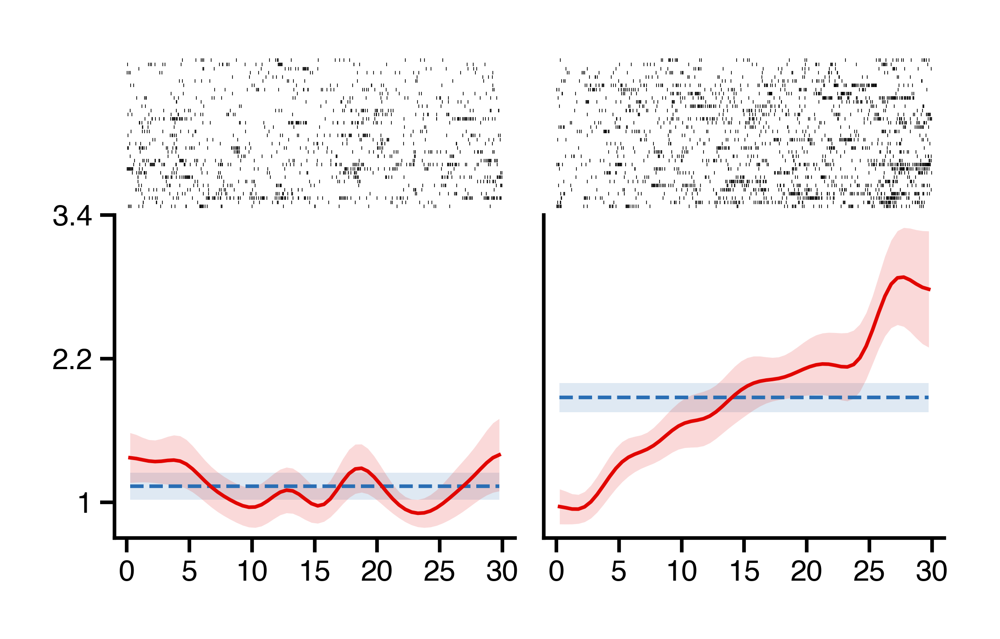

In [1164]:
# gameState      - 'U530_ses1-69-1'
# gameState:time - 'U527_ses0-44-2'
# place          - 'U540_ses0-20-1'
# time:place     - 'U536_ses0-68-1'
subj_sess_unit = ['U518_ses0-73-1', 'U532_ses0-5-8', 'U532_ses0-24-2', 'U532_ses0-21-2', 'U526_ses0-14-2',
                  'U540_ses0-26-1', 'U532_ses0-4-1', 'U530_ses1-42-1', 'U527_ses0-9-1', 'U527_ses0-44-4']
testvar = 'gameState:time'
savefig = 1
overwrite = 1
game_states = ['Encoding', 'Retrieval']
y_scale = {'U530_ses1-69-1': {'ymin': 5.5, 'ymax': 8.7, 'yticks': [5.5, 7, 8.5]},
           'U527_ses0-44-2': {'ymin': 0.8, 'ymax': 2.2, 'yticks': [0.8, 1.5, 2.2]},
           'U540_ses0-20-1': {'ymin': 1.5, 'ymax': 6.5, 'yticks': [2, 4, 6]},
           'U536_ses0-68-1': {'ymin': 2,   'ymax': 10,  'yticks': [2, 6, 10]},
           'U527_ses0-58-2': {'ymin': 0,   'ymax': 3.5, 'yticks': [0, 1.5, 3]},
           'U518_ses0-73-1': {'ymin': 3,   'ymax': 7,   'yticks': [3, 5, 7]},
           'U532_ses0-5-8':  {'ymin': 0.3, 'ymax': 2.7, 'yticks': [0.5, 1.5, 2.5]},
           'U532_ses0-24-2': {'ymin': 1,   'ymax': 4,   'yticks': [1, 2.5, 4]},
           'U532_ses0-21-2': {'ymin': 0,   'ymax': 1.7, 'yticks': [0, 0.8, 1.6]},
           'U526_ses0-14-2': {'ymin': 0,   'ymax': 1.4, 'yticks': [0, 0.7, 1.4]},
           'U540_ses0-26-1': {'ymin': 1.5, 'ymax': 4.5, 'yticks': [1.5, 3, 4.5]},
           'U532_ses0-4-1':  {'ymin': 2,   'ymax': 5,   'yticks': [2, 3.5, 5]},
           'U530_ses1-42-1': {'ymin': 32,  'ymax': 40,  'yticks': [32, 36, 40]},
           'U527_ses0-9-1':  {'ymin': 2,   'ymax': 9,   'yticks': [2, 5.5, 9]},
           'U527_ses0-44-4': {'ymin': 0.7, 'ymax': 3.4, 'yticks': [1, 2.2, 3.4]}}
grid_shp = (72, 120)
figsize = (colws[1], colws[1] * (grid_shp[0]/grid_shp[1]))
dpi = 1200
font = {'tick': 4, 'label': 6, 'fig': 7}
rastersize = 0.5
rasterwidth = 0.1
xtick_inc = 5
plot_grand_mean = True
lw = 0.5
smooth = 3
# ----------------------------------

if subj_sess_unit is None:
    neurons = sig_cells[testvar]
elif isinstance(subj_sess_unit, str):
    neurons = [subj_sess_unit]
else:
    neurons = subj_sess_unit

for subj_sess_unit in neurons:
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])

    plt.close()
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=24, colspan=58),
          plt.subplot2grid(grid_shp, (0, 62), rowspan=24, colspan=58),
          plt.subplot2grid(grid_shp, (24, 0), rowspan=48, colspan=58),
          plt.subplot2grid(grid_shp, (24, 62), rowspan=48, colspan=58)]

    iax = 0
    ax[iax] = time_cell_plots.time_raster(subj_sess,
                                          neuron, 
                                          game_states[0],
                                          ax=ax[iax],
                                          plot_game_states=False,
                                          plot_labels=False,
                                          plot_title=False,
                                          font=font,
                                          rastersize=rastersize,
                                          rasterwidth=rasterwidth,
                                          ax_linewidth=0)
    ax[iax].set_xticks([])
    ax[iax].set_yticks([])

    iax = 1
    ax[iax] = time_cell_plots.time_raster(subj_sess,
                                          neuron, 
                                          game_states[1],
                                          ax=ax[iax],
                                          plot_game_states=False,
                                          plot_labels=False,
                                          plot_title=False,
                                          font=font,
                                          rastersize=rastersize,
                                          rasterwidth=rasterwidth,
                                          ax_linewidth=0)
    ax[iax].set_xticks([])
    ax[iax].set_yticks([])

    iax = 2
    kws = y_scale[subj_sess_unit] if (subj_sess_unit in y_scale) else {}
    ax[iax] = time_cell_plots.firing_rate_over_time(subj_sess,
                                                    neuron, 
                                                    game_states[0],
                                                    ax=ax[iax],
                                                    overlap=False,
                                                    smooth=smooth,
                                                    plot_grand_mean=plot_grand_mean,
                                                    plot_game_states=False,
                                                    plot_labels=False,
                                                    plot_title=False,
                                                    linewidth=lw,
                                                    xtick_inc=xtick_inc,
                                                    font=font,
                                                    **kws)

    iax = 3
    ax[iax] = time_cell_plots.firing_rate_over_time(subj_sess,
                                                    neuron, 
                                                    game_states[1],
                                                    ax=ax[iax],
                                                    overlap=False,
                                                    smooth=smooth,
                                                    plot_grand_mean=plot_grand_mean,
                                                    plot_game_states=False,
                                                    plot_labels=False,
                                                    plot_title=False,
                                                    linewidth=lw,
                                                    xtick_inc=xtick_inc,
                                                    font=font,
                                                    **kws)
    if 'yticks' in kws:
        ax[iax].set_yticks([])

    chan, unit = neuron.split('-')
    hemroi = spike_preproc.roi_lookup(subj_sess, chan)
    if savefig:    
        filename = op.join(proj_dir, 'figs', 'plot_navigation2', 'all',
                           '{}-CSC{}-unit{}-{}-{}-smooth{}-{}_firing.png'.format(subj_sess, chan, unit, hemroi, '_'.join(game_states), smooth, testvar))
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        filename = filename.replace('.png', '.pdf')
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        
print('{}-{}, {}'.format(subj_sess, neuron, hemroi, '_'.join(game_states)))
fig.show()

U532_ses0-60-1, Encoding_Retrieval


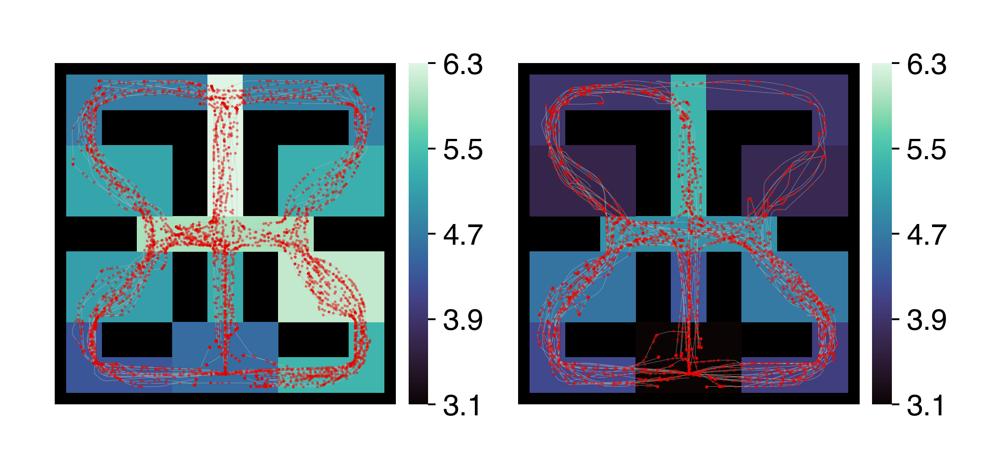

In [1200]:
# Plot a neuron's firing rate by maze location.
subj_sess_unit = ['U532_ses0-24-2', 'U532_ses0-8-2', 'U536_ses0-35-1', 'U536_ses0-28-2', 'U518_ses0-38-2',
                  'U532_ses0-14-1', 'U532_ses0-60-1']
savefig = 0
overwrite = 1
plot_bw = 0
game_states = ['Encoding', 'Retrieval']
dpi = 1200
font = {'tick': 4, 'label': 6, 'fig': 7}
base_color = 'w'
show_spikes = True
only_show_spikes_when_moving = False
# ----------------------------------

if subj_sess_unit is None:
    neurons = sig_cells['place']
elif isinstance(subj_sess_unit, str):
    neurons = [subj_sess_unit]
else:
    neurons = subj_sess_unit
    
if plot_bw:
    fr_cmap = 'binary_r'
    base_lw = 0.2
    nav_color = '#296eb4'
    nav_alpha = 0.5
    nav_lw = 0.075
    spike_fill_color = '#e10600'
    spike_edge_color = 'k'
    spike_alpha = 0.5
    spike_markersize = 0.5
    spike_mew = 0
    background_color = 'k'
else:
    fr_cmap = 'mako' # 'rocket'
    base_lw = 0
    nav_color = '#bebebe' # '#3d79b6'
    nav_alpha = 0.5
    nav_lw = 0.075
    spike_fill_color = '#e10600' # '#7ccaa5'
    spike_edge_color = 'k'
    spike_alpha = 0.5
    spike_markersize = 0.75 # 0.55
    spike_mew = 0 # 0.025
    background_color = 'k'

for subj_sess_unit in neurons:
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])
    fig, ax = time_cell_plots.plot_firing_maze2(subj_sess,
                                                neuron,
                                                font=font,
                                                base_color=base_color,
                                                base_lw=base_lw,
                                                fr_cmap=fr_cmap,
                                                show_spikes=show_spikes,
                                                only_show_spikes_when_moving=only_show_spikes_when_moving,
                                                nav_lw=nav_lw,
                                                nav_color=nav_color,
                                                nav_alpha=nav_alpha,
                                                spike_marker='.',
                                                spike_fill_color=spike_fill_color,
                                                spike_edge_color=spike_edge_color,
                                                spike_alpha=spike_alpha,
                                                spike_markersize=spike_markersize,
                                                spike_mew=spike_mew,
                                                wall_cmap=sns.color_palette("light:{}".format(background_color), as_cmap=True),
                                                background_color=background_color,
#                                                 vmin=2.5,
#                                                 vmax=1,
                                                dpi=dpi)

    if savefig:
        chan, unit = neuron.split('-')
        hemroi = spike_preproc.roi_lookup(subj_sess, chan)
        filename = op.join(proj_dir, 'figs', 'plot_navigation2', 'all', 
                           '{}-CSC{}-unit{}-{}-{}-{}-place_firing.png'.format(subj_sess, chan, unit, hemroi, '_'.join(game_states), fr_cmap))
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        filename = filename.replace('.png', '.pdf')
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)

print('{}-{}, {}'.format(subj_sess, neuron, '_'.join(game_states)))
fig.show()

U540_ses0-39-1, Encoding_Retrieval
U540_ses0: 53/120 (44.2%) time_step x maze_region locations have >= 3 traversals in both Encoding and Retrieval


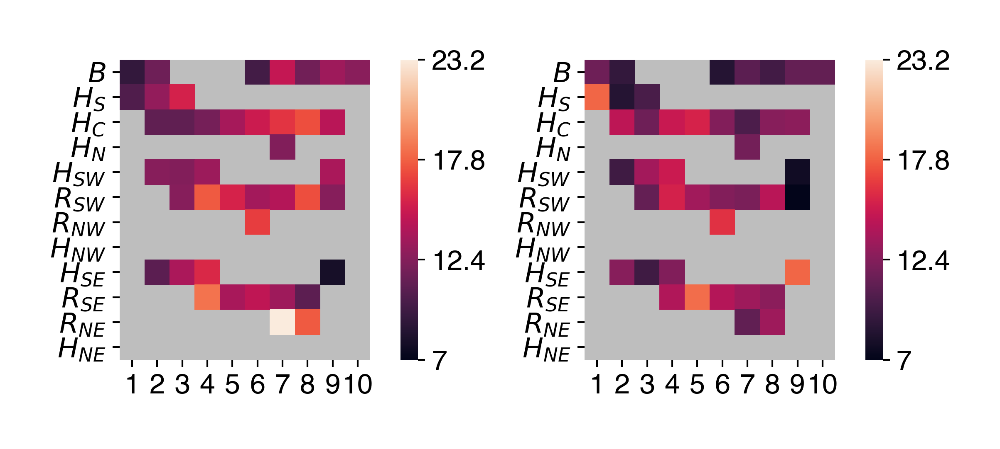

In [1108]:
subj_sess_unit = None #'U540_ses0-39-1'
savefig = 0
overwrite = 1
game_states = ['Encoding', 'Retrieval']
scale_by=10
proj_dir='/home1/dscho/projects/time_cells'


# ----------------------------------

if subj_sess_unit is None:
    neurons = sig_cells['time:place']
elif isinstance(subj_sess_unit, str):
    neurons = [subj_sess_unit]
else:
    neurons = subj_sess_unit
    
for subj_sess_unit in neurons:
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])

    kws = {}
    colws = kws.pop('colws', {1: 2.05, 2: 3.125, 3: 6.45})
    figsize = (colws[2], colws[2] * 0.3)
    dpi = kws.pop('dpi', 1200)
    grid_shp = (100, 128)
    figsize = (colws[1], colws[1] * (grid_shp[0]/grid_shp[1]))
    dpi = kws.pop('dpi', 1200)
    min_traversals = kws.pop('min_traversals', 3)
    game_states = ['Encoding', 'Retrieval']
    font = {'tick': 4, 'label': 6, 'fig': 7}
    ticklength = kws.pop('ticklength', 1)
    tickwidth = kws.pop('tickwidth', 0.25)
    tickpad = kws.pop('tickpad', 1)
    labelpad = kws.pop('labelpad', 1.5)
    cbar_label = kws.pop('cbar_label', None)
    fr_cmap = kws.pop('fr_cmap', 'rocket')

    # Load player position and spiking data.
    events = events_proc.load_events(subj_sess, proj_dir=proj_dir, verbose=False)
    events.maze.maze.loc[:, 'region_precise'] = events.maze.maze['region_precise'].apply(lambda x: x.replace(' ', '_'))
    _origin = events.maze.origin * scale_by
    event_spikes = time_bin_analysis.load_event_spikes(subj_sess, proj_dir=proj_dir, verbose=False)

    # Create category order for maze_region.
    maze_regions = ['Base',    'S_Passage', 'C_Hall',  'N_Passage',
                    'SW_Hall', 'SW_Room',   'NW_Room', 'NW_Hall', 
                    'SE_Hall', 'SE_Room',   'NE_Room', 'NE_Hall']
    event_spikes.event_spikes['maze_region'] = event_spikes.event_spikes['maze_region'].astype(pd.CategoricalDtype(maze_regions, ordered=True))
    
    timepos = od([])
    for game_state in game_states:
        # How much time (sec) did subject occupy each time_step x maze_region location?
        keep = ['trial', 'gameState', 'time_step', 'maze_region', neuron]
        time_timepos = (event_spikes.event_spikes[keep].query("(gameState=='{}')".format(game_state))
                                                       .groupby(['time_step', 'maze_region'])[neuron].size() * 0.5)

        # How many times did subject traverse each time_step x maze_region location?
        trav_timepos = (event_spikes.event_spikes[keep].drop_duplicates([col for col in keep if (col != neuron)])
                                                       .query("(gameState=='{}')".format(game_state))
                                                       .groupby(['time_step', 'maze_region'])[neuron].size())

        # How much did neuron fire in each time_step x maze_region location?    
        fr_timepos = (event_spikes.event_spikes.query("(gameState=='{}')".format(game_state))
                                               .groupby(['time_step', 'maze_region'])[neuron].mean() * 2)

        timepos[game_state] = pd.concat((time_timepos, trav_timepos, fr_timepos), axis=1).reset_index()
        timepos[game_state].columns = ['time_step', 'maze_region', 'duration', 'traversals', neuron]

    time_steps = event_spikes.event_spikes.query("(gameState=={})".format(game_states))['time_step'].unique()
    maze_region_abvs = np.array(['$B$', '$H_{S}$', '$H_{C}$', '$H_{N}$',
                                 '$H_{SW}$', '$R_{SW}$', '$R_{NW}$', '$H_{NW}$',
                                 '$H_{SE}$', '$R_{SE}$', '$R_{NE}$', '$H_{NE}$'])

    # ----------------------------------------------------

    # Make the plot.
    plt.close()
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=50, colspan=50),
          plt.subplot2grid(grid_shp, (0, 50), rowspan=50, colspan=3),
          plt.subplot2grid(grid_shp, (0, 75), rowspan=50, colspan=50),
          plt.subplot2grid(grid_shp, (0, 125), rowspan=50, colspan=3)]
    ax = np.ravel(ax)
    
    cmat = {game_state: pd.pivot(timepos[game_state], index='maze_region', columns='time_step', values=neuron)
            for game_state in game_states}
    mask = np.min((pd.pivot(timepos[game_states[0]], index='maze_region', columns='time_step', values='traversals'),
                   pd.pivot(timepos[game_states[1]], index='maze_region', columns='time_step', values='traversals')), axis=0) < min_traversals
    kws['vmin'] = kws.get('vmin', np.max((0, np.min([cmat[game_state].values[np.where(np.invert(mask))].min() for game_state in game_states]))))
    kws['vmax'] = kws.get('vmax', np.max(np.max([cmat[game_state].values[np.where(np.invert(mask))].max() for game_state in game_states])))
    for _i, game_state in enumerate(game_states):
        iax = 2 * _i

        ax[iax] = sns.heatmap(cmat[game_state], ax=ax[iax], square=True, 
                              cbar=True, cbar_ax=ax[iax+1], cmap=fr_cmap,
                              mask=mask, **kws)

        # Configure the colorbar.
        cbar = ax[iax].collections[0].colorbar
        cbar.ax.tick_params(labelsize=font['tick'], length=ticklength, width=tickwidth, pad=tickpad)
        cbar_ticks = np.linspace(kws['vmin'], kws['vmax'], 4)
        cbar.set_ticks(cbar_ticks)
        cbar.set_ticklabels(['{:g}'.format(x) for x in np.round(cbar_ticks, 1)])
        if cbar_label is not None:
            cbar.set_label(cbar_label, fontsize=font['label'], labelpad=labelpad)

        # Tweak other plot params.
        ax[iax].set_facecolor('#bebebe')
        ax[iax].tick_params(labelsize=font['tick'], length=ticklength, width=tickwidth, pad=tickpad)
        ax[iax].set_xticks(np.arange(time_steps.size) + 0.5)
        ax[iax].set_xticklabels(time_steps)
        ax[iax].set_yticks(np.arange(maze_region_abvs.size) + 0.5)
        ax[iax].set_yticklabels(maze_region_abvs)
        ax[iax].set_xlabel('')
        ax[iax].set_ylabel('')

    if savefig:
        chan, unit = neuron.split('-')
        hemroi = spike_preproc.roi_lookup(subj_sess, chan)
        filename = op.join(proj_dir, 'figs', 'plot_navigation2', 'all',
                           '{}-CSC{}-unit{}-{}-{}-{}min_trav-time:place_firing.png'.format(subj_sess, chan, unit, hemroi, '_'.join(game_states), min_traversals))
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        filename = filename.replace('.png', '.pdf')
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        
print('{}-{}, {}'.format(subj_sess, neuron, '_'.join(game_states)))
print('{}: {} {}'.format(subj_sess,
                         count_pct(timepos[game_state]['traversals']>=min_traversals),
                         'time_step x maze_region locations have >= {} traversals in both Encoding and Retrieval'.format(min_traversals)))
fig.show()

U526_ses0-44-1, Encoding_Retrieval
U526_ses0: 61/120 (50.8%) time_step x maze_region locations have at least 5 traversals


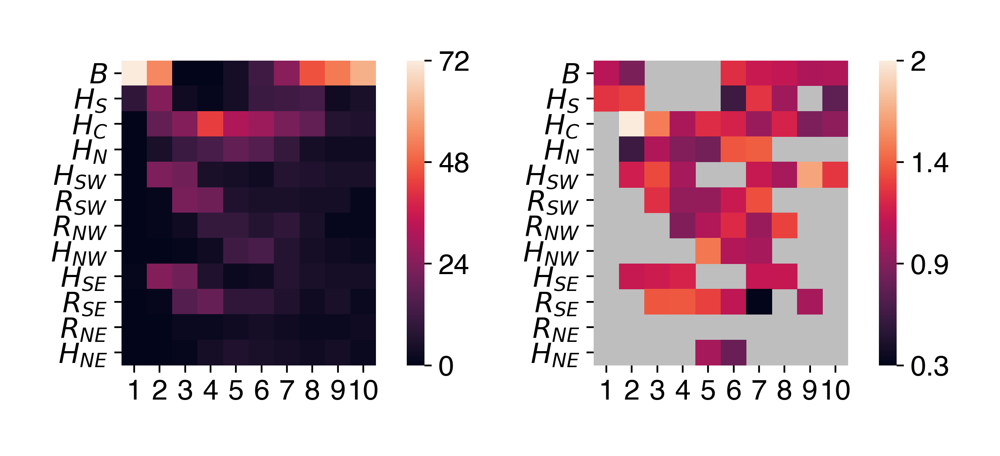

In [151]:
subj_sess_unit = 'U526_ses0-44-1'
savefig = 0
overwrite = 1
game_states = ['Encoding', 'Retrieval']
scale_by=10
proj_dir='/home1/dscho/projects/time_cells'
kws = {}
colws = kws.pop('colws', {1: 2.05, 2: 3.125, 3: 6.45})
figsize = (colws[2], colws[2] * 0.3)
dpi = kws.pop('dpi', 1200)
grid_shp = (100, 128)
figsize = (colws[1], colws[1] * (grid_shp[0]/grid_shp[1]))
dpi = kws.pop('dpi', 1200)

min_traversals = kws.pop('min_traversals', 5)
game_states = ['Encoding', 'Retrieval']
font = {'tick': 4, 'label': 6, 'fig': 7}
ticklength = kws.pop('ticklength', 1)
tickwidth = kws.pop('tickwidth', 0.25)
tickpad = kws.pop('tickpad', 1)
labelpad = kws.pop('labelpad', 1.5)
cbar_label = kws.pop('cbar_label', None)
fr_cmap = kws.pop('fr_cmap', 'rocket')
# ----------------------------------

if subj_sess_unit is None:
    neurons = sig_cells['time:place']
elif isinstance(subj_sess_unit, str):
    neurons = [subj_sess_unit]
    
for subj_sess_unit in neurons:
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])

    # Load player position and spiking data.
    events = events_proc.load_events(subj_sess, proj_dir=proj_dir, verbose=False)
    events.maze.maze.loc[:, 'region_precise'] = events.maze.maze['region_precise'].apply(lambda x: x.replace(' ', '_'))
    _origin = events.maze.origin * scale_by
    event_spikes = time_bin_analysis.load_event_spikes(subj_sess, proj_dir=proj_dir, verbose=False)

    # Create category order for maze_region.
    maze_regions = ['Base',    'S_Passage', 'C_Hall',  'N_Passage',
                    'SW_Hall', 'SW_Room',   'NW_Room', 'NW_Hall', 
                    'SE_Hall', 'SE_Room',   'NE_Room', 'NE_Hall']
    event_spikes.event_spikes['maze_region'] = event_spikes.event_spikes['maze_region'].astype(pd.CategoricalDtype(maze_regions, ordered=True))

    # How much time (sec) did subject occupy each time_step x maze_region location?
    keep = ['trial', 'gameState', 'time_step', 'maze_region', neuron]
    time_timepos = (event_spikes.event_spikes[keep].query("(gameState=={})".format(game_states))
                                                   .groupby(['time_step', 'maze_region'])[neuron].size() * 0.5)

    # How many times did subject traverse each time_step x maze_region location?
    trav_timepos = (event_spikes.event_spikes[keep].drop_duplicates([col for col in keep if (col != neuron)])
                                                   .query("(gameState=={})".format(game_states))
                                                   .groupby(['time_step', 'maze_region'])[neuron].size())

    # How much did neuron fire in each time_step x maze_region location?
    fr_timepos = (event_spikes.event_spikes.query("(gameState=={})".format(game_states))
                                           .groupby(['time_step', 'maze_region'])[neuron].mean() * 2)

    timepos = pd.concat((time_timepos, trav_timepos, fr_timepos), axis=1).reset_index()
    timepos.columns = ['time_step', 'maze_region', 'duration', 'traversals', neuron]

    timepos['is_base'] = timepos['maze_region'] == 'Base'

    time_steps = timepos['time_step'].unique()
    maze_region_abvs = np.array(['$B$', '$H_{S}$', '$H_{C}$', '$H_{N}$',
                                 '$H_{SW}$', '$R_{SW}$', '$R_{NW}$', '$H_{NW}$',
                                 '$H_{SE}$', '$R_{SE}$', '$R_{NE}$', '$H_{NE}$'])

    # ----------------------------------------------------

    # Make the plot.
    plt.close()
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=50, colspan=50),
          plt.subplot2grid(grid_shp, (0, 50), rowspan=50, colspan=3),
          plt.subplot2grid(grid_shp, (0, 75), rowspan=50, colspan=50),
          plt.subplot2grid(grid_shp, (0, 125), rowspan=50, colspan=3)]
    ax = np.ravel(ax)
    for _i, col in enumerate(['traversals', neuron]):
        iax = 2 * _i
        
        cmat = pd.pivot(timepos, index='maze_region', columns='time_step', values=col)
        if col == 'traversals':
            cmat[np.isnan(cmat)] = 0
            mask = np.zeros(cmat.shape, dtype=bool)
        else:
            mask = pd.pivot(timepos, index='maze_region', columns='time_step', values='traversals') < min_traversals

        kws['vmin'] = cmat.values[np.where(np.invert(mask))].min()
        kws['vmax'] = cmat.values[np.where(np.invert(mask))].max()

        ax[iax] = sns.heatmap(cmat, ax=ax[iax], square=True, cbar=True, cbar_ax=ax[iax+1], cmap=fr_cmap,
                              mask=mask, **kws)

        # Configure the colorbar.
        cbar = ax[iax].collections[0].colorbar
        cbar.ax.tick_params(labelsize=font['tick'], length=ticklength, width=tickwidth, pad=tickpad)
        cbar_ticks = np.linspace(kws['vmin'], kws['vmax'], 4)
        cbar.set_ticks(cbar_ticks)
        cbar.set_ticklabels(['{:g}'.format(x) for x in np.round(cbar_ticks, 1)])
        if cbar_label is not None:
            cbar.set_label(cbar_label, fontsize=font['label'], labelpad=labelpad)

        # Tweak other plot params.
        ax[iax].set_facecolor('#bebebe')
        ax[iax].tick_params(labelsize=font['tick'], length=ticklength, width=tickwidth, pad=tickpad)
        ax[iax].set_xticks(np.arange(time_steps.size) + 0.5)
        ax[iax].set_xticklabels(time_steps)
        ax[iax].set_yticks(np.arange(maze_region_abvs.size) + 0.5)
        ax[iax].set_yticklabels(maze_region_abvs)
        ax[iax].set_xlabel('')
        ax[iax].set_ylabel('')

    if savefig:
        chan, unit = neuron.split('-')
        hemroi = spike_preproc.roi_lookup(subj_sess, chan)
        filename = op.join(proj_dir, 'figs', 'plot_navigation2', 'all',
                           '{}-CSC{}-unit{}-{}-{}-time:place_firing.png'.format(subj_sess, chan, unit, hemroi, ''.join(game_states)))
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        filename = filename.replace('.png', '.pdf')
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        
    break
    
print('{}-{}, {}'.format(subj_sess, neuron, '_'.join(game_states)))
print('{}: {} {}'.format(subj_sess,
                         count_pct(timepos['traversals']>=min_traversals),
                         'time_step x maze_region locations have at least {} traversals'.format(min_traversals)))
fig.show()

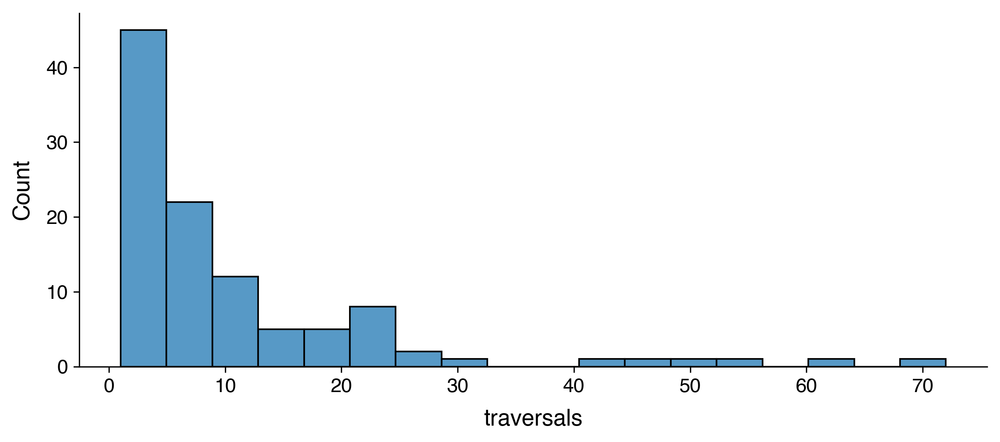

In [320]:
plt.close()
sns.histplot(data=timepos.query("(traversals>0)"), x='traversals')

(0.9520695167334481, 2.5754754304411023e-55)


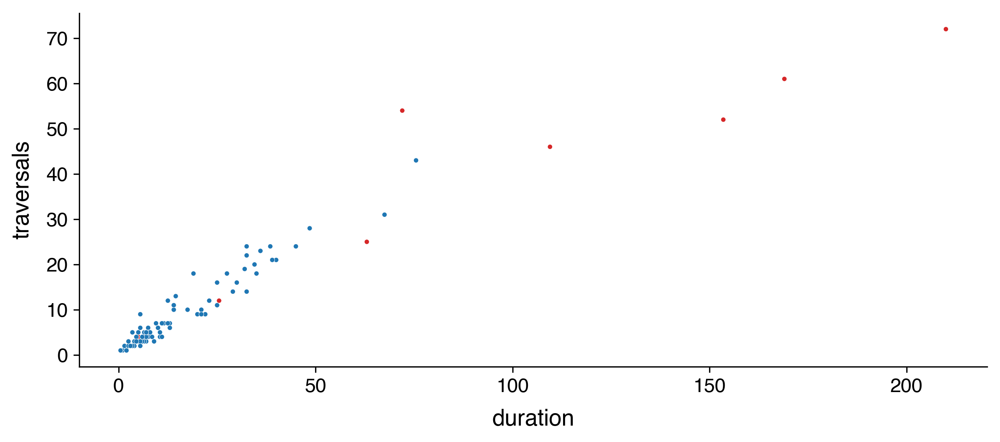

In [313]:
print(stats.pearsonr(timepos.query("(duration>0)")['duration'], timepos.query("(duration>0)")['traversals']))
plt.close()
sns.scatterplot(data=timepos.query("(duration>0)"), x='duration', y='traversals', hue='is_base',
                legend=False)

In [172]:
pd.pivot(fr_timepos.reset_index(), index='maze_region', columns='time_step', values=neuron)

time_step,1,2,3,4,5,6,7,8,9,10
maze_region,,,,,,,,,,
SW_Hall,NaN,1.166667,1.350000,1.000000,1.181818,1.846154,1.130435,1.000000,1.692308,1.285714
SW_Room,NaN,2.000000,1.261538,0.927536,0.933333,1.142857,1.375000,0.444444,0.166667,7.000000
NW_Room,NaN,3.000000,1.285714,0.857143,1.047619,1.230769,0.952381,1.333333,2.000000,4.000000
NW_Hall,NaN,NaN,1.000000,0.500000,1.521739,1.046154,1.000000,2.000000,1.818182,0.857143
N_Passage,NaN,0.571429,1.040000,0.862069,0.800000,1.400000,1.428571,1.142857,1.333333,0.400000
C_Hall,NaN,2.000000,1.538462,1.019868,1.244444,1.195876,0.953846,1.200000,0.842105,0.909091
S_Passage,1.272727,1.324675,1.111111,0.000000,1.000000,0.571429,1.280000,0.965517,0.750000,0.714286
Base,1.071429,0.833333,NaN,NaN,0.400000,1.254902,1.142857,1.114155,1.029316,1.041420
SE_Hall,0.000000,1.133333,1.153846,1.200000,1.600000,0.800000,1.120000,1.125000,1.000000,1.333333


In [187]:
iMax = np.argmax(df['z_weight'])
iMin = np.argmin(df['z_weight'])
df.iloc[iMax]

subj_sess_unit          U518_ses0-13-2
hem                                  R
roi                                 TO
gameState           Encoding-Retrieval
model                             full
factor                      time:place
level             time_8:place_NE_Room
weight                        0.832331
z_weight                       2.75004
Name: 164519, dtype: object

In [188]:
idx

'U518_ses0-13-2'

In [194]:
qry = "(model=='full') & (factor=='time:place') & (subj_sess_unit=={})".format(sig_cells['time:place'])

time_place_max = []
for subj_sess_unit, df in ols_weights.query(qry).groupby('subj_sess_unit'):
    hemroi = df.iloc[0]['hem'] + df.iloc[0]['roi']
    iMax = np.argmax(df['z_weight'])
    iMin = np.argmin(df['z_weight'])
    z_lr = mod_pairs.query("(full=='full') & (testvar=='time:place') & (subj_sess_unit=='{}')"
                           .format(subj_sess_unit)).iloc[0]['z_lr']
    time_place_max.append([subj_sess_unit, hemroi,
                           df.iloc[iMax]['level'], df.iloc[iMax]['z_weight'],
                           df.iloc[iMin]['level'], df.iloc[iMin]['z_weight'],
                           df.iloc[iMax]['z_weight'] - df.iloc[iMin]['z_weight'], z_lr])
cols = ['subj_sess_unit', 'hemroi', 'level_max', 'z_weight_max',
        'level_min', 'z_weight_min', 'z_diff', 'z_lr']
time_place_max = pd.DataFrame(time_place_max, columns=cols)
time_place_max = time_place_max.sort_values('z_diff', ascending=False).reset_index(drop=True)

print('time_place_max: {}'.format(time_place_max.shape))

time_place_max: (43, 8)


In [195]:
time_place_max

,subj_sess_unit,hemroi,level_max,z_weight_max,level_min,z_weight_min,z_diff,z_lr
0,U536_ses0-9-1,LMH,time_10:place_NW_Hall,10.016657,time_2:place_NW_Hall,-9.628824,19.645481,3.182714
1,U526_ses0-44-1,RAH,time_10:place_SW_Room,7.524806,time_1:place_SW_Room,-7.421860,14.946666,3.931749
2,U518_ses1-43-3,LPHG,time_8:place_SW_Hall,8.954647,time_8:place_C_Hall,-4.400643,13.355290,3.647171
3,U518_ses0-4-2,REC,time_2:place_SE_Room,7.052987,time_8:place_SE_Room,-4.997806,12.050793,3.081662
4,U536_ses0-13-1,LMH,time_5:place_SE_Hall,7.739495,time_10:place_SE_Hall,-3.419655,11.159151,2.351041
5,U530_ses0-73-1,LHGa,time_1:place_Base,6.574746,time_1:place_S_Passage,-4.136990,10.711736,3.496513
6,U530_ses1-80-1,LHGa,time_1:place_Base,6.310619,time_2:place_NW_Hall,-3.790640,10.101259,2.197175
7,U539_ses0-14-2,RA,time_10:place_NW_Room,4.851449,time_2:place_NW_Room,-4.585040,9.436489,2.187400
8,U532_ses0-15-1,RA,time_3:place_Base,6.616858,time_4:place_Base,-2.444530,9.061388,2.475453
9,U532_ses0-5-7,RAH,time_10:place_SE_Room,4.248818,time_1:place_SE_Room,-4.605058,8.853876,2.244761


In [226]:
reload(time_cell_plots)

<module 'time_cells.time_cell_plots' from '/home1/dscho/code/projects/time_cells/time_cell_plots.py'>

Saving U532_ses0-CSC5-unit7-RAH-EncodingRetrieval-time_bins-0_20-20_40-40_60-vmin0.4-vmax4.4-time_by_place_firing_maze.png
U532_ses0-5-7, Encoding_Retrieval, time_wins = [(0, 20), (20, 40), (40, 60)]


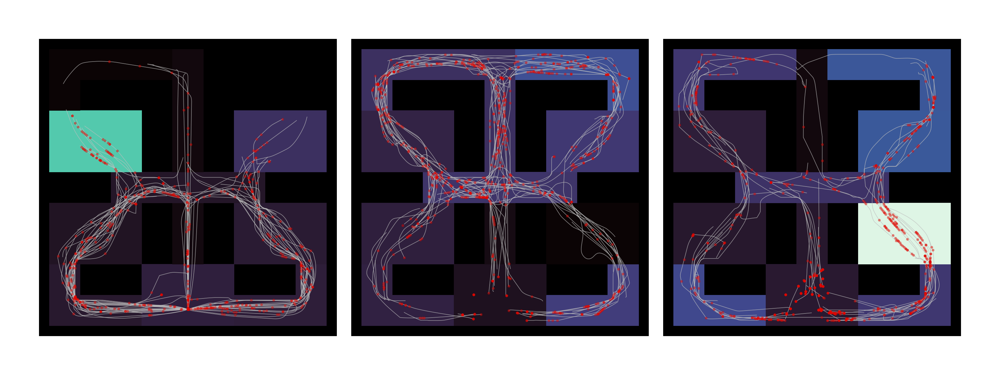

In [252]:
# Plot a neuron's firing rate by maze location for first half, second half of navigation.
# subj_sess_unit = ['U518_ses1-43-3'] # ['U518_ses0-4-1'] # ['U518_ses1-43-1']
# subj_sess_unit = ['U526_ses0-44-1']
# subj_sess_unit = ['U527_ses0-61-1']
# subj_sess_unit = ['U530_ses0-7-3'] # ['U530_ses0-75-1'] # ['U530_ses0-73-1']
subj_sess_unit = ['U532_ses0-5-7'] # ['U532_ses0-15-1'] # ['U532_ses0-15-1']
# subj_sess_unit = ['U536_ses0-68-1'] # ['U536_ses0-13-1'] # ['U536_ses0-9-1'] # ['U536_ses0-72-2'] 
# subj_sess_unit = ['U540_ses0-20-1']
savefig = 1
overwrite = 1
plot_bw = 0
game_states = ['Encoding', 'Retrieval']
dpi = 1200
font = {'tick': 4, 'label': 6, 'fig': 7}
base_color = 'w'
show_spikes = True
only_show_spikes_when_moving = False
time_wins = [(0, 20), (20, 40), (40, 60)]
# ----------------------------------

if subj_sess_unit is None:
    neurons = sig_cells['place']
elif isinstance(subj_sess_unit, str):
    neurons = [subj_sess_unit]
else:
    neurons = subj_sess_unit
    
if plot_bw:
    fr_cmap = 'binary_r'
    base_lw = 0.2
    nav_color = '#296eb4'
    nav_alpha = 0.7
    nav_lw = 0.08
    spike_fill_color = '#e10600'
    spike_edge_color = 'k'
    spike_alpha = 0.5
    spike_markersize = 0.5
    spike_mew = 0
    background_color = 'k'
else:
    fr_cmap = 'mako' # 'rocket'
    base_lw = 0
    nav_color = '#bebebe' # '#3d79b6'
    nav_alpha = 0.7
    nav_lw = 0.1
    spike_fill_color = '#e10600' # '#7ccaa5'
    spike_edge_color = 'k'
    spike_alpha = 0.5
    spike_markersize = 1 # 0.55
    spike_mew = 0 # 0.025
    background_color = 'k'

for subj_sess_unit in neurons:
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])
    fig, ax = time_cell_plots.plot_firing_maze_split_time(
        subj_sess,
        neuron,
        game_states=game_states,
        time_wins=time_wins,
        font=font,
        base_color=base_color,
        base_lw=base_lw,
        fr_cmap=fr_cmap,
        show_spikes=show_spikes,
        only_show_spikes_when_moving=only_show_spikes_when_moving,
        nav_lw=nav_lw,
        nav_color=nav_color,
        nav_alpha=nav_alpha,
        spike_marker='.',
        spike_fill_color=spike_fill_color,
        spike_edge_color=spike_edge_color,
        spike_alpha=spike_alpha,
        spike_markersize=spike_markersize,
        spike_mew=spike_mew,
        wall_cmap=sns.color_palette("light:{}".format(background_color), as_cmap=True),
        background_color=background_color,
        vmin=0.4,
        vmax=4.4,
        no_text=True,
        dpi=dpi)

    if savefig:
        chan, unit = neuron.split('-')
        hemroi = spike_preproc.roi_lookup(subj_sess, chan)
        filename = op.join(proj_dir, 'figs', 'plot_navigation2', 'all', 
                           '{}-CSC{}-unit{}-{}-{}-time_bins-{}-vmin0.4-vmax4.4-time_by_place_firing_maze.png'
                           .format(subj_sess, chan, unit, hemroi, ''.join(game_states),
                                   '-'.join(['_'.join([str(x) for x in time_win]) for time_win in time_wins])))
        if overwrite or not op.exists(filename):
            print('Saving {}'.format(op.basename(filename)))
            fig.savefig(filename, format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
#         filename = filename.replace('.png', '.pdf')
#         if overwrite or not op.exists(filename):
#             fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)

print('{}-{}, {}, time_wins = {}'.format(subj_sess, neuron, '_'.join(game_states), time_wins))
fig.show()

# Visibility matrix

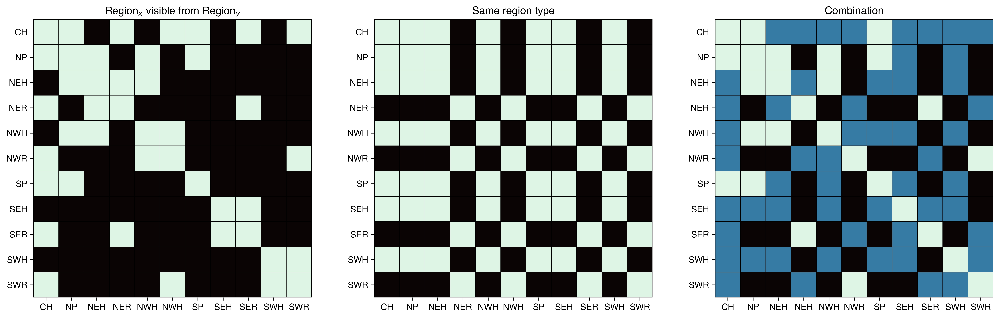

In [963]:
_cmap = 'mako'
maze_regions      = ['CH',  'NP',  'NEH', 'NER', 'NWH', 'NWR', 'SP',  'SEH', 'SER', 'SWH', 'SWR']
views = od([('CH',  [ 1,     1,     0,     1,     0,     1,     1,     0,     1,     0,     1]),
            ('NP',  [ 1,     1,     1,     0,     1,     0,     1,     0,     0,     0,     0]),
            ('NEH', [ 0,     1,     1,     1,     1,     0,     0,     0,     0,     0,     0]),
            ('NER', [ 1,     0,     1,     1,     0,     0,     0,     0,     1,     0,     0]),
            ('NWH', [ 0,     1,     1,     0,     1,     1,     0,     0,     0,     0,     0]),
            ('NWR', [ 1,     0,     0,     0,     1,     1,     0,     0,     0,     0,     1]),
            ('SP',  [ 1,     1,     0,     0,     0,     0,     1,     0,     0,     0,     0]),
            ('SEH', [ 0,     0,     0,     0,     0,     0,     0,     1,     1,     0,     0]),
            ('SER', [ 1,     0,     0,     1,     0,     0,     0,     1,     1,     0,     0]),
            ('SWH', [ 0,     0,     0,     0,     0,     0,     0,     0,     0,     1,     1]),
            ('SWR', [ 1,     0,     0,     0,     0,     1,     0,     0,     0,     1,     1])])
cmap_views = np.array(list(views.values()))

_maze_regions = ['CH',  'NH',  'NEH', 'NER', 'NWH', 'NWR', 'SH',  'SEH', 'SER', 'SWH', 'SWR']
cmap_types = np.zeros((len(_maze_regions), len(_maze_regions)))
for ii in range(cmap_types.shape[0]):
    for jj in range(cmap_types.shape[1]):
        if (_maze_regions[ii][-1] == _maze_regions[jj][-1]):
            cmap_types[ii, jj] = 1

# --------------------------------------------------
plt.close()
fig, ax = plt.subplots(1, 3, figsize=(16, 4), dpi=600)
ax = np.ravel(ax)

iax = 0
ax[iax] = sns.heatmap(cmap_views, ax=ax[iax], square=True,
                      linewidths=0.5, linecolor='k', cmap=_cmap, cbar=False)
ax[iax].set_xticks(np.arange(len(maze_regions)) + 0.5)
ax[iax].set_xticklabels(maze_regions, fontsize=font['tick'])
ax[iax].set_yticks(np.arange(len(maze_regions)) + 0.5)
ax[iax].set_yticklabels(maze_regions, fontsize=font['tick'], rotation=0)
ax[iax].set_title('Region$_x$ visible from Region$_y$', fontsize=font['fig'])

iax = 1
ax[iax] = sns.heatmap(cmap_types, ax=ax[iax], square=True,
                      linewidths=0.5, linecolor='k', cmap=_cmap, cbar=False)
ax[iax].set_xticks(np.arange(len(maze_regions)) + 0.5)
ax[iax].set_xticklabels(maze_regions, fontsize=font['tick'])
ax[iax].set_yticks(np.arange(len(maze_regions)) + 0.5)
ax[iax].set_yticklabels(maze_regions, fontsize=font['tick'], rotation=0)
ax[iax].set_title('Same region type', fontsize=font['fig'])

iax = 2
ax[iax] = sns.heatmap(cmap_views + cmap_types, ax=ax[iax], square=True,
                      linewidths=0.5, linecolor='k', cmap=_cmap, cbar=False)
ax[iax].set_xticks(np.arange(len(maze_regions)) + 0.5)
ax[iax].set_xticklabels(maze_regions, fontsize=font['tick'])
ax[iax].set_yticks(np.arange(len(maze_regions)) + 0.5)
ax[iax].set_yticklabels(maze_regions, fontsize=font['tick'], rotation=0)
ax[iax].set_title('Combination', fontsize=font['fig'])

fig.tight_layout(pad=-3)
fig.show()

# Time vs. place remapping

In [59]:
delay_time_cells = ['U518_ses1-37-1', 'U518_ses1-11-1', 'U518_ses1-73-2',
                    'U526_ses0-21-1', 'U518_ses1-12-1', 'U518_ses1-15-2',
                    'U518_ses0-36-1', 'U518_ses0-78-3', 'U518_ses1-38-1',
                    'U518_ses0-15-1', 'U518_ses0-16-2', 'U518_ses0-4-1',
                    'U518_ses0-78-1', 'U518_ses0-42-1', 'U518_ses0-9-1',
                    'U518_ses1-4-1',  'U518_ses0-32-1', 'U518_ses0-4-2',
                    'U518_ses0-16-1', 'U518_ses0-78-2', 'U518_ses0-73-1',
                    'U518_ses0-30-1', 'U518_ses0-38-2', 'U521_ses0-19-2',
                    'U518_ses0-40-1', 'U521_ses0-19-1', 'U518_ses0-13-2',
                    'U518_ses0-11-1', 'U527_ses0-17-1', 'U530_ses0-73-1',
                    'U530_ses1-13-1', 'U530_ses0-75-1', 'U530_ses0-82-2',
                    'U527_ses0-45-1', 'U527_ses0-12-1', 'U527_ses0-57-1',
                    'U530_ses0-13-1', 'U530_ses0-20-1', 'U530_ses0-5-1',
                    'U530_ses0-48-3', 'U530_ses0-67-1', 'U530_ses1-16-3',
                    'U530_ses1-71-1', 'U536_ses0-22-1', 'U536_ses0-20-1',
                    'U536_ses0-20-4', 'U536_ses0-24-2', 'U530_ses1-79-1',
                    'U532_ses0-5-6',  'U530_ses1-80-3', 'U532_ses0-5-4',
                    'U532_ses0-5-1',  'U532_ses0-8-1',  'U532_ses0-4-1',
                    'U532_ses0-16-1', 'U532_ses0-8-2',  'U532_ses0-10-1',
                    'U532_ses0-11-1', 'U532_ses0-20-1', 'U532_ses0-7-1',
                    'U532_ses0-6-1',  'U532_ses0-22-1', 'U532_ses0-21-1',
                    'U532_ses0-12-1', 'U532_ses0-24-1', 'U532_ses0-21-2',
                    'U532_ses0-42-3', 'U532_ses0-19-1', 'U532_ses0-23-1',
                    'U532_ses0-46-1', 'U532_ses0-47-1', 'U532_ses0-45-3',
                    'U536_ses0-8-1',  'U536_ses0-29-1', 'U536_ses0-31-2',
                    'U536_ses0-36-1', 'U536_ses0-38-1', 'U536_ses0-36-2',
                    'U536_ses0-38-2', 'U536_ses0-39-3', 'U540_ses0-40-1',
                    'U540_ses0-41-1', 'U536_ses0-58-1', 'U536_ses0-60-1',
                    'U536_ses0-59-1', 'U536_ses0-63-1', 'U536_ses0-65-1',
                    'U537_ses0-24-1', 'U536_ses0-72-1', 'U537_ses0-10-1',
                    'U537_ses0-15-1', 'U537_ses0-33-2', 'U536_ses0-76-1',
                    'U539_ses0-14-2', 'U539_ses0-55-1', 'U540_ses0-11-1',
                    'U540_ses0-19-1', 'U540_ses0-33-1', 'U540_ses0-34-1']
delay_interval_cells = ['U518_ses1-78-1', 'U518_ses1-36-1', 'U518_ses0-78-3',
                        'U518_ses1-42-1', 'U518_ses1-4-1', 'U526_ses0-41-1',
                        'U521_ses0-20-1', 'U518_ses0-40-1', 'U526_ses0-14-2',
                        'U526_ses0-12-2', 'U526_ses0-17-3', 'U526_ses0-44-1',
                        'U530_ses0-71-1', 'U530_ses1-13-1', 'U530_ses1-15-1',
                        'U527_ses0-18-1', 'U527_ses0-44-4', 'U527_ses0-43-2',
                        'U527_ses0-45-2', 'U527_ses0-44-2', 'U527_ses0-41-1',
                        'U527_ses0-58-2', 'U527_ses0-60-1', 'U527_ses0-12-1',
                        'U527_ses0-17-2', 'U527_ses0-44-3', 'U527_ses0-57-1',
                        'U527_ses0-9-1', 'U527_ses0-20-1', 'U527_ses0-16-2',
                        'U527_ses0-13-2', 'U527_ses0-43-1', 'U530_ses0-3-2',
                        'U530_ses0-5-2', 'U530_ses0-45-1', 'U530_ses0-69-1',
                        'U530_ses0-67-2', 'U530_ses0-68-1', 'U530_ses1-47-2',
                        'U532_ses0-5-2', 'U532_ses0-4-2', 'U532_ses0-2-2', 'U532_ses0-4-3',
                        'U532_ses0-6-3', 'U532_ses0-8-1', 'U532_ses0-4-1', 'U532_ses0-8-2',
                        'U532_ses0-9-1', 'U532_ses0-20-1', 'U532_ses0-12-2',
                        'U532_ses0-21-1', 'U532_ses0-17-1', 'U532_ses0-21-2',
                        'U532_ses0-46-2', 'U532_ses0-44-2', 'U532_ses0-46-1',
                        'U532_ses0-60-1', 'U536_ses0-34-2', 'U536_ses0-38-1',
                        'U536_ses0-36-2', 'U537_ses0-24-1', 'U536_ses0-72-1',
                        'U536_ses0-76-1', 'U539_ses0-11-2', 'U536_ses0-72-2',
                        'U539_ses0-55-1', 'U539_ses0-50-1', 'U540_ses0-36-1',
                        'U540_ses0-27-1', 'U540_ses0-22-1']
len(delay_time_cells), len(delay_interval_cells)

(99, 70)

In [92]:
(mod_pairs.query("(testvar=={})".format(nav_testvars))
          .groupby('testvar', observed=True)
          .agg({'sig': count_pct}))

,sig
testvar,
gameState,59/457 (12.9%)
time,23/457 (5.0%)
gameState:time,64/457 (14.0%)
place,60/457 (13.1%)
gameState:place,25/457 (5.5%)
time:place,43/457 (9.4%)
max-gameState,43/457 (9.4%)
max-time,20/457 (4.4%)
max-gameState:time,45/457 (9.8%)


In [1306]:
nav_testvars = ['gameState', 'gameState:time', 'place', 'time:place']
alpha = 0.05
delay_cells = od([('gameState', delay_interval_cells),
                  ('time', delay_time_cells)])
all_cells = mod_pairs['subj_sess_unit'].unique().tolist()

for delay_testvar in delay_cells:
    for nav_testvar in nav_testvars:
        
        _delay_cells = delay_cells[delay_testvar]
        _nav_cells = sig_cells[nav_testvar]
        
        ctab = [[len([x for x in all_cells if x not in set(_delay_cells + _nav_cells)]),
                 len([x for x in _delay_cells if x not in _nav_cells])],
                [len([x for x in _nav_cells if x not in _delay_cells]),
                 len([x for x in _delay_cells if x in _nav_cells])]]
        chi2, pval, dof, _ = stats.chi2_contingency(ctab)
        
        print('{:<18} in {:<18} : {:<13}, χ²({}) = {:.1f}, p = {:.6f}, reject = {}'
              .format('-'.join(('nav', nav_testvar)), '-'.join(('delay', delay_testvar)),
                      count_pct(np.isin(_nav_cells, _delay_cells)),
                      dof, chi2, pval, pval<alpha))
print('')
for delay_testvar in delay_cells:
    for nav_testvar in nav_testvars:
        _delay_cells = delay_cells[delay_testvar]
        _nav_cells = sig_cells[nav_testvar]
        print('{:<18} in {:<18} : {}'.format('-'.join(('delay', delay_testvar)), '-'.join(('nav', nav_testvar)),
                                             count_pct(np.isin(_delay_cells, _nav_cells))))

nav-gameState      in delay-gameState    : 12/59 (20.3%), χ²(1) = 0.9, p = 0.340102, reject = False
nav-gameState:time in delay-gameState    : 25/64 (39.1%), χ²(1) = 30.3, p = 0.000000, reject = True
nav-place          in delay-gameState    : 8/60 (13.3%) , χ²(1) = 0.1, p = 0.790616, reject = False
nav-time:place     in delay-gameState    : 4/43 (9.3%)  , χ²(1) = 0.9, p = 0.353306, reject = False
nav-gameState      in delay-time         : 16/59 (27.1%), χ²(1) = 0.8, p = 0.357196, reject = False
nav-gameState:time in delay-time         : 10/64 (15.6%), χ²(1) = 1.2, p = 0.270962, reject = False
nav-place          in delay-time         : 18/60 (30.0%), χ²(1) = 2.3, p = 0.130077, reject = False
nav-time:place     in delay-time         : 16/43 (37.2%), χ²(1) = 5.8, p = 0.016148, reject = True

delay-gameState    in nav-gameState      : 12/70 (17.1%)
delay-gameState    in nav-gameState:time : 25/70 (35.7%)
delay-gameState    in nav-place          : 8/70 (11.4%)
delay-gameState    in nav-time

In [91]:
_a = set(delay_interval_cells)
_b = set(sig_cells['gameState'])
dice_coef = (2 * len(_a & _b)) / (len(_a) + len(_b))
jaccard_score = len(_a & _b) / (len(_a) + len(_b) - len(_a & _b))
print('{} delay interval cells, {} nav interval cells, {} both, {} total'
      .format(len(_a), len(_b), len(_a & _b), len(_a | _b)),
      'dice = {:.2f}, jaccard = {:.2f}'.format(dice_coef, jaccard_score),
      sep='\n')

70 delay interval cells, 59 nav interval cells, 12 both, 117 total
dice = 0.19, jaccard = 0.10


In [88]:
12/70, 12/59, 70/453, 59/453

(0.17142857142857143,
 0.2033898305084746,
 0.1545253863134658,
 0.13024282560706402)

In [1310]:
for idx in [(ii, jj) for ii in range(len(testvars)) for jj in range(len(testvars)) if (jj>ii)]:
    testvar1 = testvars[idx[0]]
    testvar2 = testvars[idx[1]]
    
    ctab = [[len([x for x in all_cells if x not in set(sig_cells[testvar1] + sig_cells[testvar2])]),
                 len([x for x in sig_cells[testvar1] if x not in sig_cells[testvar2]])],
                [len([x for x in sig_cells[testvar2] if x not in sig_cells[testvar1]]),
                 len([x for x in sig_cells[testvar1] if x in sig_cells[testvar2]])]]
    chi2, pval, dof, _ = stats.chi2_contingency(ctab)
    
    print('{} in {}: {}, χ²({}) = {:.1f}, p = {:.6f}, reject = {}'
          .format(testvar1, testvar2,
                  count_pct(np.isin(sig_cells[testvar1], sig_cells[testvar2])),
                  dof, chi2, pval, pval<alpha))
    print('{} in {}: {}'.format(testvar2, testvar1,
                                count_pct(np.isin(sig_cells[testvar2], sig_cells[testvar1]))))

gameState in gameState:time: 13/59 (22.0%), χ²(1) = 2.9, p = 0.088489, reject = False
gameState:time in gameState: 13/64 (20.3%)
gameState in place: 5/59 (8.5%), χ²(1) = 0.9, p = 0.353484, reject = False
place in gameState: 5/60 (8.3%)
gameState in time:place: 7/59 (11.9%), χ²(1) = 0.2, p = 0.650363, reject = False
time:place in gameState: 7/43 (16.3%)
gameState:time in place: 10/64 (15.6%), χ²(1) = 0.2, p = 0.661388, reject = False
place in gameState:time: 10/60 (16.7%)
gameState:time in time:place: 4/64 (6.2%), χ²(1) = 0.5, p = 0.482278, reject = False
time:place in gameState:time: 4/43 (9.3%)
place in time:place: 4/60 (6.7%), χ²(1) = 0.3, p = 0.586811, reject = False
time:place in place: 4/43 (9.3%)


In [1360]:
# Compare encoding vs. retrieval firing rate similarity
# for time and place cells, respectively.
game_states = ['Encoding', 'Retrieval']
alpha = 0.05
verbose = False

# Get all time and place cells.
all_cells = mod_pairs['subj_sess_unit'].unique().tolist()
time_cells = list(set(sig_cells['time'] + sig_cells['gameState:time']))
place_cells = list(set(sig_cells['place'] + sig_cells['gameState:place']))
if verbose:
    print('{} time cells, {} place cells, {} time or place cells'
          .format(len(time_cells), len(place_cells), len(set(time_cells + place_cells))))
    print('{} time cells are place cells; {} place cells are time cells'
          .format(count_pct(np.isin(time_cells, place_cells)), count_pct(np.isin(place_cells, time_cells))))
    
# Load all event_spikes dataframes.
event_spikes = od([])
for subj_sess in sessions:
    event_spikes[subj_sess] = time_bin_analysis.load_event_spikes(subj_sess, verbose=False)
    
# Get time cell encoding vs. retrieval correlations.
time_cell_corrs = od([])
for subj_sess_unit in time_cells:
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])
    _event_spikes = event_spikes[subj_sess].event_spikes
    
    fr_means = (_event_spikes.query("(gameState=={})".format(game_states))
                             .groupby(['gameState', 'time_step'], observed=True)[neuron]
                             .apply(np.mean))
    time_cell_corrs[subj_sess_unit] = stats.pearsonr(fr_means.iloc[fr_means.index.get_level_values('gameState')==game_states[0]].values,
                                                     fr_means.iloc[fr_means.index.get_level_values('gameState')==game_states[1]].values)[0]
    
place_cell_corrs = od([])
for subj_sess_unit in place_cells:
    subj_sess = subj_sess_unit.split('-')[0]
    neuron = '-'.join(subj_sess_unit.split('-')[1:])
    _event_spikes = event_spikes[subj_sess].event_spikes
    
    fr_means = (_event_spikes.query("(gameState=={})".format(game_states))
                             .groupby(['gameState', 'maze_region'], observed=True)[neuron]
                             .apply(np.mean))
    place_cell_corrs[subj_sess_unit] = stats.pearsonr(fr_means.iloc[fr_means.index.get_level_values('gameState')==game_states[0]].values,
                                                      fr_means.iloc[fr_means.index.get_level_values('gameState')==game_states[1]].values)[0]
    
# Do place cells have higher Encoding vs. Retrieval correlations than time cells?
dof = len(time_cell_corrs) + len(place_cell_corrs) - 2
tval, pval = stats.ttest_ind(list(place_cell_corrs.values()), list(time_cell_corrs.values()), equal_var=False)
    
print('{} time cells, r = {}'.format(len(time_cell_corrs), mean_sem(list(time_cell_corrs.values()))))
print('{} place cells, r = {}'.format(len(place_cell_corrs), mean_sem(list(place_cell_corrs.values()))))
print('t({}) = {:.1f}, p = {:.6f}, reject = {}'.format(dof, tval, pval, pval<alpha))

85 time cells, r = -0.00 ± 0.05
82 place cells, r = 0.31 ± 0.04
t(165) = 4.8, p = 0.000004, reject = True


In [41]:
len(list(np.unique(sig_cells['time'] + sig_cells['gameState:time'])))

85

In [49]:
qry = "(subj_sess_unit=={}) & (testvar=={}) & (sig==True)"
(mod_pairs
 .query(qry.format(list(np.unique(sig_cells['time'] + sig_cells['gameState:time'])), ['time', 'gameState:time']))
 .sort_values('z_lr', ascending=False)
 .drop_duplicates('subj_sess_unit'))

(85, 29)

In [53]:
# Do time and place cells differ in strength?
qry = "(subj_sess_unit=={}) & (testvar=={}) & (sig==True)"
zvals = od([])
for testvar in ['time', 'place']:
    zvals[testvar] = (mod_pairs
                      .query(qry.format(list(np.unique(sig_cells[testvar] + sig_cells['gameState:{}'.format(testvar)])),
                                        [testvar, 'gameState:{}'.format(testvar)]))
                      .sort_values('z_lr', ascending=False)
                      .drop_duplicates('subj_sess_unit')['z_lr'].tolist())

for key in zvals:
    print('{} {} cells, Z-LR = {}'.format(len(zvals[key]), key, mean_sem(zvals[key])))
dof = len(zvals['time']) + len(zvals['place']) - 2
tval, pval = stats.ttest_ind(zvals['time'], zvals['place'], equal_var=False)
print('t({}) = {:.1f}, p = {:.6f}, reject = {}'.format(dof, tval, pval, pval<alpha))

85 time cells, Z-LR = 3.63 ± 0.28
82 place cells, Z-LR = 3.40 ± 0.21
t(165) = 0.7, p = 0.511426, reject = False


In [1380]:
# Do time and place cells differ in strength?
qry = "(subj_sess_unit=={}) & (testvar=='{}')"
zvals = od([])
for testvar in ['gameState:time', 'place']:
    key = 'time' if 'time' in testvar else 'place'
    zvals[key] = zvals.get(key, []) + mod_pairs.query(qry.format(sig_cells[testvar], testvar))['z_lr'].tolist()

for key in zvals:
    print('{} {} cells, Z-LR = {}'.format(len(zvals[key]), key, mean_sem(zvals[key])))
dof = len(zvals['time']) + len(zvals['place']) - 2
tval, pval = stats.ttest_ind(zvals['time'], zvals['place'], equal_var=False)
print('t({}) = {:.1f}, p = {:.6f}, reject = {}'.format(dof, tval, pval, pval<alpha))

64 time cells, Z-LR = 3.81 ± 0.36
60 place cells, Z-LR = 3.62 ± 0.28
t(122) = 0.4, p = 0.684629, reject = False


-0.8082861102666302 0.8954141180031254


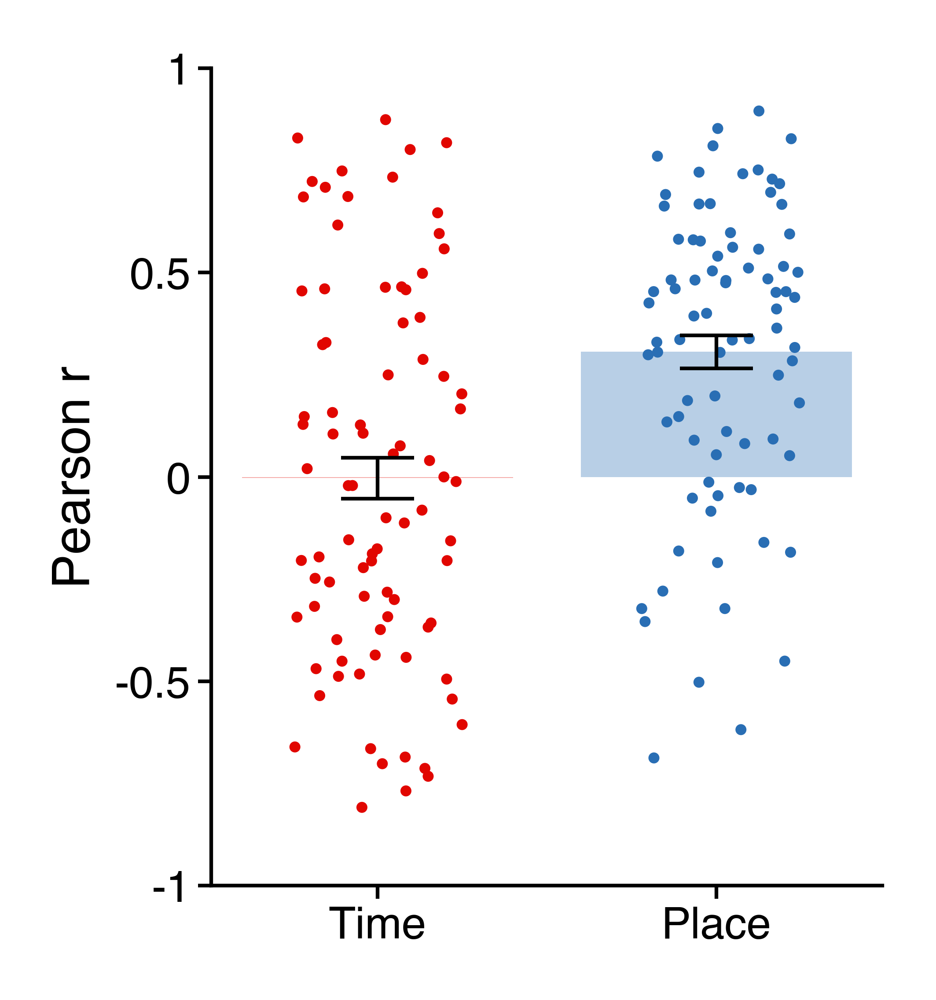

In [1375]:
savefig = 0
overwrite = 1
figsize = (colws[1]*0.8, colws[1])
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ymin = -1
ymax = 1
yticks = [-1, -0.5, 0, 0.5, 1]
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
linewidth = 1
fliersize = 2.5
palette = ['#e10600', '#296eb4']

# ---------------------
# Create the plot dataframe.
mean_corrs = pd.DataFrame(np.vstack((np.vstack((list(time_cell_corrs.keys()),
                                                ['time'] * len(time_cell_corrs),
                                                list(time_cell_corrs.values()))).T,
                                     np.vstack((list(place_cell_corrs.keys()),
                                                ['place'] * len(place_cell_corrs),
                                                list(place_cell_corrs.values()))).T)),
                           columns=['subj_sess_unit', 'level', 'value'])
mean_corrs['level'] = mean_corrs['level'].astype(pd.CategoricalDtype(['time', 'place'], ordered=True))
mean_corrs['value'] = mean_corrs['value'].astype(float)
print(mean_corrs['value'].min(), mean_corrs['value'].max())

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
ax[iax] = sns.barplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                      ci=None,
                      palette=palette,
                      saturation=1, alpha=0.33, zorder=0)
ax[iax] = sns.stripplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                        palette=palette,
                        size=1.5, alpha=1, jitter=0.25, zorder=1)
ax[iax].errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
                 yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                 ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
for axis in ['left', 'bottom']:
    ax[iax].spines[axis].set_linewidth(spine_lw)
ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
ax[iax].set_xticks(np.arange(mean_corrs['level'].unique().size))
ax[iax].set_xticklabels(['Time', 'Place'], fontsize=font['tick'])
ax[iax].set_xlabel('')
ax[iax].set_ylim([ymin, ymax])
ax[iax].set_yticks(yticks)
ax[iax].set_yticklabels(yticks, fontsize=font['tick'])
ax[iax].set_ylabel('Pearson r', fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation2', 
                       'time_vs_place_cell_corrs-{}time_cells-{}place_cells-{}units.pdf'
                       .format(len(time_cell_corrs),len(place_cell_corrs), len(all_cells)))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()